In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.nonparametric.smoothers_lowess import lowess
from clust_huge_amp import *
import warnings
warnings.filterwarnings("ignore", category=RuntimeWarning, module="sklearn.utils.extmath")


## here we're running with the likelihood only 

In [283]:
%load_ext autoreload
%autoreload 2



%autoreload 2
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from scipy.spatial.distance import pdist, squareform
from scipy.special import expit
from scipy.stats import multivariate_normal
import matplotlib.pyplot as plt
from sklearn.cluster import SpectralClustering  # Add this import

def load_model_essentials(base_path='/Users/sarahurbut/Dropbox/data_for_running/'):
    """
    Load all essential components
    """
    print("Loading components...")
    
    # Load large matrices
    Y = torch.load(base_path + 'Y_tensor.pt')
    E = torch.load(base_path + 'E_matrix.pt')
    G = torch.load(base_path + 'G_matrix.pt')
    
    # Load other components
    essentials = torch.load(base_path + 'model_essentials.pt')
    
    print("Loaded all components successfully!")
    
    return Y, E, G, essentials

# Load and initialize model:
Y, E, G, essentials = load_model_essentials()


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Loading components...


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_94256/945457161.py:24: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  Y = torch.load(base_path + 'Y_tensor.pt')
/va

Loaded all components successfully!


In [3]:
def plot_signature_introduction(model_path, n_top_diseases=8, selected_signatures=None, figsize=(20, 15)):
    """
    Creates a 3-panel figure introducing signatures:
    A. Heatmap showing disease-signature associations (based on phi deviation from mean)
    B. Temporal patterns of top diseases for selected signatures
    C. Example of how one disease manifests across different signatures
    
    Args:
        model_path (str): Path to model file (e.g., MGH model)
        n_top_diseases (int): Number of top diseases to show per signature
        selected_signatures (list): Which signatures to highlight
    """
    # Load model data
    model_data = torch.load(model_path, map_location=torch.device('cpu'))
    phi = model_data['model_state_dict']['phi']
    disease_names = model_data.get('disease_names', [f"Disease {i}" for i in range(phi.shape[1])])
    
    # Convert to numpy and calculate centered phi
    phi_np = phi.detach().cpu().numpy()
    K_total, D, T = phi_np.shape
    
    # Center phi by temporal mean for each disease
    phi_centered = np.zeros_like(phi_np)
    for k in range(K_total):
        for d in range(D):
            phi_centered[k, d, :] = phi_np[k, d, :] - np.mean(phi_np[:, d, :], axis=0)
    
    # Calculate average centered phi for overall disease-signature associations
    phi_avg = phi_centered.mean(axis=2)
    
    if selected_signatures is None:
        selected_signatures = [0, 5, 15, 18]  # Example signatures of interest
    
    # Create figure with 3 panels
    fig = plt.figure(figsize=figsize)
    gs = gridspec.GridSpec(2, 2, width_ratios=[1.5, 1])
    
    # Panel A: Disease-Signature Association Heatmap (left column, full height)
    ax_heatmap = fig.add_subplot(gs[:, 0])
    # Sort diseases by their strongest signature association
    max_sig = np.argmax(np.abs(phi_avg), axis=0)
    disease_order = np.argsort(max_sig)
    phi_avg_sorted = phi_avg[:, disease_order]
    
    im = ax_heatmap.imshow(phi_avg_sorted, aspect='auto', cmap='RdBu_r', 
                          vmin=-np.max(np.abs(phi_avg)), vmax=np.max(np.abs(phi_avg)))
    ax_heatmap.set_title('A: Disease-Signature Associations\n(Deviation from Population Mean)')
    ax_heatmap.set_xlabel('Diseases (sorted by primary signature)')
    ax_heatmap.set_ylabel('Signature Index')
    plt.colorbar(im, ax=ax_heatmap)
    
    # Panel B: Temporal patterns for selected signatures (top right)
    ax_temporal = fig.add_subplot(gs[0, 1])
    for k in selected_signatures:
        # Get top diseases for this signature
        top_diseases = np.argsort(-np.abs(phi_avg[k]))[:n_top_diseases]
        for d in top_diseases[:3]:  # Plot top 3 to avoid overcrowding
            ax_temporal.plot(phi_centered[k, d], 
                           label=f'{disease_names[d][:30]}... (Sig {k})')
    ax_temporal.set_title('B: Temporal Patterns of Top Diseases')
    ax_temporal.set_xlabel('Time')
    ax_temporal.set_ylabel('Phi (centered)')
    ax_temporal.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
    
    # Panel C: One disease across signatures (bottom right)
    ax_cross = fig.add_subplot(gs[1, 1])
    # Find an interesting disease (high variance across signatures)
    disease_var = np.var(phi_centered, axis=(0,2))
    interesting_disease = np.argmax(disease_var)
    for k in range(K_total):
        ax_cross.plot(phi_centered[k, interesting_disease], 
                     label=f'Signature {k}')
    ax_cross.set_title(f'C: {disease_names[interesting_disease][:40]}...\nAcross Signatures')
    ax_cross.set_xlabel('Time')
    ax_cross.set_ylabel('Phi (centered)')
    ax_cross.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
    
    plt.tight_layout()
    return fig

# Example usage with MGH model
model_path = '/Users/sarahurbut/Dropbox/model_with_kappa_bigam_MGB.pt'
fig = plot_signature_introduction(model_path)
plt.show()

/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_94256/432067985.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model_data = torch.load(model_path, map_locat

NameError: name 'gridspec' is not defined

<Figure size 2000x1500 with 0 Axes>

In [ ]:
plot_signature_introduction(, n_top_diseases=8, selected_signatures=None, figsize=(20, 15))

In [4]:

# Subset the data
Y_100k, E_100k, G_100k, indices = subset_data(Y, E, G, start_index=0, end_index=10000)

torch.manual_seed(42)
np.random.seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed(42)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False
# Initialize model with subsetted data

del Y

In [5]:
# Load references (signatures only, no healthy)
refs = torch.load('/Users/sarahurbut/Dropbox/data_for_running/reference_trajectories.pt')
signature_refs = refs['signature_refs']
# When initializing the model:


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_94256/986570307.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  refs = torch.load('/Users/sarahurbut/Dropbox/d

In [6]:
from clust_huge_amp import AladynSurvivalFixedKernelsAvgLoss_clust_logitInit_psitest

# Define the parameters
N=Y_100k.shape[0]
D=Y_100k.shape[1]
T=Y_100k.shape[2]
K=20 # Or whatever your K value is
P=G_100k.shape[1]
G=G_100k
Y=Y_100k
init_sd_scaler=1e-1
genetic_scale=1
W=0.0001
prevalence_t=essentials['prevalence_t']
R=0
healthy_reference=True
signature_refs=signature_refs  # Make sure this is defined
disease_names=essentials['disease_names']

# Create the full model
full_model = AladynSurvivalFixedKernelsAvgLoss_clust_logitInit_psitest(
    N=N, D=D, T=T, K=K, P=P, G=G, Y=Y, R=R, W=W,
    prevalence_t=prevalence_t, init_sd_scaler=init_sd_scaler,
    genetic_scale=genetic_scale, 
    signature_references=signature_refs,
    healthy_reference=healthy_reference,
    disease_names=disease_names
)

/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp.py:73: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.signature_refs = torch.tensor(signature_references, dtype=torch.float32)
/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp.py:80: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.G = torch.tensor(G, dtype=torch.float32)
/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp.py:83: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.G = torch.tensor(G_scaled, dtype=torch.float32)
/Users/sarahurbut/aladynoulli2/pyScripts


Cluster Sizes:
Cluster 0: 14 diseases
Cluster 1: 7 diseases
Cluster 2: 21 diseases
Cluster 3: 15 diseases
Cluster 4: 17 diseases
Cluster 5: 16 diseases
Cluster 6: 57 diseases
Cluster 7: 18 diseases
Cluster 8: 13 diseases
Cluster 9: 11 diseases
Cluster 10: 18 diseases
Cluster 11: 12 diseases
Cluster 12: 26 diseases
Cluster 13: 7 diseases
Cluster 14: 9 diseases
Cluster 15: 8 diseases
Cluster 16: 7 diseases
Cluster 17: 11 diseases
Cluster 18: 6 diseases
Cluster 19: 55 diseases

Calculating gamma for k=0:
Number of diseases in cluster: 14
Base value (first 5): tensor([-18.4207, -18.4207, -17.3858, -16.3508, -16.3508])
Base value centered (first 5): tensor([-0.5458, -0.5458,  0.4891,  1.5240,  1.5240])
Base value centered mean: 3.23352810482902e-06
Gamma init for k=0 (first 5): tensor([ 0.0013,  0.0101,  0.0173,  0.0224, -0.0156])

Calculating gamma for k=1:
Number of diseases in cluster: 7
Base value (first 5): tensor([-18.4207, -18.4207, -18.4207, -18.4207, -18.4207])
Base value centered

In [21]:

def compare_with_pce_filtered(model, pce_df, ascvd_indices=[111,112,113,114,115,116]):
    """
    Compare 10-year predictions using single timepoint prediction, handling missing PCE values
    """
    our_10yr_risks = []
    actual_10yr = []

    # Get predictions
    pi = model.forward()[0].detach().numpy()
    
    # Get mean risks across patients for calibration
    predicted_risk_2d = pi.mean(axis=0)  # Shape: [D, T]
    observed_risk_2d = model.Y.numpy().mean(axis=0)  # Shape: [D, T]
    
    # Sort and get LOESS calibration curve
    pred_flat = predicted_risk_2d.flatten()
    obs_flat = observed_risk_2d.flatten()
    sort_idx = np.argsort(pred_flat)
    smoothed = lowess(obs_flat[sort_idx], pred_flat[sort_idx], frac=0.3)
    
    # Apply calibration to all predictions using interpolation
    pi_calibrated = np.interp(pi.flatten(), smoothed[:, 0], smoothed[:, 1]).reshape(pi.shape)
    
    # Calculate 10-year risks using only enrollment time prediction
    for patient_idx, row in enumerate(pce_df.itertuples()):
        enroll_time = int(row.age - 30)
        if enroll_time + 10 >= model.T:
            continue
            
        # Only use predictions at enrollment time
        pi_ascvd = pi_calibrated[patient_idx, ascvd_indices, enroll_time]
        
        # Calculate 1-year risk first
        yearly_risk = 1 - np.prod(1 - pi_ascvd)
        
        # Convert to 10-year risk
        risk = 1 - (1 - yearly_risk)**10
        our_10yr_risks.append(risk)
        
        # Still look at actual events over 10 years
        Y_ascvd = model.Y[patient_idx, ascvd_indices, enroll_time:enroll_time+10]
        actual = torch.any(torch.any(Y_ascvd, dim=0))
        actual_10yr.append(actual.item())
   
    our_10yr_risks = np.array(our_10yr_risks)
    actual_10yr = np.array(actual_10yr)
    pce_risks = pce_df['pce_goff'].values[:len(our_10yr_risks)]

    # Get indices of non-missing PCE values
    non_missing_idx = ~np.isnan(pce_risks)

    # Filter all arrays to only include non-missing cases
    our_10yr_risks_filtered = our_10yr_risks[non_missing_idx]
    actual_10yr_filtered = actual_10yr[non_missing_idx]
    pce_risks_filtered = pce_risks[non_missing_idx]

    # Calculate ROC AUCs on filtered data
    our_auc = roc_auc_score(actual_10yr_filtered, our_10yr_risks_filtered)
    pce_auc = roc_auc_score(actual_10yr_filtered, pce_risks_filtered)

    # Print results with sample size info
    n_total = len(our_10yr_risks)
    n_complete = len(our_10yr_risks_filtered)
    print(f"\nROC AUC Comparison (10-year prediction from enrollment):")
    print(f"Sample size: {n_complete}/{n_total} ({n_complete/n_total*100:.1f}% complete cases)")
    print(f"Our model: {our_auc:.3f}")
    print(f"PCE: {pce_auc:.3f}")
    
    plt.figure(figsize=(8,6))
    plot_roc_curve(actual_10yr_filtered, our_10yr_risks_filtered, label=f'Our Model (AUC={our_auc:.3f})')
    plot_roc_curve(actual_10yr_filtered, pce_risks_filtered, label=f'PCE (AUC={pce_auc:.3f})')
    plt.plot([0,1], [0,1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curves for 10-year ASCVD Prediction')
    plt.legend()
    plt.grid(True)
    plt.show()

    return our_10yr_risks_filtered, actual_10yr_filtered, pce_risks_filtered 


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_94256/61281001.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  full_model.load_state_dict(torch.load(model_sav


ROC AUC Comparison (10-year prediction from enrollment):
Sample size: 7817/10000 (78.2% complete cases)
Our model: 0.799
PCE: 0.711


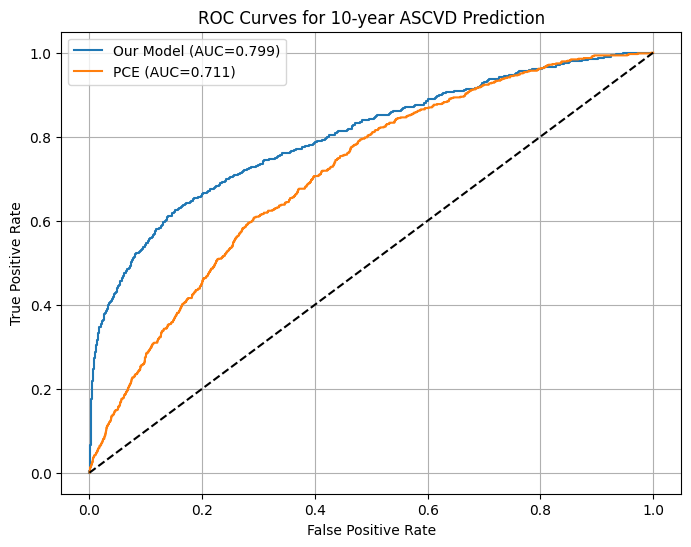

(array([0.15930697, 0.0068917 , 0.13593618, ..., 0.21290805, 0.07285289,
        0.01856403]),
 array([False, False, False, ...,  True, False, False]),
 array([0.20861924, 0.12870708, 0.12895867, ..., 0.13201657, 0.11094535,
        0.0075447 ]))

In [22]:
#model_save_path='/Users/sarahurbut/Dropbox/model_with_kappa_bigam.pt'
model_save_path='/Users/sarahurbut/Dropbox/resultshighamp/results/output_0_10000/model.pt'
full_model.load_state_dict(torch.load(model_save_path)['model_state_dict'])
full_model.clusters = torch.load(model_save_path)['clusters']
#full_model.psi = torch.load(model_save_path)['psi']
full_model.Y = torch.load(model_save_path)['Y']
full_model.prevalence_t = torch.load(model_save_path)['prevalence_t']
full_model.logit_prev_t = torch.load(model_save_path)['logit_prevalence_t']
full_model.G = torch.load(model_save_path)['G']


from utils import * 

compare_with_pce_filtered(full_model, pce_df, ascvd_indices=[111,112,113,114,115,116])


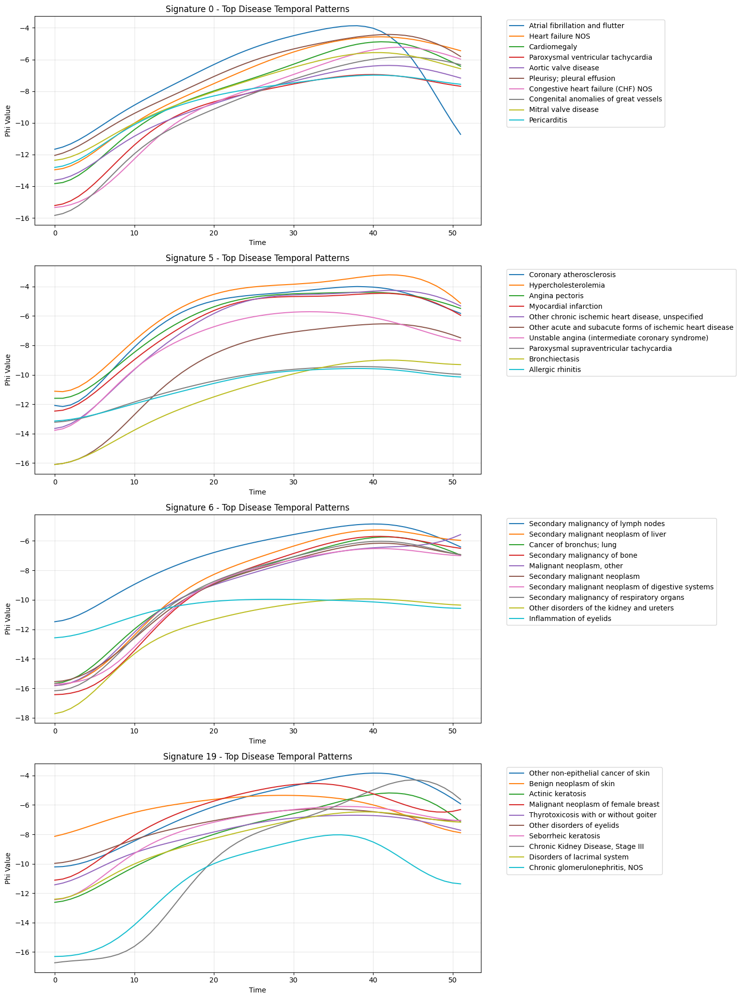

In [15]:
from utils import *
plot_signature_temporal_patterns(full_model, essentials['disease_names'], n_top=10, selected_signatures=[0,5,6,19])

In [39]:
# 3. Extract pretrained phi and psi
pretrained_phi = full_model.phi.detach().clone()
pretrained_psi = full_model.psi.detach().clone()

# 4. Create a new fixed phi model
from clust_huge_amp_fixedPhi import AladynSurvivalFixedPhi

test_model = AladynSurvivalFixedPhi(
    N=full_model.N, 
    D=full_model.D, 
    T=full_model.T, 
    K=full_model.K,
    P=full_model.P, 
    G=full_model.G.numpy(),
    Y=full_model.Y.numpy(),
    R=full_model.lrtpen,
    W=full_model.gpweight,
    prevalence_t=full_model.prevalence_t,
    init_sd_scaler=full_model.lambda_amplitude_init,
    genetic_scale=full_model.genetic_scale,
    pretrained_phi=pretrained_phi,
    pretrained_psi=pretrained_psi,
    signature_references=full_model.signature_refs,
    healthy_reference=full_model.healthy_ref.item() if hasattr(full_model, 'healthy_ref') else None,
    disease_names=full_model.disease_names
)


/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp_fixedPhi.py:61: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  
/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp_fixedPhi.py:62: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  
/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp_fixedPhi.py:75: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  else:


Pre-calculated phi GP loss: 75.8527

Calculating gamma for k=0:
Number of diseases in signature: 8.0
Base value (first 5): tensor([0.0000, 0.0000, 0.0000, 0.0048, 0.0000])
Base value centered (first 5): tensor([-0.0003, -0.0003, -0.0003,  0.0045, -0.0003])
Base value centered mean: 1.3969838740662821e-12
Gamma init for k=0 (first 5): tensor([ 1.1403e-05,  1.8625e-05, -1.0852e-05,  2.2595e-05,  3.4832e-05])

Calculating gamma for k=1:
Number of diseases in signature: 8.0
Base value (first 5): tensor([0.0024, 0.0000, 0.0000, 0.0000, 0.0000])
Base value centered (first 5): tensor([ 0.0022, -0.0002, -0.0002, -0.0002, -0.0002])
Base value centered mean: -3.278255444882916e-11
Gamma init for k=1 (first 5): tensor([5.6713e-06, 3.3743e-06, 9.7125e-06, 1.2747e-05, 2.5845e-06])

Calculating gamma for k=2:
Number of diseases in signature: 6.0
Base value (first 5): tensor([0., 0., 0., 0., 0.])
Base value centered (first 5): tensor([-0.0004, -0.0004, -0.0004, -0.0004, -0.0004])
Base value centered 

In [40]:
# Check if shapes match
print(f"Shape match: {full_model.phi.shape == test_model.phi.shape}")

# Check if values are identical (element-wise)
is_identical = torch.allclose(
    full_model.psi.detach(), 
    test_model.psi,
    rtol=1e-5,  # Relative tolerance
    atol=1e-8   # Absolute tolerance
)
print(f"Values identical: {is_identical}")

# If not identical, check how different they are
if not is_identical:
    diff = torch.abs(full_model.psi.detach() - test_model.psi)
    print(f"Max difference: {diff.max().item()}")
    print(f"Mean difference: {diff.mean().item()}")

Shape match: True
Values identical: True


In [41]:
import cProfile
import pstats
from pstats import SortKey
# 5. Train on FULL data
profiler = cProfile.Profile()
profiler.enable()
history_test = test_model.fit(E_100k.numpy(), num_epochs=200, learning_rate=1e-1)
profiler.disable()
stats = pstats.Stats(profiler).sort_stats(SortKey.CUMULATIVE)
stats.print_stats(20)

Kappa gradient: -5.224e+00

Epoch 0
Loss: 64.9313

Monitoring signature responses:

Disease 47 (signature 15, LR=85.85):
  Theta for diagnosed: 0.014 ± 0.005
  Theta for others: 0.014
  Proportion difference: 0.000

Disease 21 (signature 13, LR=74.77):
  Theta for diagnosed: 0.023 ± 0.007
  Theta for others: 0.023
  Proportion difference: 0.000

Disease 249 (signature 13, LR=64.79):
  Theta for diagnosed: 0.023 ± 0.007
  Theta for others: 0.023
  Proportion difference: 0.000

Disease 336 (signature 9, LR=64.31):
  Theta for diagnosed: 0.030 ± 0.005
  Theta for others: 0.030
  Proportion difference: 0.000

Disease 127 (signature 0, LR=61.81):
  Theta for diagnosed: 0.028 ± 0.020
  Theta for others: 0.028
  Proportion difference: 0.000
Kappa gradient: -4.505e+00

Epoch 1
Loss: 700.6235

Monitoring signature responses:

Disease 47 (signature 15, LR=85.85):
  Theta for diagnosed: 0.014 ± 0.004
  Theta for others: 0.014
  Proportion difference: 0.000

Disease 21 (signature 13, LR=74.77):
  

In [42]:

model_save_path='/Users/sarahurbut/Dropbox/model_with_kappa_bigam_fixedphi.pt'
model=test_model

torch.save({
    'model_state_dict': model.state_dict(),
    'clusters': full_model.clusters,
    
    'psi': model.psi,
    'Y': Y_100k,
    'prevalence_t': essentials['prevalence_t'],
    'logit_prevalence_t': model.logit_prev_t,
    'G': G_100k,
    'E': E_100k,
    'indices': indices,
    'disease_names': essentials['disease_names'],
    'hyperparameters': {
        'N': Y_100k.shape[0],
        'D': Y_100k.shape[1],
        'T': Y_100k.shape[2],
        'P': G_100k.shape[1],
        'K': model.phi.shape[0]
    }
}, model_save_path)

In [48]:
from utils import *

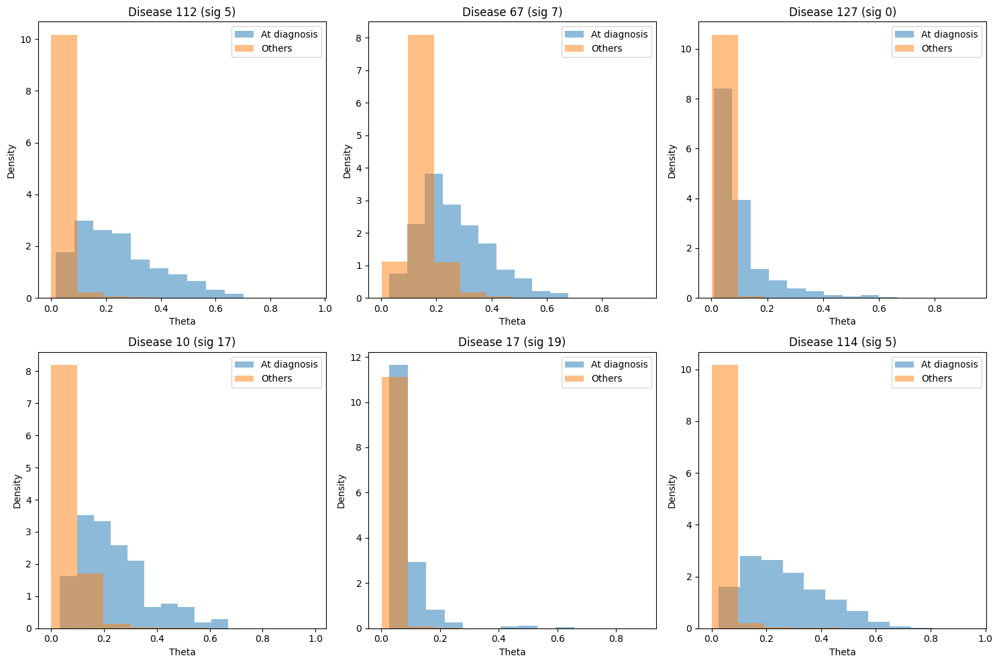

In [51]:

plot_theta_differences(test_model, diseases=[112,67,127,10,17,114], signatures=[5,7,0,17,19,5])


In [8]:
import rpy2.robjects as robjects
from rpy2.robjects import pandas2ri
pandas2ri.activate()

# Load the RDS file
readRDS = robjects.r['readRDS']
pce_data = readRDS('/Users/sarahurbut/Dropbox/pce_df_prevent.rds')
pce_df = pandas2ri.rpy2py(pce_data)  # Convert to pandas DataFrame


KeyError: 'phi_grad'

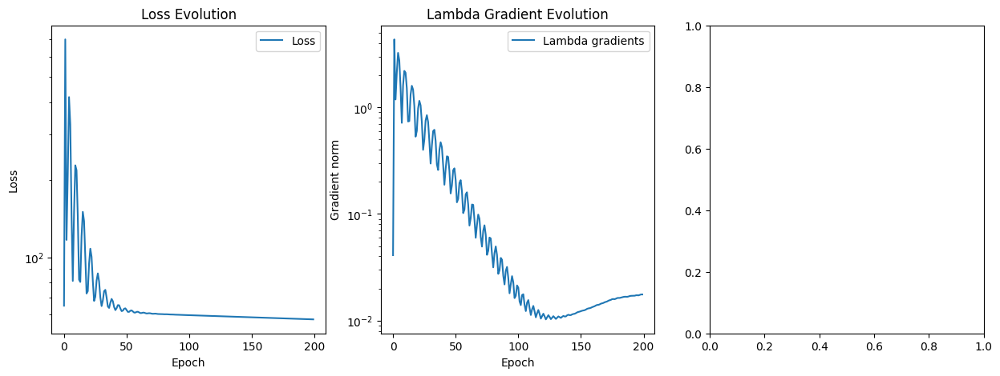

In [68]:
 plot_training_evolution(history_test)

## FIT WITH FIXED PHI, and ALL TIMES


ROC AUC Comparison (10-year prediction from enrollment):
Our model: 0.786
PCE: 0.678


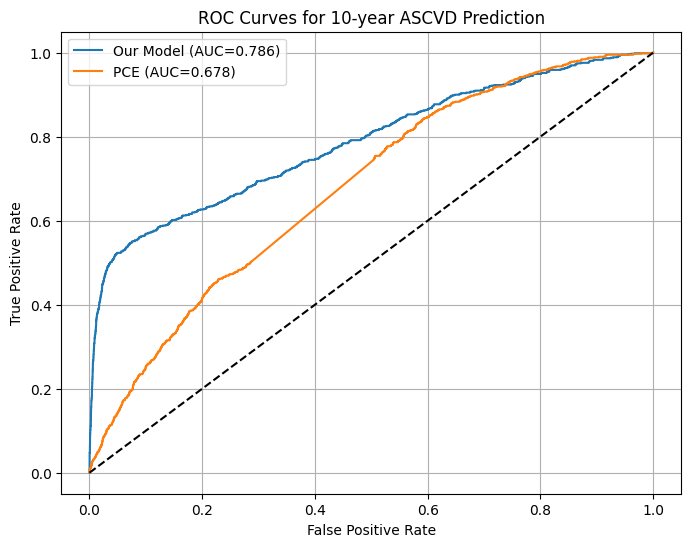

In [63]:
from utils import * 
compare_with_pce(test_model, pce_df, ascvd_indices=[111,112,113,114,115,116])

In [125]:
import gc
gc.collect()

4452

In [11]:
# Create enrollment-time-aware E matrix
E_enrollment = E_100k.clone()  # Start with the original censoring times

# For each patient, cap event/censoring times at their enrollment time
for patient_idx, row in enumerate(pce_df.itertuples()):
    if patient_idx >= E_enrollment.shape[0]:  # Make sure we don't go out of bounds
        break
        
    # Calculate enrollment time (age at enrollment - 30)
    enroll_time = int(row.age - 30)
    
    if enroll_time >= 0:  # Make sure enrollment time is valid
        # Cap all disease times to be at most the enrollment time
        # This is the key step: min(original_event_time, enrollment_time)
        E_enrollment[patient_idx, :] = torch.minimum(
            E_enrollment[patient_idx, :], 
            torch.full_like(E_enrollment[patient_idx, :], enroll_time)
        )

In [49]:

pretrained_phi = full_model.phi.detach().numpy()
pretrained_psi = full_model.psi.detach().numpy()

from clust_huge_amp_fixedPhi import *
N=Y_100k.shape[0]
D=Y_100k.shape[1]
T=Y_100k.shape[2]
K=full_model.K
P=G_100k.shape[1]
G=G_100k
Y=Y_100k
init_sd_scaler=1e-1
genetic_scale=1
prevalence_t=essentials['prevalence_t']
R=0
healthy_reference=True
# Create enrollment-time model with fixed phi


In [50]:

W=0.0001
torch.manual_seed(7)
np.random.seed(4)
# Create model without healthy reference
enrollment_model = AladynSurvivalFixedPhi(
    N=Y_100k.shape[0], 
    D=Y_100k.shape[1], 
    T=Y_100k.shape[2], 
    K=20,
    P=G_100k.shape[1],
    init_sd_scaler=1e-1,
    G=G_100k, 
    Y=Y_100k,
    genetic_scale=1,
    W=0.0001,
    R=0,
    prevalence_t=essentials['prevalence_t'],
    signature_references=signature_refs,  # Only pass signature refs
    healthy_reference=True,  # Explicitly set to None
    disease_names=essentials['disease_names'],
    pretrained_psi=pretrained_psi,
    pretrained_phi=pretrained_phi
)


Pre-calculated phi GP loss: 508.8588

Calculating gamma for k=0:
Number of diseases in signature: 14.0
Base value (first 5): tensor([0.0000, 0.0000, 0.0014, 0.0027, 0.0027])
Base value centered (first 5): tensor([-0.0007, -0.0007,  0.0006,  0.0020,  0.0020])
Base value centered mean: -2.719461981992577e-11
Gamma init for k=0 (first 5): tensor([ 1.7551e-06,  1.3453e-05,  2.2988e-05,  2.9739e-05, -2.0640e-05])

Calculating gamma for k=1:
Number of diseases in signature: 7.0
Base value (first 5): tensor([0., 0., 0., 0., 0.])
Base value centered (first 5): tensor([-0.0014, -0.0014, -0.0014, -0.0014, -0.0014])
Base value centered mean: -8.493662023711934e-11
Gamma init for k=1 (first 5): tensor([ 4.5783e-05,  1.7232e-05,  8.8181e-06, -1.0006e-06, -8.4958e-06])

Calculating gamma for k=2:
Number of diseases in signature: 21.0
Base value (first 5): tensor([0.0000, 0.0000, 0.0000, 0.0055, 0.0009])
Base value centered (first 5): tensor([-0.0005, -0.0005, -0.0005,  0.0050,  0.0005])
Base value c

/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp_fixedPhi.py:75: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.signature_refs = torch.tensor(signature_references, dtype=torch.float32)
/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp_fixedPhi.py:84: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.G = torch.tensor(G, dtype=torch.float32)
/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp_fixedPhi.py:87: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.G = torch.tensor(G_scaled, dtype=torch.float32)
/Users/sarahu


Calculating gamma for k=3:
Number of diseases in signature: 15.0
Base value (first 5): tensor([0., 0., 0., 0., 0.])
Base value centered (first 5): tensor([-0.0002, -0.0002, -0.0002, -0.0002, -0.0002])
Base value centered mean: 8.568167876588095e-12
Gamma init for k=3 (first 5): tensor([ 4.1873e-06, -8.1429e-06,  4.6889e-06,  4.2700e-06, -1.1228e-05])

Calculating gamma for k=4:
Number of diseases in signature: 17.0
Base value (first 5): tensor([0.0011, 0.0000, 0.0011, 0.0011, 0.0045])
Base value centered (first 5): tensor([-8.5860e-05, -1.2171e-03, -8.5860e-05, -8.5860e-05,  3.3078e-03])
Base value centered mean: -5.699694188843196e-11
Gamma init for k=4 (first 5): tensor([-1.2372e-05, -1.6182e-06, -2.6576e-05,  7.0880e-05, -1.9195e-05])

Calculating gamma for k=5:
Number of diseases in signature: 16.0
Base value (first 5): tensor([0.0000, 0.0000, 0.0000, 0.0024, 0.0000])
Base value centered (first 5): tensor([-0.0003, -0.0003, -0.0003,  0.0021, -0.0003])
Base value centered mean: -1.

## FIT WITH FIXED PHI (ESTIMATED ON ALL TIMES) and LIMITED ENROLLMENT TIME

In [ ]:

import cProfile
import pstats
from pstats import SortKey

# For the healthtoo version
profiler = cProfile.Profile()
profiler.enable()
history_new = enrollment_model.fit(E_enrollment, num_epochs=200, learning_rate=1e-1, lambda_reg=1e-2)
profiler.disable()
stats = pstats.Stats(profiler).sort_stats(SortKey.CUMULATIVE)
stats.print_stats(20)



In [ ]:
# Save model
W=0.0001
torch.save({
    'model_state_dict': enrollment_model.state_dict(),
    'phi': enrollment_model.phi,
    'Y': enrollment_model.Y,
    'prevalence_t': enrollment_model.prevalence_t,
    'logit_prevalence_t': enrollment_model.logit_prev_t,
    'G': enrollment_model.G
}, f'/Users/sarahurbut/Dropbox/enrollment_model_W{W}.pt')

/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_49122/4123554552.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  enrollment_model.load_state_dict(torch.load(m


ROC AUC Comparison (10-year prediction from enrollment):
Our model: 0.683
PCE: 0.678


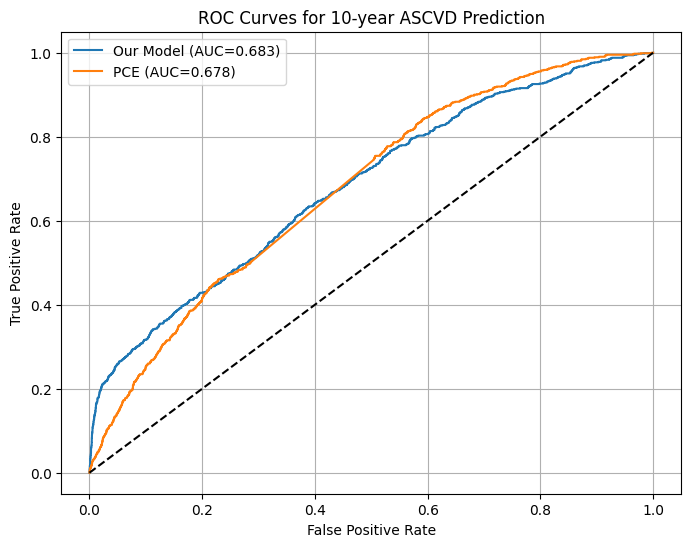

In [45]:
W=0.0001
model_save_path=f'/Users/sarahurbut/Dropbox/enrollment_model_W{W}.pt'

enrollment_model.load_state_dict(torch.load(model_save_path)['model_state_dict'])
compare_with_pce(enrollment_model, pce_df, ascvd_indices=[111,112,113,114,115,116])


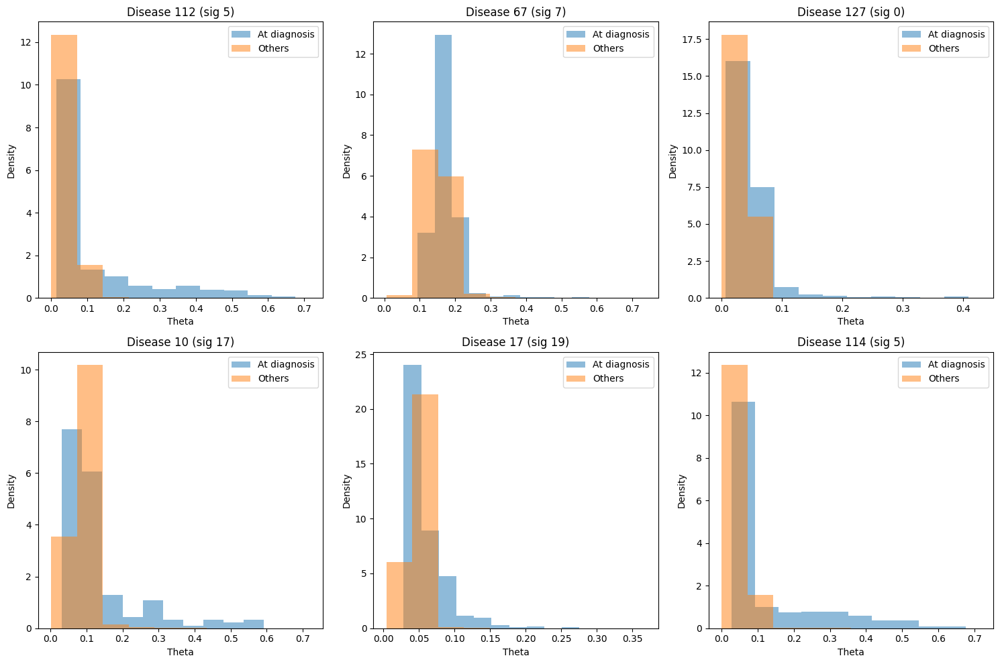

In [79]:

plot_theta_differences(enrollment_model, diseases=[112,67,127,10,17,114], signatures=[5,7,0,17,19,5])

In [119]:
   ages = torch.tensor([row.age - 30 for row in pce_df.itertuples()])
   preserved = sum([(E_100k[i] < ages[i]).sum().item() for i in range(len(ages))])
   print(f"Events before enrollment (simple check): {preserved}")

Events before enrollment (simple check): 17061


In [24]:
# Get enrollment ages
ages = torch.tensor([row.age - 30 for row in pce_df.itertuples()])

# Check events before enrollment
before_enrollment = sum([(E_100k[i] < ages[i]).sum().item() for i in range(len(ages))])
print(f"Events before enrollment in original data: {before_enrollment}")

# Check if these are preserved in E_enrollment (should be equal to original)
preserved = sum([((E_100k[i] < ages[i]) & (E_100k[i] == E_enrollment[i])).sum().item() 
                 for i in range(len(ages))])
print(f"Events before enrollment preserved correctly: {preserved}")

# Check if any are changed (should be 0)
changed = sum([((E_100k[i] < ages[i]) & (E_100k[i] != E_enrollment[i])).sum().item() 
               for i in range(len(ages))])
print(f"Events before enrollment incorrectly changed: {changed}")

Events before enrollment in original data: 17061
Events before enrollment preserved correctly: 17061
Events before enrollment incorrectly changed: 0


Pre-calculated phi GP loss: 75.8527

Calculating gamma for k=0:
Number of diseases in signature: 8.0
Base value (first 5): tensor([0.0000, 0.0000, 0.0000, 0.0048, 0.0000])
Base value centered (first 5): tensor([-0.0003, -0.0003, -0.0003,  0.0045, -0.0003])
Base value centered mean: 1.3969838740662821e-12
Gamma init for k=0 (first 5): tensor([ 1.1404e-05,  1.8626e-05, -1.0852e-05,  2.2596e-05,  3.4834e-05])

Calculating gamma for k=1:
Number of diseases in signature: 8.0
Base value (first 5): tensor([0.0024, 0.0000, 0.0000, 0.0000, 0.0000])
Base value centered (first 5): tensor([ 0.0022, -0.0002, -0.0002, -0.0002, -0.0002])
Base value centered mean: -3.278255444882916e-11
Gamma init for k=1 (first 5): tensor([5.6716e-06, 3.3745e-06, 9.7130e-06, 1.2748e-05, 2.5846e-06])

Calculating gamma for k=2:
Number of diseases in signature: 6.0
Base value (first 5): tensor([0., 0., 0., 0., 0.])
Base value centered (first 5): tensor([-0.0004, -0.0004, -0.0004, -0.0004, -0.0004])
Base value centered 

/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp_fixedPhi.py:75: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.signature_refs = torch.tensor(signature_references, dtype=torch.float32)
/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp_fixedPhi.py:84: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.G = torch.tensor(G, dtype=torch.float32)
/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp_fixedPhi.py:87: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.G = torch.tensor(G_scaled, dtype=torch.float32)
/Users/sarahu


Calculating gamma for k=3:
Number of diseases in signature: 43.0
Base value (first 5): tensor([0.0000, 0.0000, 0.0000, 0.0004, 0.0004])
Base value centered (first 5): tensor([-0.0001, -0.0001, -0.0001,  0.0003,  0.0003])
Base value centered mean: 1.1734664455420596e-11
Gamma init for k=3 (first 5): tensor([-1.9545e-07,  1.6992e-06, -1.1822e-07,  2.8693e-06, -6.3952e-07])

Calculating gamma for k=4:
Number of diseases in signature: 5.0
Base value (first 5): tensor([0.0000, 0.0077, 0.0000, 0.0000, 0.0000])
Base value centered (first 5): tensor([-0.0002,  0.0075, -0.0002, -0.0002, -0.0002])
Base value centered mean: -1.2293457918310935e-11
Gamma init for k=4 (first 5): tensor([-3.2556e-05, -4.9530e-06,  2.7633e-05,  4.1587e-05, -6.2512e-06])

Calculating gamma for k=5:
Number of diseases in signature: 2.0
Base value (first 5): tensor([0., 0., 0., 0., 0.])
Base value centered (first 5): tensor([-0.0010, -0.0010, -0.0010, -0.0010, -0.0010])
Base value centered mean: 2.7567148216944837e-11


/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp_fixedPhi.py:179: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  event_times_tensor = torch.tensor(event_times, dtype=torch.long)


Kappa gradient: -1.123e+00

Epoch 0
Loss: 17.2178

Monitoring signature responses:

Disease 47 (signature 15, LR=85.85):
  Theta for diagnosed: 0.014 ± 0.005
  Theta for others: 0.014
  Proportion difference: 0.000

Disease 21 (signature 13, LR=74.77):
  Theta for diagnosed: 0.023 ± 0.007
  Theta for others: 0.023
  Proportion difference: 0.000

Disease 249 (signature 13, LR=64.79):
  Theta for diagnosed: 0.023 ± 0.007
  Theta for others: 0.023
  Proportion difference: -0.000

Disease 336 (signature 9, LR=64.31):
  Theta for diagnosed: 0.030 ± 0.005
  Theta for others: 0.030
  Proportion difference: 0.000

Disease 127 (signature 0, LR=61.81):
  Theta for diagnosed: 0.028 ± 0.020
  Theta for others: 0.028
  Proportion difference: -0.000
Kappa gradient: -9.468e-01

Epoch 1
Loss: 3248.6931

Monitoring signature responses:

Disease 47 (signature 15, LR=85.85):
  Theta for diagnosed: 0.014 ± 0.004
  Theta for others: 0.014
  Proportion difference: 0.000

Disease 21 (signature 13, LR=74.77):

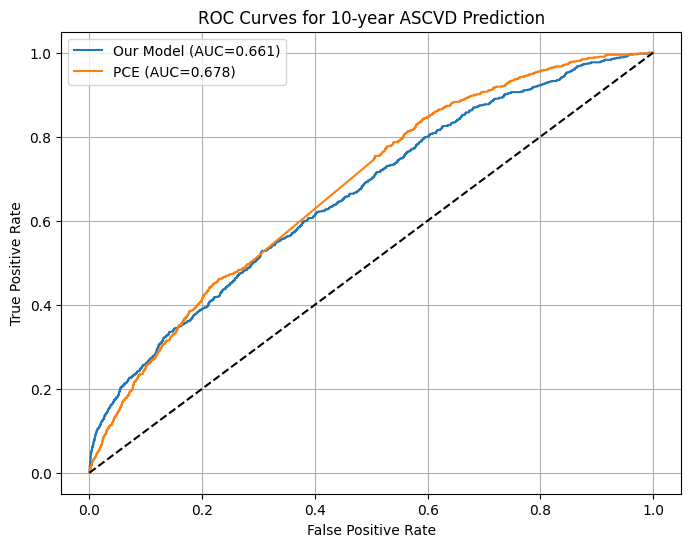

In [123]:
del enrollment_model
W = 0.0005

enrollment_model_1 = AladynSurvivalFixedPhi(
    N=Y_100k.shape[0], 
    D=Y_100k.shape[1], 
    T=Y_100k.shape[2], 
    K=20,
    P=G_100k.shape[1],
    init_sd_scaler=1e-1,
    G=G_100k, 
    Y=Y_100k,
    genetic_scale=1,
    W=W,
    R=0,
    prevalence_t=essentials['prevalence_t'],
    signature_references=signature_refs,
    healthy_reference=True,
    disease_names=essentials['disease_names'],
    pretrained_psi=pretrained_psi,
    pretrained_phi=pretrained_phi
)

# Train with W = 0.0001
profiler = cProfile.Profile()
profiler.enable()
history_1 = enrollment_model_1.fit(E_enrollment, num_epochs=200, learning_rate=1e-1)
profiler.disable()
stats = pstats.Stats(profiler).sort_stats(SortKey.CUMULATIVE)
stats.print_stats(20)

# Evaluate performance
print("\nResults for GP weight =", W)
compare_with_pce(enrollment_model_1, pce_df, ascvd_indices=[111,112,113,114,115,116])

# Save model
torch.save({
    'model_state_dict': enrollment_model_1.state_dict(),
    'phi': enrollment_model_1.phi,
    'Y': enrollment_model_1.Y,
    'prevalence_t': enrollment_model_1.prevalence_t,
    'logit_prevalence_t': enrollment_model_1.logit_prev_t,
    'G': enrollment_model_1.G
}, f'/Users/sarahurbut/Dropbox/enrollment_model_W{W}.pt')

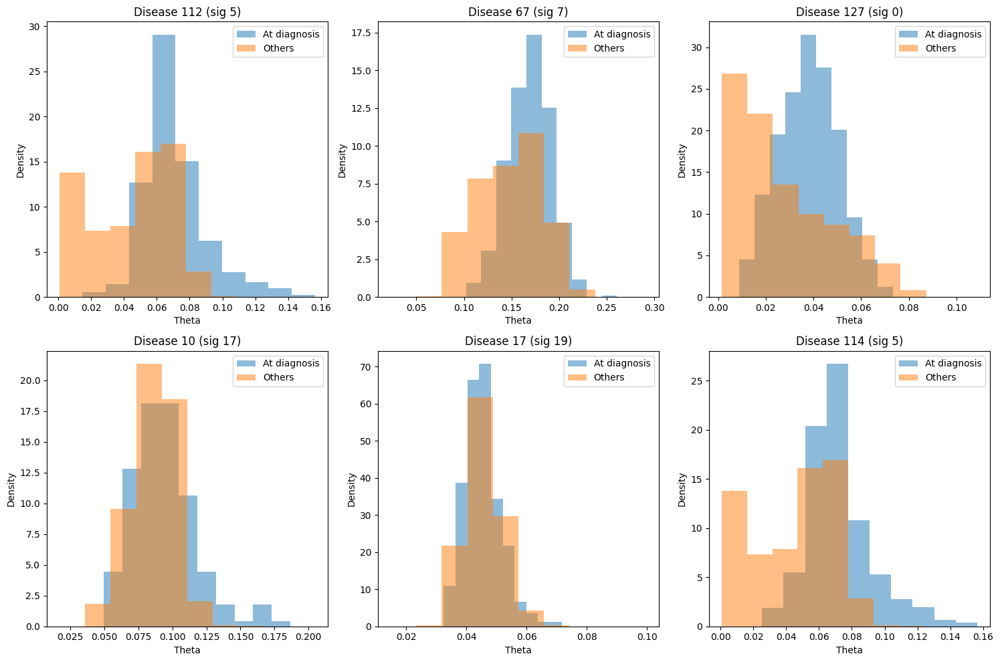

In [127]:

plot_theta_differences(enrollment_model_1, diseases=[112,67,127,10,17,114], signatures=[5,7,0,17,19,5])

KeyError: 'phi_grad'

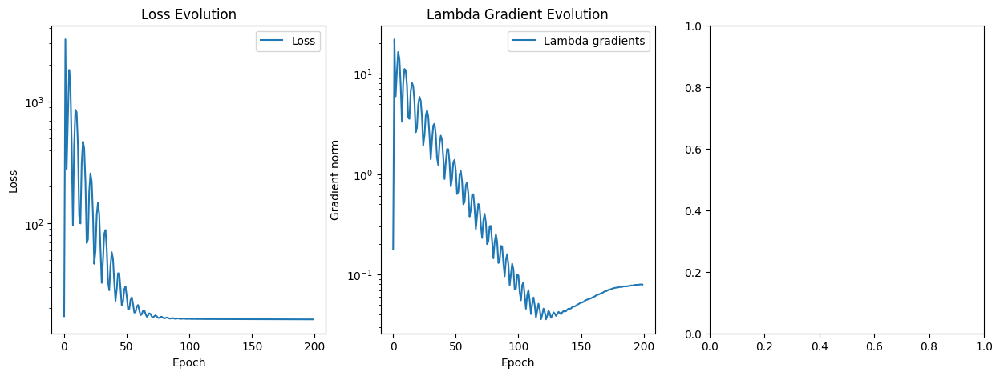

In [128]:
 plot_training_evolution(history_1)

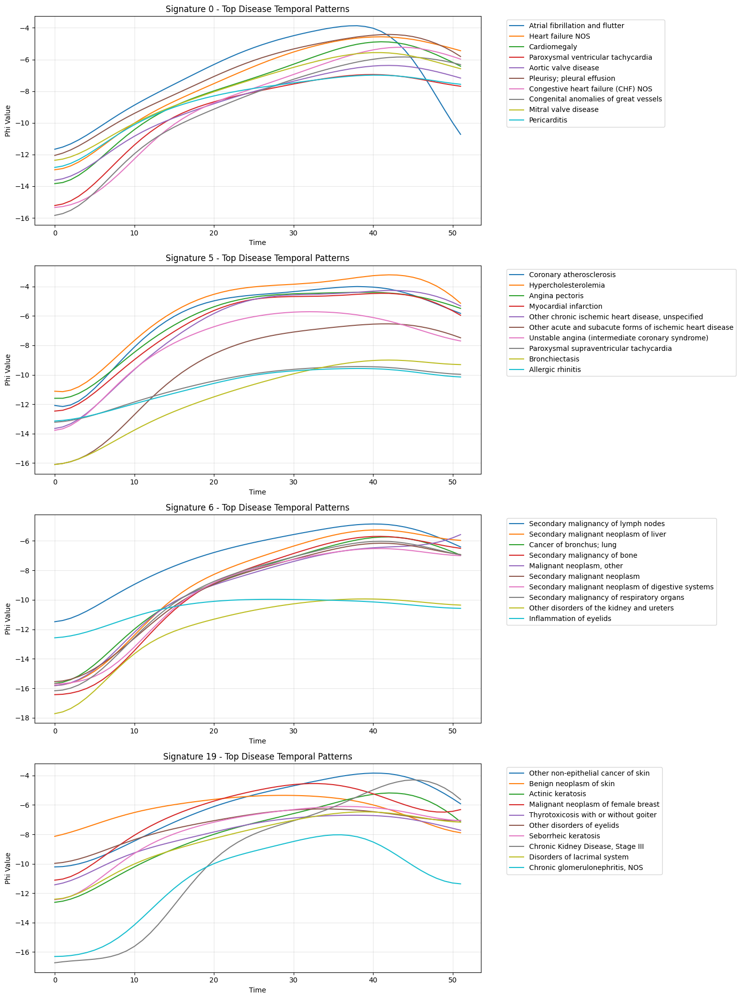

In [131]:
from utils import plot_signature_temporal_patterns
plot_signature_temporal_patterns(enrollment_model_1, essentials['disease_names'],n_top=10, selected_signatures=[0,5,6,19])

In [34]:
del enrollment_model_1


In [41]:
from clust_huge_amp_fixedPhi import *
W = 0.00001

enrollment_model_1 = AladynSurvivalFixedPhi(
    N=Y_100k.shape[0], 
    D=Y_100k.shape[1], 
    T=Y_100k.shape[2], 
    K=20,
    P=G_100k.shape[1],
    init_sd_scaler=1e-1,
    G=G_100k, 
    Y=Y_100k,
    genetic_scale=1,
    W=W,
    R=0,
    prevalence_t=essentials['prevalence_t'],
    signature_references=signature_refs,
    healthy_reference=True,
    disease_names=essentials['disease_names'],
    pretrained_psi=pretrained_psi,
    pretrained_phi=pretrained_phi
)


Pre-calculated phi GP loss: 75.8527

Calculating gamma for k=0:
Number of diseases in signature: 8.0
Base value (first 5): tensor([0.0000, 0.0000, 0.0000, 0.0048, 0.0000])
Base value centered (first 5): tensor([-0.0003, -0.0003, -0.0003,  0.0045, -0.0003])
Base value centered mean: 1.3969838740662821e-12
Gamma init for k=0 (first 5): tensor([ 1.1404e-05,  1.8626e-05, -1.0852e-05,  2.2596e-05,  3.4834e-05])

Calculating gamma for k=1:
Number of diseases in signature: 8.0
Base value (first 5): tensor([0.0024, 0.0000, 0.0000, 0.0000, 0.0000])
Base value centered (first 5): tensor([ 0.0022, -0.0002, -0.0002, -0.0002, -0.0002])
Base value centered mean: -3.278255444882916e-11
Gamma init for k=1 (first 5): tensor([5.6716e-06, 3.3745e-06, 9.7130e-06, 1.2748e-05, 2.5846e-06])

Calculating gamma for k=2:
Number of diseases in signature: 6.0
Base value (first 5): tensor([0., 0., 0., 0., 0.])
Base value centered (first 5): tensor([-0.0004, -0.0004, -0.0004, -0.0004, -0.0004])
Base value centered 

/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp_fixedPhi.py:75: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.signature_refs = torch.tensor(signature_references, dtype=torch.float32)
/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp_fixedPhi.py:84: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.G = torch.tensor(G, dtype=torch.float32)
/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp_fixedPhi.py:87: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.G = torch.tensor(G_scaled, dtype=torch.float32)
/Users/sarahu


Calculating gamma for k=3:
Number of diseases in signature: 43.0
Base value (first 5): tensor([0.0000, 0.0000, 0.0000, 0.0004, 0.0004])
Base value centered (first 5): tensor([-0.0001, -0.0001, -0.0001,  0.0003,  0.0003])
Base value centered mean: 1.1734664455420596e-11
Gamma init for k=3 (first 5): tensor([-1.9545e-07,  1.6992e-06, -1.1822e-07,  2.8693e-06, -6.3952e-07])

Calculating gamma for k=4:
Number of diseases in signature: 5.0
Base value (first 5): tensor([0.0000, 0.0077, 0.0000, 0.0000, 0.0000])
Base value centered (first 5): tensor([-0.0002,  0.0075, -0.0002, -0.0002, -0.0002])
Base value centered mean: -1.2293457918310935e-11
Gamma init for k=4 (first 5): tensor([-3.2556e-05, -4.9530e-06,  2.7633e-05,  4.1587e-05, -6.2512e-06])

Calculating gamma for k=5:
Number of diseases in signature: 2.0
Base value (first 5): tensor([0., 0., 0., 0., 0.])
Base value centered (first 5): tensor([-0.0010, -0.0010, -0.0010, -0.0010, -0.0010])
Base value centered mean: 2.7567148216944837e-11


In [36]:
import cProfile
import pstats
from pstats import SortKey


In [37]:

profiler = cProfile.Profile()
profiler.enable()
history_1 = enrollment_model_1.fit(E_enrollment, num_epochs=200, learning_rate=1e-1)
profiler.disable()
stats = pstats.Stats(profiler).sort_stats(SortKey.CUMULATIVE)
stats.print_stats(20)


/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp_fixedPhi.py:179: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  event_times_tensor = torch.tensor(event_times, dtype=torch.long)


Kappa gradient: -1.123e+00

Epoch 0
Loss: 16.9378

Monitoring signature responses:

Disease 47 (signature 15, LR=85.85):
  Theta for diagnosed: 0.014 ± 0.005
  Theta for others: 0.014
  Proportion difference: 0.000

Disease 21 (signature 13, LR=74.77):
  Theta for diagnosed: 0.023 ± 0.007
  Theta for others: 0.023
  Proportion difference: -0.000

Disease 249 (signature 13, LR=64.79):
  Theta for diagnosed: 0.023 ± 0.007
  Theta for others: 0.023
  Proportion difference: 0.000

Disease 336 (signature 9, LR=64.31):
  Theta for diagnosed: 0.030 ± 0.005
  Theta for others: 0.030
  Proportion difference: -0.000

Disease 127 (signature 0, LR=61.81):
  Theta for diagnosed: 0.028 ± 0.020
  Theta for others: 0.028
  Proportion difference: 0.000
Kappa gradient: -9.474e-01

Epoch 1
Loss: 77.4650

Monitoring signature responses:

Disease 47 (signature 15, LR=85.85):
  Theta for diagnosed: 0.014 ± 0.004
  Theta for others: 0.014
  Proportion difference: 0.000

Disease 21 (signature 13, LR=74.77):
 


Results for GP weight = 1e-05

ROC AUC Comparison (10-year prediction from enrollment):
Our model: 0.680
PCE: 0.678


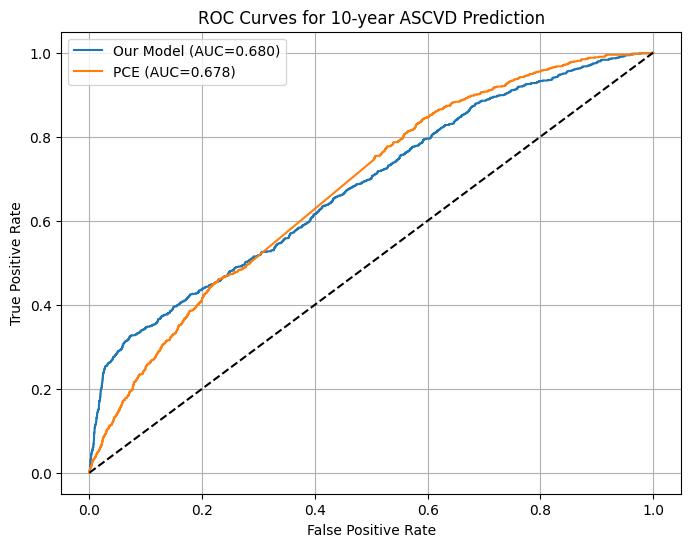

In [40]:

# Evaluate performance
print("\nResults for GP weight =", W)
compare_with_pce(enrollment_model_1, pce_df, ascvd_indices=[111,112,113,114,115,116])


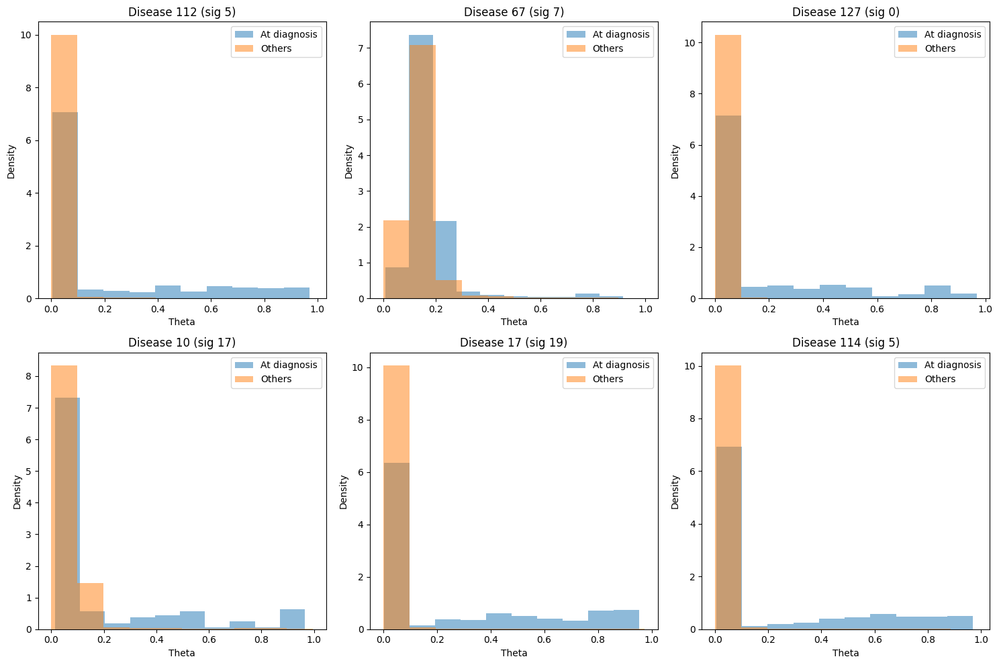

In [38]:

plot_theta_differences(enrollment_model_1, diseases=[112,67,127,10,17,114], signatures=[5,7,0,17,19,5])

KeyError: 'phi_grad'

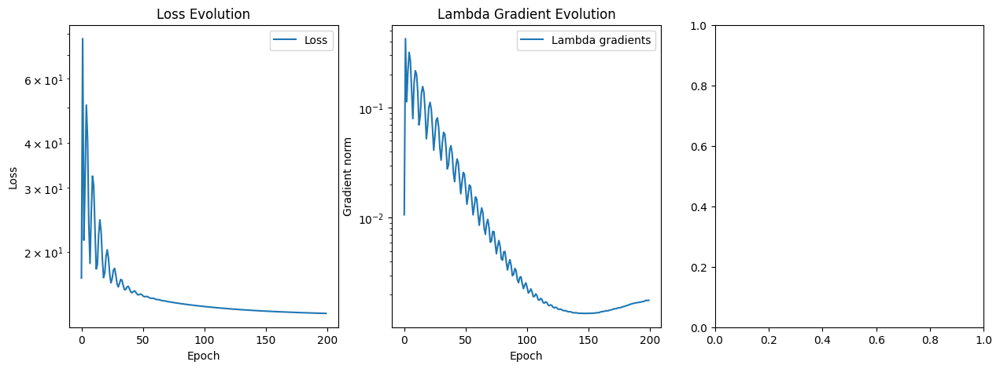

In [39]:
 plot_training_evolution(history_1)

In [ ]:

# Save model
torch.save({
    'model_state_dict': enrollment_model_1.state_dict(),
    'phi': enrollment_model_1.phi,
    'Y': enrollment_model_1.Y,
    'prevalence_t': enrollment_model_1.prevalence_t,
    'logit_prevalence_t': enrollment_model_1.logit_prev_t,
    'G': enrollment_model_1.G
}, f'/Users/sarahurbut/Dropbox/enrollment_model_W{W}.pt')

In [ ]:
del enrollment_model_1
del enrollment_model


In [24]:

torch.manual_seed(7)
np.random.seed(4)
# Create model without healthy reference, now estimate phi and lambda togetehr on this new data

model = AladynSurvivalFixedKernelsAvgLoss_clust_logitInit_psitest(
    N=Y_100k.shape[0], 
    D=Y_100k.shape[1], 
    T=Y_100k.shape[2], 
    K=20,
    P=G_100k.shape[1],
    init_sd_scaler=1e-1,
    G=G_100k, 
    Y=Y_100k,
    genetic_scale=1,
    W=0.0001,
    R=0,
    prevalence_t=essentials['prevalence_t'],
    signature_references=signature_refs,  # Only pass signature refs
    healthy_reference=True,  # Explicitly set to None
    disease_names=essentials['disease_names']
)

torch.manual_seed(0)
np.random.seed(0)
# Initialize with psi and clusters


import cProfile
import pstats
from pstats import SortKey

# Now in your batch run, load and verify:
initial_psi = torch.load('/Users/sarahurbut/Dropbox/data_for_running/initial_psi_400k.pt')
initial_clusters = torch.load('/Users/sarahurbut/Dropbox/data_for_running/initial_clusters_400k.pt')

model.initialize_params(true_psi=initial_psi)
model.clusters = initial_clusters
# Verify clusters match
clusters_match = np.array_equal(initial_clusters, model.clusters)
print(f"\nClusters match exactly: {clusters_match}")

profiler = cProfile.Profile()
profiler.enable()
history_new = model.fit(E_enrollment, num_epochs=200, learning_rate=1e-1, lambda_reg=1e-2)
profiler.disable()
stats = pstats.Stats(profiler).sort_stats(SortKey.CUMULATIVE)
stats.print_stats(20)

/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp.py:73: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.signature_refs = torch.tensor(signature_references, dtype=torch.float32)
/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp.py:80: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.G = torch.tensor(G, dtype=torch.float32)
/Users/sarahurbut/aladynoulli2/pyScripts/clust_huge_amp.py:83: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  self.G = torch.tensor(G_scaled, dtype=torch.float32)
/Users/sarahurbut/aladynoulli2/pyScripts


Cluster Sizes:
Cluster 0: 14 diseases
Cluster 1: 7 diseases
Cluster 2: 21 diseases
Cluster 3: 15 diseases
Cluster 4: 17 diseases
Cluster 5: 16 diseases
Cluster 6: 57 diseases
Cluster 7: 18 diseases
Cluster 8: 13 diseases
Cluster 9: 11 diseases
Cluster 10: 18 diseases
Cluster 11: 12 diseases
Cluster 12: 26 diseases
Cluster 13: 7 diseases
Cluster 14: 9 diseases
Cluster 15: 8 diseases
Cluster 16: 7 diseases
Cluster 17: 11 diseases
Cluster 18: 6 diseases
Cluster 19: 55 diseases

Calculating gamma for k=0:
Number of diseases in cluster: 14
Base value (first 5): tensor([-18.4207, -18.4207, -17.3858, -16.3508, -16.3508])
Base value centered (first 5): tensor([-0.5458, -0.5458,  0.4891,  1.5240,  1.5240])
Base value centered mean: 3.23352810482902e-06
Gamma init for k=0 (first 5): tensor([ 0.0013,  0.0101,  0.0173,  0.0224, -0.0156])

Calculating gamma for k=1:
Number of diseases in cluster: 7
Base value (first 5): tensor([-18.4207, -18.4207, -18.4207, -18.4207, -18.4207])
Base value centered

/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_94256/3022948289.py:33: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  initial_psi = torch.load('/Users/sarahurbut/


Calculating gamma for k=3:
Number of diseases in cluster: 82.0
Base value (first 5): tensor([-18.4207, -18.4207, -18.4207, -18.2440, -18.0673])
Base value centered (first 5): tensor([-0.1504, -0.1504, -0.1504,  0.0263,  0.2029])
Base value centered mean: 1.4457702945946949e-06
Gamma init for k=3 (first 5): tensor([ 0.0018,  0.0001,  0.0028,  0.0029, -0.0009])

Calculating gamma for k=4:
Number of diseases in cluster: 5.0
Base value (first 5): tensor([-18.4207, -12.6251, -18.4207, -18.4207, -18.4207])
Base value centered (first 5): tensor([-0.1660,  5.6295, -0.1660, -0.1660, -0.1660])
Base value centered mean: 1.8896103028964717e-06
Gamma init for k=4 (first 5): tensor([-0.0245, -0.0037,  0.0208,  0.0313, -0.0047])

Calculating gamma for k=5:
Number of diseases in cluster: 7.0
Base value (first 5): tensor([-18.4207, -18.4207, -18.4207, -18.4207, -18.4207])
Base value centered (first 5): tensor([-1.0324, -1.0324, -1.0324, -1.0324, -1.0324])
Base value centered mean: 2.2811889266449725e-

NameError: name 'E_enrollment' is not defined

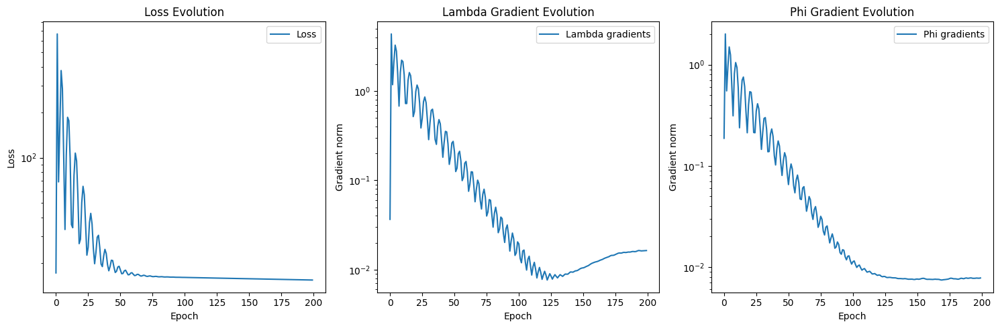

In [17]:
from utils import *
plot_training_evolution(history_new)

In [19]:

# Save model
torch.save({
    'model_state_dict': model.state_dict(),
    'phi': model.phi,
    'Y': model.Y,
    'prevalence_t': model.prevalence_t,
    'logit_prevalence_t': model.logit_prev_t,
    'G': model.G,
}, f'/Users/sarahurbut/Dropbox/enrollment_model_W{W}_jointphi.pt')

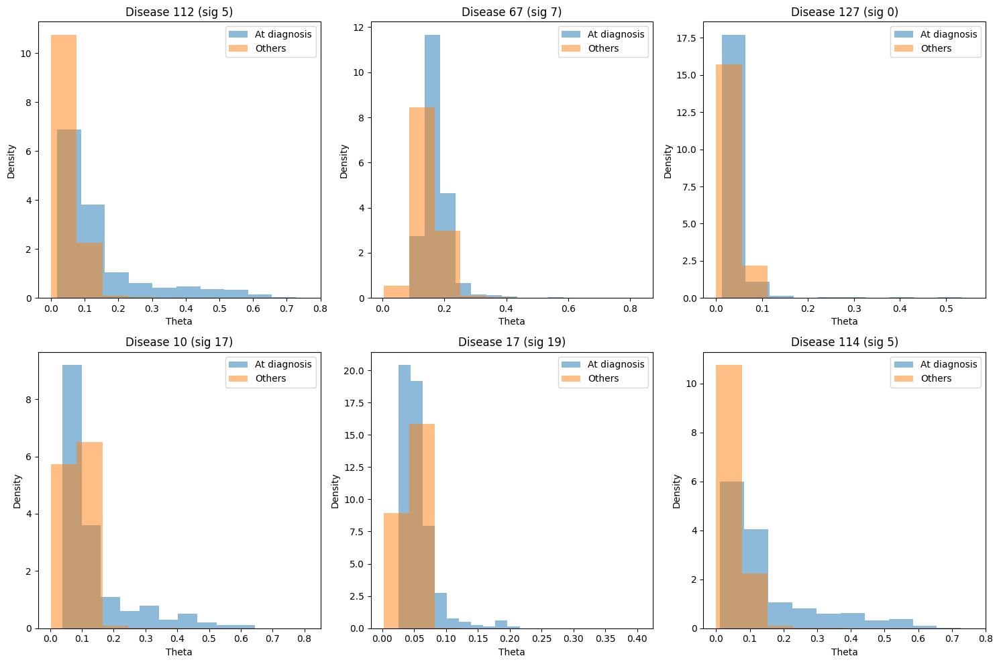

In [21]:

plot_theta_differences(model, diseases=[112,67,127,10,17,114], signatures=[5,7,0,17,19,5])


Results for GP weight = 0.0001

ROC AUC Comparison (10-year prediction from enrollment):
Our model: 0.695
PCE: 0.678


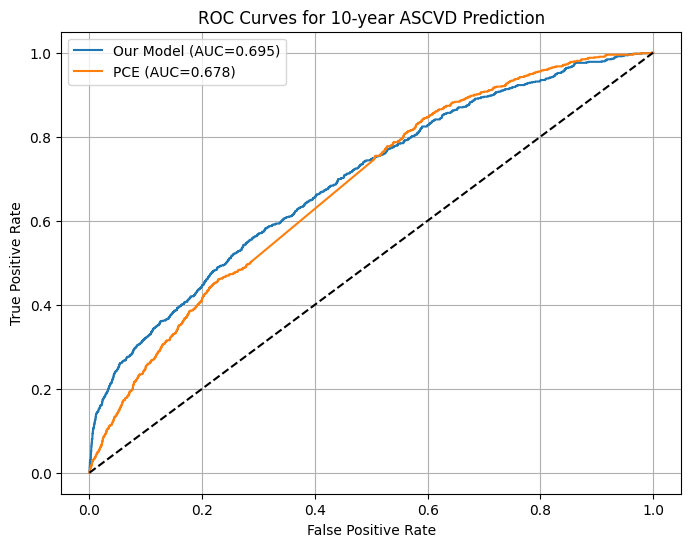

In [93]:
# Evaluate performance
W=0.0001
from utils import *
print("\nResults for GP weight =", W)
compare_with_pce(model, pce_df, ascvd_indices=[111,112,113,114,115,116])


ROC AUC for 1-year prediction from enrollment:
Our model: 0.853


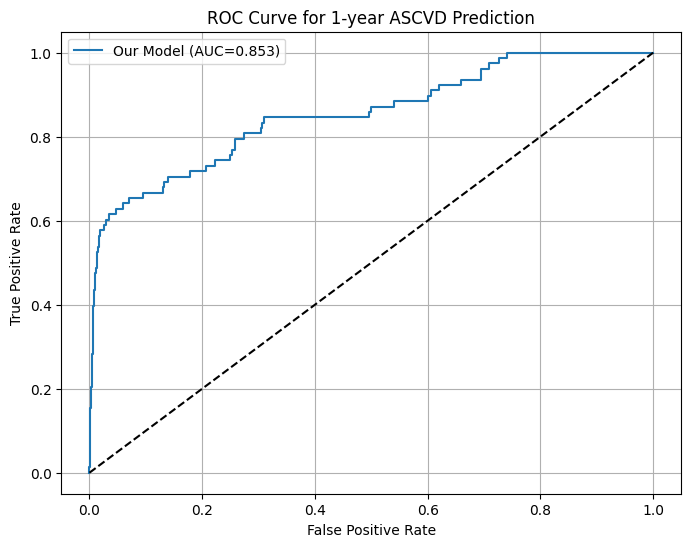

(np.float64(0.8531920776931863),
 array([0.01656657, 0.00050414, 0.01553965, ..., 0.01108325, 0.00955218,
        0.00135118], dtype=float32),
 array([False, False, False, ..., False, False, False]))

In [63]:
from utils import *
# USING LIMITING ENROLLMENT TIME DATA
compare_with_pce_one_year(model, pce_df, ascvd_indices=[111,112,113,114,115,116])


ROC AUC Comparison (10-year prediction from enrollment):
Our model: 0.639
PCE: 0.678


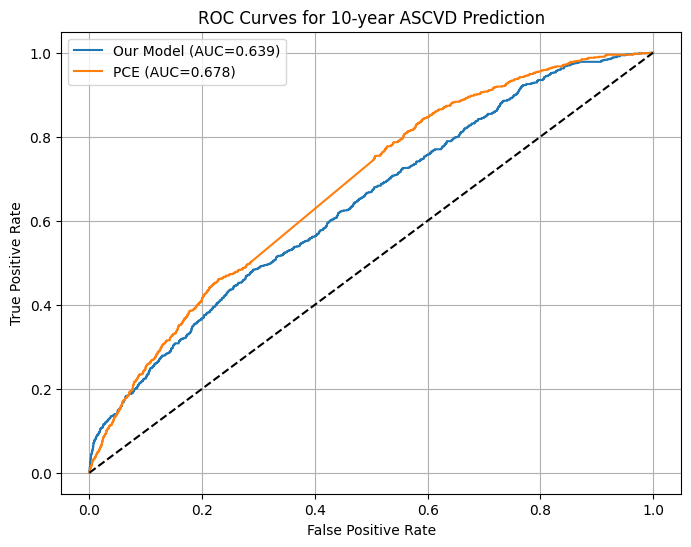

In [64]:
compare_with_pce_using_enrollment_time(model, pce_df, ascvd_indices=[111,112,113,114,115,116])

In [215]:
W=0.0001
model.load_state_dict(torch.load(f'/Users/sarahurbut/Dropbox/enrollment_model_W{W}_jointphi.pt')['model_state_dict'])

/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_94256/954218769.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(f'/Users/sara

<All keys matched successfully>


ROC AUC Comparison (10-year prediction from enrollment):
Our model: 0.695
PCE: 0.678


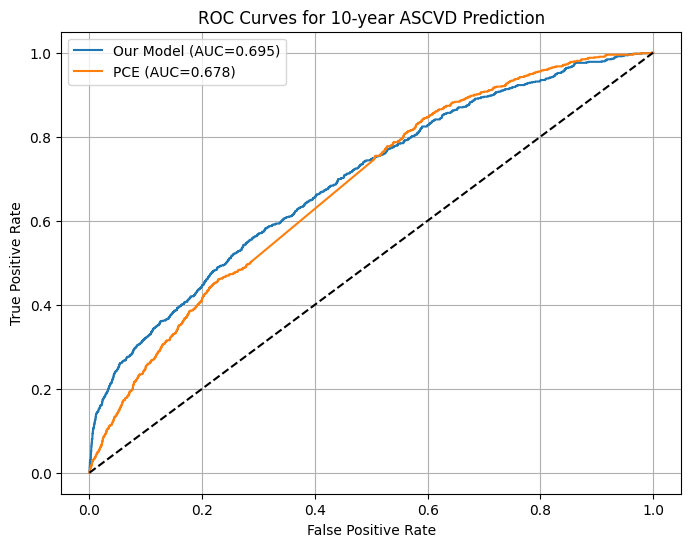

In [29]:

compare_with_pce(model, pce_df, ascvd_indices=[111,112,113,114,115,116])

In [216]:
from utils import *
results = evaluate_major_diseases(model, Y_100k, E_100k, disease_names, pce_df,Y,enrollment_df)

# Usage:


Evaluating ASCVD...
AUC: 0.695
Events: 831 (8.3%)

Evaluating Diabetes...
AUC: 0.627
Events: 581 (5.8%)

Evaluating Atrial_Fib...
AUC: 0.678
Events: 376 (3.8%)

Evaluating CKD...
AUC: 0.707
Events: 207 (2.1%)

Evaluating All_Cancers...
AUC: 0.637
Events: 763 (7.6%)

Evaluating Stroke...
AUC: 0.654
Events: 129 (1.3%)

Evaluating Heart_Failure...
AUC: 0.697
Events: 205 (2.0%)

Evaluating Pneumonia...
AUC: 0.682
Events: 335 (3.4%)

Evaluating COPD...
AUC: 0.645
Events: 394 (3.9%)

Evaluating Hip_Fracture...
No matching diseases found for Hip_Fracture

Evaluating Osteoporosis...
AUC: 0.666
Events: 219 (2.2%)

Evaluating Anemia...
AUC: 0.593
Events: 523 (5.2%)

Evaluating Alzheimer...
No matching diseases found for Alzheimer

Evaluating Esophageal_Cancer...
No matching diseases found for Esophageal_Cancer

Evaluating Colorectal_Cancer...
AUC: 0.659
Events: 105 (1.0%)

Evaluating Breast_Cancer...
AUC: 0.582
Events: 216 (2.2%)

Evaluating Prostate_Cancer...
AUC: 0.681
Events: 204 (2.0%)

Eva

In [221]:
print(results)

{'ASCVD': {'auc': np.float64(0.6950077951933207), 'n_events': 831, 'event_rate': 8.309999465942383}, 'Diabetes': {'auc': np.float64(0.6268843745905619), 'n_events': 581, 'event_rate': 5.809999942779541}, 'Atrial_Fib': {'auc': np.float64(0.6775832471127147), 'n_events': 376, 'event_rate': 3.759999990463257}, 'CKD': {'auc': np.float64(0.7074956428998136), 'n_events': 207, 'event_rate': 2.069999933242798}, 'All_Cancers': {'auc': np.float64(0.6367678935547688), 'n_events': 763, 'event_rate': 7.630000114440918}, 'Stroke': {'auc': np.float64(0.6540127332511884), 'n_events': 129, 'event_rate': 1.290000081062317}, 'Heart_Failure': {'auc': np.float64(0.6970027017268641), 'n_events': 205, 'event_rate': 2.049999952316284}, 'Pneumonia': {'auc': np.float64(0.6824645010848499), 'n_events': 335, 'event_rate': 3.3500001430511475}, 'COPD': {'auc': np.float64(0.6452625579824792), 'n_events': 394, 'event_rate': 3.940000057220459}, 'Osteoporosis': {'auc': np.float64(0.6659381551876506), 'n_events': 219, '

In [222]:
import numpy as np
from scipy import stats
import pandas as pd

def auc_se(auc, n_pos, n_neg):
    """
    Calculate SE for AUC using Hanley-McNeil method.
    Handles potential edge cases where auc is 0 or 1.
    """
    if auc == 0 or auc == 1:
        # SE is not well-defined at the boundaries
        return 0.0 
    q1 = auc / (2 - auc)
    q2 = 2 * auc * auc / (1 + auc)
    
    # Ensure n_pos and n_neg are positive to avoid division by zero or sqrt of negative
    if n_pos <= 0 or n_neg <= 0:
        return np.nan # Not computable if no events or no non-events
        
    variance = (auc * (1 - auc) + 
                (n_pos - 1) * (q1 - auc * auc) + 
                (n_neg - 1) * (q2 - auc * auc)) / (n_pos * n_neg)
    
    # Handle cases where variance might be negative due to floating point issues near 0/1
    if variance < 0:
        return 0.0 
        
    return np.sqrt(variance)

def calculate_and_format_results_with_ci(results_dict):
    """
    Takes the results dictionary and adds formatted AUC with 95% CI.
    
    Args:
        results_dict: Dictionary where keys are disease groups and values are 
                      dicts containing 'AUC', 'Events', 'Rate'.
                      
    Returns:
        pandas DataFrame with formatted results.
    """
    formatted_results = []
    
    for disease, stats_dict in results_dict.items():
        auc = stats_dict.get('auc')
        events = stats_dict.get('n_events')
        rate = stats_dict.get('rate')
        
        if auc is None or events is None or rate is None or rate == 0:
            formatted_auc_ci = f"{auc if auc is not None else 'N/A'}"
            total_n = 'N/A'
        else:
            # Estimate total N, handle potential division by zero if rate is 0
            total_n = int(round(events / rate)) if rate > 0 else 0
            n_pos = int(events)
            n_neg = int(total_n - n_pos)
            
            # Calculate SE and CI
            se = auc_se(auc, n_pos, n_neg)
            if np.isnan(se) or se == 0:
                 formatted_auc_ci = f"{auc:.3f} (-)" # Indicate if CI not computable
            else:
                ci_lower = max(0, auc - 1.96 * se) # CIs bounded by 0 and 1
                ci_upper = min(1, auc + 1.96 * se)
                formatted_auc_ci = f"{auc:.3f} ({ci_lower:.3f}-{ci_upper:.3f})"
            
        formatted_results.append({
            'Disease Group': disease,
            'AUC (95% CI)': formatted_auc_ci,
            'Events': events if events is not None else 'N/A',
            'Rate (%)': f"{rate*100:.1f}%" if rate is not None else 'N/A'
        })
        
    return pd.DataFrame(formatted_results)

# Assuming 'results' is the dictionary returned by evaluate_major_diseases
# If 'results' is already a DataFrame, you might need to adapt how you iterate
# For example, if results is a DataFrame:
# results_dict = results.set_index('Disease Group').to_dict('index')

# Example usage (replace with your actual results object):
# results_dict = evaluate_major_diseases(...) # Assuming this returns the dict structure



import numpy as np
from scipy import stats
import pandas as pd

def auc_se(auc, n_pos, n_neg):
    """
    Calculate SE for AUC using Hanley-McNeil method.
    Handles potential edge cases where auc is 0 or 1.
    """
    if auc == 0 or auc == 1:
        # SE is not well-defined at the boundaries
        return 0.0 
    q1 = auc / (2 - auc)
    q2 = 2 * auc * auc / (1 + auc)
    
    # Ensure n_pos and n_neg are positive to avoid division by zero or sqrt of negative
    if n_pos <= 0 or n_neg <= 0:
        return np.nan # Not computable if no events or no non-events
        
    variance = (auc * (1 - auc) + 
                (n_pos - 1) * (q1 - auc * auc) + 
                (n_neg - 1) * (q2 - auc * auc)) / (n_pos * n_neg)
    
    # Handle cases where variance might be negative due to floating point issues near 0/1
    if variance < 0:
        return 0.0 
        
    return np.sqrt(variance)

def calculate_and_format_results_with_ci(results_dict):
    """
    Takes the results dictionary and adds formatted AUC with 95% CI.
    
    Args:
        results_dict: Dictionary where keys are disease groups and values are 
                      dicts containing 'AUC', 'Events', 'Rate'.
                      
    Returns:
        pandas DataFrame with formatted results.
    """
    formatted_results = []
    
    for disease, stats_dict in results_dict.items():
        auc = stats_dict.get('AUC')
        events = stats_dict.get('Events')
        rate = stats_dict.get('Rate')
        
        if auc is None or events is None or rate is None or rate == 0:
            formatted_auc_ci = f"{auc if auc is not None else 'N/A'}"
            total_n = 'N/A'
        else:
            # Estimate total N, handle potential division by zero if rate is 0
            total_n = int(round(events / rate)) if rate > 0 else 0
            n_pos = int(events)
            n_neg = int(total_n - n_pos)
            
            # Calculate SE and CI
            se = auc_se(auc, n_pos, n_neg)
            if np.isnan(se) or se == 0:
                 formatted_auc_ci = f"{auc:.3f} (-)" # Indicate if CI not computable
            else:
                ci_lower = max(0, auc - 1.96 * se) # CIs bounded by 0 and 1
                ci_upper = min(1, auc + 1.96 * se)
                formatted_auc_ci = f"{auc:.3f} ({ci_lower:.3f}-{ci_upper:.3f})"
            
        formatted_results.append({
            'Disease Group': disease,
            'AUC (95% CI)': formatted_auc_ci,
            'Events': events if events is not None else 'N/A',
            'Rate (%)': f"{rate*100:.1f}%" if rate is not None else 'N/A'
        })
        
    return pd.DataFrame(formatted_results)

# Assuming 'results' is the dictionary returned by evaluate_major_diseases
# If 'results' is already a DataFrame, you might need to adapt how you iterate
# For example, if results is a DataFrame:
# results_dict = results.set_index('Disease Group').to_dict('index')

# Example usage (replace with your actual results object):
# results_dict = evaluate_major_diseases(...) # Assuming this returns the dict structure

# If you already have the table data:
results_data_from_table = {
    'ASCVD': {'AUC': 0.695, 'Events': 35345, 'Rate': 0.087},
    'Diabetes': {'AUC': 0.627, 'Events': 24240, 'Rate': 0.059},
    'Atrial_Fib': {'AUC': 0.678, 'Events': 15558, 'Rate': 0.038},
    'CKD': {'AUC': 0.707, 'Events': 9146, 'Rate': 0.022},
    'All_Cancers': {'AUC': 0.637, 'Events': 32631, 'Rate': 0.080},
    'Stroke': {'AUC': 0.654, 'Events': 5811, 'Rate': 0.014},
    'Heart_Failure': {'AUC': 0.697, 'Events': 8348, 'Rate': 0.020},
    'Pneumonia': {'AUC': 0.682, 'Events': 14747, 'Rate': 0.036},
    'COPD': {'AUC': 0.645, 'Events': 17109, 'Rate': 0.042},
    'Osteoporosis': {'AUC': 0.666, 'Events': 9295, 'Rate': 0.023},
    'Anemia': {'AUC': 0.593, 'Events': 21880, 'Rate': 0.054},
    'Colorectal_Cancer': {'AUC': 0.659, 'Events': 5030, 'Rate': 0.012},
    'Breast_Cancer': {'AUC': 0.582, 'Events': 9289, 'Rate': 0.023},
    'Prostate_Cancer': {'AUC': 0.681, 'Events': 7734, 'Rate': 0.019},
    'Lung_Cancer': {'AUC': 0.691, 'Events': 3391, 'Rate': 0.008},
    'Bladder_Cancer': {'AUC': 0.724, 'Events': 2191, 'Rate': 0.005},
    'Secondary_Cancer': {'AUC': 0.608, 'Events': 12480, 'Rate': 0.031},
    'Depression': {'AUC': 0.467, 'Events': 16609, 'Rate': 0.041},
    'Anxiety': {'AUC': 0.502, 'Events': 10234, 'Rate': 0.025},
    'Bipolar_Disorder': {'AUC': 0.372, 'Events': 993, 'Rate': 0.002},
    'Rheumatoid_Arthritis': {'AUC': 0.591, 'Events': 4840, 'Rate': 0.012},
    'Psoriasis': {'AUC': 0.435, 'Events': 2065, 'Rate': 0.005},
    'Ulcerative_Colitis': {'AUC': 0.586, 'Events': 2099, 'Rate': 0.005},
    'Crohns_Disease': {'AUC': 0.513, 'Events': 1212, 'Rate': 0.003},
    'Asthma': {'AUC': 0.506, 'Events': 24812, 'Rate': 0.061},
    'Parkinsons': {'AUC': 0.740, 'Events': 1874, 'Rate': 0.005},
    'Multiple_Sclerosis': {'AUC': 0.516, 'Events': 814, 'Rate': 0.002},
    'Thyroid_Disorders': {'AUC': 0.569, 'Events': 18371, 'Rate': 0.045}
}


results_df_with_ci = calculate_and_format_results_with_ci(results_data_from_table)
print(results_df_with_ci.to_string()) 

           Disease Group         AUC (95% CI)  Events Rate (%)
0                  ASCVD  0.695 (0.692-0.698)   35345     8.7%
1               Diabetes  0.627 (0.623-0.631)   24240     5.9%
2             Atrial_Fib  0.678 (0.673-0.683)   15558     3.8%
3                    CKD  0.707 (0.701-0.713)    9146     2.2%
4            All_Cancers  0.637 (0.634-0.640)   32631     8.0%
5                 Stroke  0.654 (0.646-0.662)    5811     1.4%
6          Heart_Failure  0.697 (0.691-0.703)    8348     2.0%
7              Pneumonia  0.682 (0.677-0.687)   14747     3.6%
8                   COPD  0.645 (0.640-0.650)   17109     4.2%
9           Osteoporosis  0.666 (0.660-0.672)    9295     2.3%
10                Anemia  0.593 (0.589-0.597)   21880     5.4%
11     Colorectal_Cancer  0.659 (0.651-0.667)    5030     1.2%
12         Breast_Cancer  0.582 (0.576-0.588)    9289     2.3%
13       Prostate_Cancer  0.681 (0.674-0.688)    7734     1.9%
14           Lung_Cancer  0.691 (0.681-0.701)    3391  

In [223]:
pce_df

,id,age,race,Sex,SmokingStatusv2,tchol,hdl,SBP,antihtnbase,dm2_prev,dm1_prev,pce_goff,pce_goff_fuull,pce,prevent_base_ascvd_risk,prevent_impute
1,1000015,69,white,Male,Previous,160.440834,38.592420,146,0,0,0,0.208619,0.208619,0.236008,0.088804,0.088804
2,1000023,44,white,Male,Current,238.631089,35.460170,145,0,0,0,0.128707,0.128707,0.133392,0.031418,0.031418
3,1000037,69,white,Female,Previous,265.003865,54.988399,152,0,0,0,0.128959,0.128959,0.126497,0.073537,0.073537
4,1000042,66,white,Male,Never,187.277648,47.911833,130,0,0,0,0.137629,0.137629,0.132626,0.062329,0.062329
5,1000059,54,white,Female,Previous,203.750965,48.221191,152,0,0,0,0.029323,0.029323,0.029881,0.032188,0.032188
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9996,1123554,62,white,Male,Never,215.854600,70.108275,118,0,0,0,0.075144,0.075144,0.077754,NaN,0.047343
9997,1123563,66,white,Male,Previous,213.534415,31.786543,170,0,0,0,0.281062,0.281062,0.286963,0.124143,0.124143
9998,1123575,58,white,Male,Previous,199.845320,36.890951,159,0,0,0,0.132017,0.132017,0.138885,0.069113,0.069113
9999,1123587,58,white,Male,Previous,205.955142,55.143078,169,0,0,0,0.110945,0.110945,0.095907,0.050440,0.050440


In [224]:
from utils import *
enrollment_df = pd.read_csv('/Users/sarahurbut/Dropbox/baselinagefamh.csv')
results = evaluate_major_diseases(model, Y_100k, E_100k, disease_names, pce_df,Y,enrollment_df)


Evaluating ASCVD...
AUC: 0.695
Events: 831 (8.3%)

Evaluating Diabetes...
AUC: 0.627
Events: 581 (5.8%)

Evaluating Atrial_Fib...
AUC: 0.678
Events: 376 (3.8%)

Evaluating CKD...
AUC: 0.707
Events: 207 (2.1%)

Evaluating All_Cancers...
AUC: 0.637
Events: 763 (7.6%)

Evaluating Stroke...
AUC: 0.654
Events: 129 (1.3%)

Evaluating Heart_Failure...
AUC: 0.697
Events: 205 (2.0%)

Evaluating Pneumonia...
AUC: 0.682
Events: 335 (3.4%)

Evaluating COPD...
AUC: 0.645
Events: 394 (3.9%)

Evaluating Hip_Fracture...
No matching diseases found for Hip_Fracture

Evaluating Osteoporosis...
AUC: 0.666
Events: 219 (2.2%)

Evaluating Anemia...
AUC: 0.593
Events: 523 (5.2%)

Evaluating Alzheimer...
No matching diseases found for Alzheimer

Evaluating Esophageal_Cancer...
No matching diseases found for Esophageal_Cancer

Evaluating Colorectal_Cancer...
AUC: 0.659
Events: 105 (1.0%)

Evaluating Breast_Cancer...
AUC: 0.582
Events: 216 (2.2%)

Evaluating Prostate_Cancer...
AUC: 0.681
Events: 204 (2.0%)

Eva

In [246]:
enrollment_df = pd.read_csv('/Users/sarahurbut/Dropbox/baselinagefamh_firstten.csv')

In [294]:
# utils.py
import numpy as np
import torch
from sklearn.metrics import roc_curve, auc
import pandas as pd # Make sure pandas is imported

# ... (other functions) ...

# ADDED follow_up_duration_years parameter
def evaluate_major_diseases_wsex(model, Y_100k, E_100k, disease_names, pce_df, follow_up_duration_years=10):
    """
    Evaluate model performance on major diseases for OUTCOMES within a specified follow-up duration, 
    using 1-YEAR RISK at enrollment as the score for AUC calculation.
    Handles sex-specific diseases correctly using pce_df.
    Calculates n_events and event_rate based *only* on the evaluated cohort (pce_df/Y_100k).
    Uses integer positional indices consistently after filtering.
    
    Parameters:
    - model: trained model
    - Y_100k: disease status matrix (PyTorch tensor) used for AUC calculation cohort
    - E_100k: event times matrix (PyTorch tensor) - currently unused but kept for signature consistency
    - disease_names: list of disease names
    - pce_df: DataFrame with patient characteristics including 'age' and 'Sex' (must match Y_100k rows)
    - follow_up_duration_years: Integer, the number of years after enrollment to check for outcomes (default: 10)
    """
    major_diseases = {
        'ASCVD': ['Myocardial infarction', 'Coronary atherosclerosis', 'Other acute and subacute forms of ischemic heart disease', 
                  'Unstable angina (intermediate coronary syndrome)', 'Angina pectoris', 'Other chronic ischemic heart disease, unspecified'],
        'Diabetes': ['Type 2 diabetes'],
        'Atrial_Fib': ['Atrial fibrillation and flutter'],
        'CKD': ['Chronic renal failure [CKD]', 'Chronic Kidney Disease, Stage III'],
        'All_Cancers': ['Colon cancer', 'Malignant neoplasm of rectum, rectosigmoid junction, and anus', 'Cancer of bronchus; lung', 'Breast cancer [female]', 'Malignant neoplasm of female breast', 'Cancer of prostate', 'Malignant neoplasm of bladder', 'Secondary malignant neoplasm', 'Secondary malignancy of lymph nodes', 'Secondary malignancy of respiratory organs', 'Secondary malignant neoplasm of digestive systems', 'Secondary malignant neoplasm of liver', 'Secondary malignancy of bone'],
        'Stroke': ['Cerebral artery occlusion, with cerebral infarction', 'Cerebral ischemia'],
        'Heart_Failure': ['Congestive heart failure (CHF) NOS', 'Heart failure NOS'],
        'Pneumonia': ['Pneumonia', 'Bacterial pneumonia', 'Pneumococcal pneumonia'],
        'COPD': ['Chronic airway obstruction', 'Emphysema', 'Obstructive chronic bronchitis'],
        'Osteoporosis': ['Osteoporosis NOS'],
        'Anemia': ['Iron deficiency anemias, unspecified or not due to blood loss', 'Other anemias'],
        'Colorectal_Cancer': ['Colon cancer', 'Malignant neoplasm of rectum, rectosigmoid junction, and anus'],
        'Breast_Cancer': ['Breast cancer [female]', 'Malignant neoplasm of female breast'], # Sex-specific
        'Prostate_Cancer': ['Cancer of prostate'], # Sex-specific
        'Lung_Cancer': ['Cancer of bronchus; lung'],
        'Bladder_Cancer': ['Malignant neoplasm of bladder'],
        'Secondary_Cancer': ['Secondary malignant neoplasm', 'Secondary malignancy of lymph nodes', 'Secondary malignancy of respiratory organs', 'Secondary malignant neoplasm of digestive systems'],
        'Depression': ['Major depressive disorder'],
        'Anxiety': ['Anxiety disorder'],
        'Bipolar_Disorder': ['Bipolar'],
        'Rheumatoid_Arthritis': ['Rheumatoid arthritis'],
        'Psoriasis': ['Psoriasis vulgaris'],
        'Ulcerative_Colitis': ['Ulcerative colitis'],
        'Crohns_Disease': ['Regional enteritis'],
        'Asthma': ['Asthma'],
        'Parkinsons': ["Parkinson's disease"],
        'Multiple_Sclerosis': ['Multiple sclerosis'],
        'Thyroid_Disorders': ['Thyrotoxicosis with or without goiter', 'Secondary hypothyroidism', 'Hypothyroidism NOS']
    }

    # --- Input Validation ---
    if 'Sex' not in pce_df.columns: raise ValueError("'Sex' column not found in pce_df")
    if 'age' not in pce_df.columns: raise ValueError("'age' column not found in pce_df")
    if not isinstance(follow_up_duration_years, int) or follow_up_duration_years <= 0:
        raise ValueError("'follow_up_duration_years' must be a positive integer.")

    with torch.no_grad():
        pi, _, _ = model.forward()
        
    N_pi = pi.shape[0]
    N_pce = len(pce_df)
    N_y100k = Y_100k.shape[0]
    
    # --- Ensure alignment and reset index ---
    if not (N_pi == N_pce == N_y100k):
        print(f"Warning: Size mismatch for evaluation cohort. pi: {N_pi}, pce_df: {N_pce}, Y_100k: {N_y100k}. Using minimum size.")
        min_N = min(N_pi, N_pce, N_y100k)
        pi = pi[:min_N]
        pce_df = pce_df.iloc[:min_N]
        Y_100k = Y_100k[:min_N]
    pce_df = pce_df.reset_index(drop=True) 

    results = {}
    
    # --- Main Loop ---
    for disease_group, disease_list in major_diseases.items():
        print(f"\nEvaluating {disease_group} ({follow_up_duration_years}-Year Outcome, 1-Year Score)...") # Updated printout
        
        # --- Get Disease Indices (same logic, including bounds check) ---
        disease_indices = []
        unique_indices = set()
        for disease in disease_list:
            indices = [i for i, name in enumerate(disease_names) if disease.lower() in name.lower()]
            for idx in indices:
                 if idx not in unique_indices:
                      disease_indices.append(idx)
                      unique_indices.add(idx)
        max_model_disease_idx = pi.shape[1] - 1
        disease_indices = [idx for idx in disease_indices if idx <= max_model_disease_idx]
        if not disease_indices:
             print(f"No valid matching disease indices found for {disease_group}.")
             results[disease_group] = {'auc': np.nan, 'n_events': 0, 'event_rate': 0.0}
             continue

        # --- Sex Filtering (using pce_df only) ---
        target_sex = None
        if disease_group == 'Breast_Cancer': target_sex = 'Female'
        elif disease_group == 'Prostate_Cancer': target_sex = 'Male'

        # Get integer positions based on mask
        mask_pce = (pce_df['Sex'] == target_sex) if target_sex else pd.Series(True, index=pce_df.index)
        int_indices_pce = np.where(mask_pce)[0]

        if target_sex:
            print(f"Filtering for {target_sex}: Found {len(int_indices_pce)} individuals in cohort")
            if len(int_indices_pce) == 0:
                 print(f"Warning: No individuals found for target sex '{target_sex}'. Skipping.")
                 results[disease_group] = {'auc': np.nan, 'n_events': 0, 'event_rate': 0.0}
                 continue
        
        # --- Calculate AUC & Events/Rate (using integer positions) ---
        if len(int_indices_pce) == 0: 
            auc_score = np.nan; n_events = 0; event_rate = 0.0; n_processed = 0
        else:
            # Slice tensors and DataFrame using the integer positions
            current_pi_auc = pi[int_indices_pce]
            current_Y_100k_auc = Y_100k[int_indices_pce]
            current_pce_df_auc = pce_df.iloc[int_indices_pce] 
            current_N_auc = len(int_indices_pce)

            risks_auc = torch.zeros(current_N_auc, device=pi.device) # 1-year risk score
            outcomes_auc = torch.zeros(current_N_auc, device=pi.device) # Outcome over follow_up_duration_years
            processed_indices_auc_final = [] 

            for i in range(current_N_auc): 
                age = current_pce_df_auc.iloc[i]['age'] 
                t_enroll = int(age - 30)
                if t_enroll < 0 or t_enroll >= current_pi_auc.shape[2]: continue

                pi_diseases = current_pi_auc[i, disease_indices, t_enroll]
                yearly_risk = 1 - torch.prod(1 - pi_diseases)
                risks_auc[i] = yearly_risk # Use 1-year risk as score

                # --- Outcome: Check event in next follow_up_duration_years ---
                # MODIFIED end_time calculation
                end_time = min(t_enroll + follow_up_duration_years, current_Y_100k_auc.shape[2]) 
                if end_time <= t_enroll: continue
                
                event_found_auc = False
                for d_idx in disease_indices:
                    if d_idx >= current_Y_100k_auc.shape[1]: continue
                    if torch.any(current_Y_100k_auc[i, d_idx, t_enroll:end_time] > 0): 
                        outcomes_auc[i] = 1
                        event_found_auc = True
                        break
                processed_indices_auc_final.append(i) 

            if not processed_indices_auc_final:
                 auc_score = np.nan; n_events = 0; event_rate = 0.0; n_processed = 0
            else:
                 # Calculate based on processed individuals
                 risks_np = risks_auc[processed_indices_auc_final].cpu().numpy()
                 outcomes_np = outcomes_auc[processed_indices_auc_final].cpu().numpy()
                 n_processed = len(outcomes_np)
                 
                 # Calculate AUC
                 if len(np.unique(outcomes_np)) > 1:
                      fpr, tpr, _ = roc_curve(outcomes_np, risks_np)
                      auc_score = auc(fpr, tpr)
                 else:
                      auc_score = np.nan
                      print(f"Warning: Only one class present ({np.unique(outcomes_np)}) for AUC.")
                 
                 # Calculate Events and Rate based on this cohort
                 n_events = int(np.sum(outcomes_np))
                 event_rate = (n_events / n_processed * 100) if n_processed > 0 else 0.0
        
        # Store results
        results[disease_group] = {
            'auc': auc_score,
            'n_events': n_events,
            'event_rate': event_rate
        }
        
        # Updated printout
        print(f"AUC (Score: 1-Yr Risk, Outcome: {follow_up_duration_years}-Yr Event): {auc_score if not np.isnan(auc_score) else 'N/A'} (calculated on {n_processed} individuals)") 
        print(f"Events ({follow_up_duration_years}-Year in Eval Cohort): {n_events} ({event_rate:.1f}%) (from {n_processed} individuals)") 

    # Updated printout
    print(f"\nSummary of Results (Prospective {follow_up_duration_years}-Year Outcome, 1-Year Score, Sex-Adjusted):") 
    print("-" * 60)
    print(f"{'Disease Group':<20} {'AUC':<8} {'Events':<10} {'Rate (%)':<10}")
    print("-" * 60)
    for group, res in results.items():
        auc_str = f"{res['auc']:.3f}" if not np.isnan(res['auc']) else "N/A"
        rate_str = f"{res['event_rate']:.1f}" if res['event_rate'] is not None else "N/A"
        print(f"{group:<20} {auc_str:<8} {res['n_events']:<10d} {rate_str}")
    print("-" * 60)

    return results

# ... (other functions) ...

# ... (other functions) ...

In [251]:
# Example calls:

# Evaluate using default 10-year outcome window
results_10yr = evaluate_major_diseases_wsex(model, Y_100k, E_100k, disease_names, pce_df) 

# Evaluate using a 5-year outcome window
results_5yr = evaluate_major_diseases_wsex(model, Y_100k, E_100k, disease_names, pce_df, follow_up_duration_years=5) 

# Evaluate using a 1-year outcome window (matches the risk score timeframe)
results_1yr = evaluate_major_diseases_wsex(model, Y_100k, E_100k, disease_names, pce_df, follow_up_duration_years=1) 


Evaluating ASCVD (10-Year Outcome, 1-Year Score)...
AUC (Score: 1-Yr Risk, Outcome: 10-Yr Event): 0.6950077951933207 (calculated on 10000 individuals)
Events (10-Year in Eval Cohort): 831 (8.3%) (from 10000 individuals)

Evaluating Diabetes (10-Year Outcome, 1-Year Score)...
AUC (Score: 1-Yr Risk, Outcome: 10-Yr Event): 0.6268843745905619 (calculated on 10000 individuals)
Events (10-Year in Eval Cohort): 581 (5.8%) (from 10000 individuals)

Evaluating Atrial_Fib (10-Year Outcome, 1-Year Score)...
AUC (Score: 1-Yr Risk, Outcome: 10-Yr Event): 0.6775832471127147 (calculated on 10000 individuals)
Events (10-Year in Eval Cohort): 376 (3.8%) (from 10000 individuals)

Evaluating CKD (10-Year Outcome, 1-Year Score)...
AUC (Score: 1-Yr Risk, Outcome: 10-Yr Event): 0.7074956428998136 (calculated on 10000 individuals)
Events (10-Year in Eval Cohort): 207 (2.1%) (from 10000 individuals)

Evaluating All_Cancers (10-Year Outcome, 1-Year Score)...
AUC (Score: 1-Yr Risk, Outcome: 10-Yr Event): 0.636

In [256]:
import numpy as np
import pandas as pd
import torch
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc, roc_auc_score
import warnings
from sklearn.exceptions import ConvergenceWarning

# --- Configuration & Placeholders ---
# PLEASE ADJUST major_diseases and disease_mapping AS NEEDED

major_diseases = {
    'ASCVD': ['Myocardial infarction', 'Coronary atherosclerosis'], # Example
    'Diabetes': ['Type 2 diabetes'],
    'Atrial_Fib': ['Atrial fibrillation and flutter'],
    'CKD': ['Chronic renal failure [CKD]', 'Chronic Kidney Disease, Stage III'],
    'All_Cancers': ['Colon cancer', 'Breast cancer [female]', 'Cancer of prostate'], # Add more
    'Stroke': ['Cerebral artery occlusion, with cerebral infarction'],
    'Heart_Failure': ['Congestive heart failure (CHF) NOS'],
    'Pneumonia': ['Pneumonia'],
    'COPD': ['Chronic airway obstruction', 'Emphysema'],
    'Osteoporosis': ['Osteoporosis NOS'],
    'Anemia': ['Iron deficiency anemias', 'Other anemias'],
    'Colorectal_Cancer': ['Colon cancer'],
    'Breast_Cancer': ['Breast cancer [female]'], 
    'Prostate_Cancer': ['Cancer of prostate'], 
    'Lung_Cancer': ['Cancer of bronchus; lung'],
    'Bladder_Cancer': ['Malignant neoplasm of bladder'],
    'Secondary_Cancer': ['Secondary malignant neoplasm'],
    'Depression': ['Major depressive disorder'],
    'Anxiety': ['Anxiety disorder'],
    'Bipolar_Disorder': ['Bipolar'],
    'Rheumatoid_Arthritis': ['Rheumatoid arthritis'],
    'Psoriasis': ['Psoriasis vulgaris'],
    'Ulcerative_Colitis': ['Ulcerative colitis'],
    'Crohns_Disease': ['Regional enteritis'],
    'Asthma': ['Asthma'],
    'Parkinsons': ["Parkinson's disease"],
    'Multiple_Sclerosis': ['Multiple sclerosis'],
    'Thyroid_Disorders': ['Hypothyroidism NOS']
    # Add all relevant groups
}

# Map disease groups to corresponding columns in FH_processed
disease_mapping = {
     'ASCVD': ['heart_disease', 'heart_disease.1'], # Example mapping
     'Stroke': ['stroke', 'stroke.1'],
     'Diabetes': ['diabetes', 'diabetes.1'],
     'Breast_Cancer': ['breast_cancer', 'breast_cancer.1'],
     'Prostate_Cancer': ['prostate_cancer', 'prostate_cancer.1'],
     'Lung_Cancer': ['lung_cancer', 'lung_cancer.1'],
     'Colorectal_Cancer': ['bowel_cancer', 'bowel_cancer.1'],
     'Depression': [], # Example if no direct FH mapping
     'Osteoporosis': [], 
     'Parkinsons': ['parkinsons', 'parkinsons.1'],
     'COPD': [], 'Anemia': [], 'CKD': [], 'Heart_Failure': ['heart_disease', 'heart_disease.1'], 
     'Pneumonia': [], 'Atrial_Fib': [], 'Bladder_Cancer': [], 'Secondary_Cancer': [],
     'Anxiety': [], 'Bipolar_Disorder': [], 'Rheumatoid_Arthritis': [], 'Psoriasis': [],
     'Ulcerative_Colitis': [], 'Crohns_Disease': [], 'Asthma': [], 'Multiple_Sclerosis': [],
     'Thyroid_Disorders': []
     # ... add mappings for all relevant diseases ...
 }

# --- Helper Function for AUC Standard Error ---
def auc_se(auc, n_pos, n_neg):
    """ Calculates SE for AUC using Hanley-McNeil method. """
    if n_pos <= 0 or n_neg <= 0 or auc <= 0 or auc >= 1 or np.isnan(auc): return np.nan
    q1 = auc / (2 - auc); q2 = 2 * auc * auc / (1 + auc)
    variance = (auc * (1 - auc) + (n_pos - 1) * (q1 - auc * auc) + (n_neg - 1) * (q2 - auc * auc)) / (n_pos * n_neg)
    return np.sqrt(max(0, variance)) # Ensure non-negative variance

# --- Function to Fit Baseline Models on Training Slice ---
# MODIFIED: Uses FH_processed directly for age, sex, fh features
def fit_fh_baseline_models(Y_full, FH_processed, train_indices, disease_mapping, major_diseases, disease_names, follow_up_duration_years=10):
    """
    Fits Logistic Regression models (FH+Sex+Age) for specified diseases 
    using ONLY the specified training indices from Y_full and FH_processed. Handles sex-specific fitting.
    """
    fitted_models = {}
    print(f"Fitting baseline FH+Sex+Age models using training indices [{train_indices.min()}:{train_indices.max()+1}]...")

    try:
        # Use iloc for integer-location based slicing assuming train_indices are valid positions
        Y_train = Y_full[train_indices]
        FH_train = FH_processed.iloc[train_indices].reset_index(drop=True) # Contains age, sex, fh
    except IndexError as e:
         raise IndexError(f"Training indices out of bounds for Y_full/FH_processed. Max index: {len(FH_processed)-1}. Error: {e}") from e
         
    N_train = len(FH_train)

    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=ConvergenceWarning)

        for disease_group, disease_names_list in major_diseases.items():
            fh_cols = disease_mapping.get(disease_group, []) 
            if not fh_cols: print(f" - {disease_group}: No FH columns, fitting Sex+Age only.")
            
            print(f" - Fitting {disease_group}...")

            # Sex Filtering for Training Data (using FH_train['sex'])
            target_sex_code = None # Use 0/1 coding
            if disease_group == 'Breast_Cancer': target_sex_code = 0 # Assuming 0 = Female
            elif disease_group == 'Prostate_Cancer': target_sex_code = 1 # Assuming 1 = Male

            # Get integer positions WITHIN the training subset FH_train
            if target_sex_code is not None:
                 mask_train = (FH_train['sex'] == target_sex_code)
            else:
                 mask_train = pd.Series(True, index=FH_train.index)
            int_indices_train_subset = np.where(mask_train)[0]

            if len(int_indices_train_subset) == 0:
                print(f"   Warning: No individuals found for target sex code {target_sex_code} in training slice for {disease_group}.")
                fitted_models[disease_group] = None; continue

            # Slice the training data further
            current_FH_train_subset = FH_train.iloc[int_indices_train_subset] # Contains age, sex, fh
            current_Y_train = Y_train[int_indices_train_subset]
            current_N_train_subset = len(int_indices_train_subset)

            # Prepare Predictors (X_train)
            predictors = []
            if fh_cols:
                valid_fh_cols = [col for col in fh_cols if col in current_FH_train_subset.columns]
                if valid_fh_cols:
                     fh_predictor = current_FH_train_subset[valid_fh_cols].any(axis=1).astype(int).values.reshape(-1, 1)
                     predictors.append(fh_predictor)
                else:
                     print(f"   Warning: FH columns {fh_cols} not found for {disease_group}.")

            sex_predictor = current_FH_train_subset['sex'].values.reshape(-1, 1) # Already 0/1
            age_predictor = current_FH_train_subset['age'].values.reshape(-1, 1)
            predictors.extend([sex_predictor, age_predictor])
            
            X_train_np = np.hstack(predictors)

            # Prepare Outcome (y_train)
            disease_indices_train = []
            unique_indices_train = set()
            for disease in disease_names_list: 
                indices = [i for i, name in enumerate(disease_names) if disease.lower() in name.lower()]
                for idx in indices:
                     if idx not in unique_indices_train and idx < Y_full.shape[1]: 
                          disease_indices_train.append(idx); unique_indices_train.add(idx)
            if not disease_indices_train: 
                 print(f"   Warning: No disease indices map for {disease_group} in disease_names."); fitted_models[disease_group] = None; continue 

            y_train_np = np.zeros(current_N_train_subset)
            processed_indices_train_final = []
            for i in range(current_N_train_subset):
                age = current_FH_train_subset.iloc[i]['age']
                t_enroll = int(age - 30)
                if t_enroll < 0 or t_enroll >= current_Y_train.shape[2]: continue
                end_time = min(t_enroll + follow_up_duration_years, current_Y_train.shape[2])
                if end_time <= t_enroll: continue
                for d_idx in disease_indices_train:
                    # Check if Y_train is torch or numpy
                    Y_slice = current_Y_train[i, d_idx, t_enroll:end_time]
                    if (torch.is_tensor(Y_slice) and torch.any(Y_slice > 0)) or \
                       (isinstance(Y_slice, np.ndarray) and np.any(Y_slice > 0)):
                           y_train_np[i] = 1; break
                processed_indices_train_final.append(i)

            # Fit Model
            if not processed_indices_train_final:
                 print(f"   Warning: No valid samples processed for training outcome for {disease_group}.")
                 fitted_models[disease_group] = None
            else:
                 X_train_processed = X_train_np[processed_indices_train_final]
                 y_train_processed = y_train_np[processed_indices_train_final]
                 if len(np.unique(y_train_processed)) < 2:
                     print(f"   Warning: Only one outcome class in processed training data for {disease_group}.")
                     fitted_models[disease_group] = None
                 else:
                     try:
                         model_lr = LogisticRegression(solver='liblinear', random_state=42, class_weight='balanced', max_iter=1000)
                         model_lr.fit(X_train_processed, y_train_processed)
                         fitted_models[disease_group] = model_lr
                         print(f"   Model fitted for {disease_group} using {len(y_train_processed)} samples.")
                     except Exception as e:
                         print(f"   Error fitting model for {disease_group}: {e}")
                         fitted_models[disease_group] = None

    print("Finished fitting baseline models.")
    return fitted_models


In [268]:
fh_processed=pd.read_csv('/Users/sarahurbut/Dropbox/baselinagefamh.csv')
fh_processed.shape


(407878, 29)

In [332]:
import lifelines

In [275]:
# Consolidated Code Block (REVISED - No pce_df)

import numpy as np
import pandas as pd
import torch
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc, roc_auc_score
import warnings
from sklearn.exceptions import ConvergenceWarning

# --- Configuration & Placeholders ---
# PLEASE ADJUST major_diseases and disease_mapping AS NEEDED
# Ensure disease_names is correctly defined for your Y tensors

major_diseases = { # Example, ADD ALL YOURS
    'ASCVD': ['Myocardial infarction', 'Coronary atherosclerosis'], 'Diabetes': ['Type 2 diabetes'],
    'Atrial_Fib': ['Atrial fibrillation and flutter'], 'CKD': ['Chronic renal failure [CKD]'],
    'All_Cancers': ['Colon cancer', 'Breast cancer [female]', 'Cancer of prostate'], 
    'Stroke': ['Cerebral artery occlusion, with cerebral infarction'], 'Heart_Failure': ['Congestive heart failure (CHF) NOS'],
    'Pneumonia': ['Pneumonia'], 'COPD': ['Chronic airway obstruction'], 'Osteoporosis': ['Osteoporosis NOS'],
    'Anemia': ['Iron deficiency anemias'], 'Colorectal_Cancer': ['Colon cancer'],
    'Breast_Cancer': ['Breast cancer [female]'], 'Prostate_Cancer': ['Cancer of prostate'], 
    'Lung_Cancer': ['Cancer of bronchus; lung'], 'Bladder_Cancer': ['Malignant neoplasm of bladder'],
    'Secondary_Cancer': ['Secondary malignant neoplasm'], 'Depression': ['Major depressive disorder'],
    'Anxiety': ['Anxiety disorder'], 'Bipolar_Disorder': ['Bipolar'], 'Rheumatoid_Arthritis': ['Rheumatoid arthritis'],
    'Psoriasis': ['Psoriasis vulgaris'], 'Ulcerative_Colitis': ['Ulcerative colitis'], 'Crohns_Disease': ['Regional enteritis'],
    'Asthma': ['Asthma'], 'Parkinsons': ["Parkinson's disease"], 'Multiple_Sclerosis': ['Multiple sclerosis'],
    'Thyroid_Disorders': ['Hypothyroidism NOS']
}
disease_mapping = { # Example, ADD ALL YOURS
     'ASCVD': ['heart_disease', 'heart_disease.1'], 'Stroke': ['stroke', 'stroke.1'],
     'Diabetes': ['diabetes', 'diabetes.1'], 'Breast_Cancer': ['breast_cancer', 'breast_cancer.1'],
     'Prostate_Cancer': ['prostate_cancer', 'prostate_cancer.1'], 'Lung_Cancer': ['lung_cancer', 'lung_cancer.1'],
     'Colorectal_Cancer': ['bowel_cancer', 'bowel_cancer.1'], 'Depression': [], 'Osteoporosis': [], 
     'Parkinsons': ['parkinsons', 'parkinsons.1'], 'COPD': [], 'Anemia': [], 'CKD': [], 
     'Heart_Failure': ['heart_disease', 'heart_disease.1'], 'Pneumonia': [], 'Atrial_Fib': [], 
     'Bladder_Cancer': [], 'Secondary_Cancer': [], 'Anxiety': [], 'Bipolar_Disorder': [], 
     'Rheumatoid_Arthritis': [], 'Psoriasis': [], 'Ulcerative_Colitis': [], 'Crohns_Disease': [], 
     'Asthma': [], 'Multiple_Sclerosis': [], 'Thyroid_Disorders': []
 }

# --- Helper Function for AUC Standard Error ---
def auc_se(auc, n_pos, n_neg):
    if n_pos <= 0 or n_neg <= 0 or auc <= 0 or auc >= 1 or np.isnan(auc): return np.nan
    q1 = auc / (2 - auc); q2 = 2 * auc * auc / (1 + auc)
    variance = (auc * (1 - auc) + (n_pos - 1) * (q1 - auc * auc) + (n_neg - 1) * (q2 - auc * auc)) / (n_pos * n_neg)
    return np.sqrt(max(0, variance)) 

# --- Function to Fit Baseline Models on Training Slice ---
# MODIFIED: Uses FH_processed for age, sex (0/1), fh features
def fit_fh_baseline_models(Y_full, FH_processed, train_indices, disease_mapping, major_diseases, disease_names, follow_up_duration_years=10):
    fitted_models = {}
    print(f"Fitting baseline FH+Sex+Age models using training indices [{train_indices.min()}:{train_indices.max()+1}]...")
    try:
        Y_train = Y_full[train_indices]
        FH_train = FH_processed.iloc[train_indices].reset_index(drop=True) # Contains age, sex(0/1), fh
    except IndexError as e:
         raise IndexError(f"Training indices out of bounds for Y_full/FH_processed. Error: {e}") from e
    N_train = len(FH_train)

    with warnings.catch_warnings():
        warnings.filterwarnings("ignore", category=ConvergenceWarning)
        for disease_group, disease_names_list in major_diseases.items():
            fh_cols = disease_mapping.get(disease_group, []) 
            if not fh_cols: print(f" - {disease_group}: No FH columns, fitting Sex+Age only.")
            print(f" - Fitting {disease_group}...")

            target_sex_code = None # Use 0/1 coding
            if disease_group == 'Breast_Cancer': target_sex_code = 0 # Assuming 0 = Female
            elif disease_group == 'Prostate_Cancer': target_sex_code = 1 # Assuming 1 = Male

            if target_sex_code is not None: mask_train = (FH_train['sex'] == target_sex_code)
            else: mask_train = pd.Series(True, index=FH_train.index)
            int_indices_train_subset = np.where(mask_train)[0]

            if len(int_indices_train_subset) == 0:
                print(f"   Warning: No individuals for target sex code {target_sex_code} in training slice."); fitted_models[disease_group] = None; continue

            current_FH_train_subset = FH_train.iloc[int_indices_train_subset] 
            current_Y_train = Y_train[int_indices_train_subset]
            current_N_train_subset = len(int_indices_train_subset)

            predictors = []
            if fh_cols:
                valid_fh_cols = [col for col in fh_cols if col in current_FH_train_subset.columns]
                if valid_fh_cols: predictors.append(current_FH_train_subset[valid_fh_cols].any(axis=1).astype(int).values.reshape(-1, 1))
                else: print(f"   Warning: FH columns {fh_cols} not found.")
            sex_predictor = current_FH_train_subset['sex'].values.reshape(-1, 1) # Already 0/1
            age_predictor = current_FH_train_subset['age'].values.reshape(-1, 1)
            predictors.extend([sex_predictor, age_predictor])
            if not predictors: fitted_models[disease_group] = None; continue
            X_train_np = np.hstack(predictors)

            disease_indices_train = []
            unique_indices_train = set()
            for disease in disease_names_list: 
                indices = [i for i, name in enumerate(disease_names) if disease.lower() in name.lower()]
                for idx in indices:
                     if idx not in unique_indices_train and idx < Y_full.shape[1]: disease_indices_train.append(idx); unique_indices_train.add(idx)
            if not disease_indices_train: fitted_models[disease_group] = None; continue 

            y_train_np = np.zeros(current_N_train_subset)
            processed_indices_train_final = []
            for i in range(current_N_train_subset):
                age = current_FH_train_subset.iloc[i]['age']; t_enroll = int(age - 30)
                if t_enroll < 0 or t_enroll >= current_Y_train.shape[2]: continue
                end_time = min(t_enroll + follow_up_duration_years, current_Y_train.shape[2])
                if end_time <= t_enroll: continue
                for d_idx in disease_indices_train:
                    Y_slice = current_Y_train[i, d_idx, t_enroll:end_time]
                    if (torch.is_tensor(Y_slice) and torch.any(Y_slice > 0)) or \
                       (isinstance(Y_slice, np.ndarray) and np.any(Y_slice > 0)): y_train_np[i] = 1; break
                processed_indices_train_final.append(i)

            if not processed_indices_train_final: fitted_models[disease_group] = None; continue
            X_train_processed = X_train_np[processed_indices_train_final]; y_train_processed = y_train_np[processed_indices_train_final]
            if len(np.unique(y_train_processed)) < 2: fitted_models[disease_group] = None; continue
            try:
                model_lr = LogisticRegression(solver='liblinear', random_state=42, class_weight='balanced', max_iter=1000)
                model_lr.fit(X_train_processed, y_train_processed)
                fitted_models[disease_group] = model_lr
                print(f"   Model fitted for {disease_group} using {len(y_train_processed)} samples.")
            except Exception as e: print(f"   Error fitting {disease_group}: {e}"); fitted_models[disease_group] = None
    print("Finished fitting baseline models."); return fitted_models

# --- Function to Evaluate Baseline Models on Test Set ---
# MODIFIED: Uses FH_test for age, sex(0/1), fh features
def evaluate_fh_baseline_models(fitted_models, Y_test, FH_test, disease_mapping, major_diseases, disease_names, follow_up_duration_years=10):
    """ Evaluates pre-fitted Logistic Regression models on the test set (Y_test, FH_test). """
    test_results = {}
    print("\nEvaluating baseline FH+Sex+Age models on test data...")
    if not (len(Y_test) == len(FH_test)): raise ValueError(f"Test data size mismatch: Y_test ({len(Y_test)}), FH_test ({len(FH_test)})")
    FH_test = FH_test.reset_index(drop=True) # Ensure 0-based index for iloc

    for disease_group, model_lr in fitted_models.items():
        if model_lr is None: test_results[disease_group] = {'auc': np.nan, 'ci':(np.nan,np.nan), 'n_events':0, 'n_total':0}; continue
        print(f" - Evaluating {disease_group}...")
        fh_cols = disease_mapping.get(disease_group, [])

        target_sex_code = None # Use 0/1 coding from FH_test['sex']
        if disease_group == 'Breast_Cancer': target_sex_code = 0 
        elif disease_group == 'Prostate_Cancer': target_sex_code = 1 

        if target_sex_code is not None: mask_test = (FH_test['sex'] == target_sex_code)
        else: mask_test = pd.Series(True, index=FH_test.index)
        int_indices_test = np.where(mask_test)[0]

        if len(int_indices_test) == 0: print(f"   Warning: No individuals for target sex code {target_sex_code}."); test_results[disease_group] = {'auc':np.nan, 'ci':(np.nan,np.nan), 'n_events':0, 'n_total':0}; continue

        current_FH_test_subset = FH_test.iloc[int_indices_test] # Contains age, sex, fh
        current_Y_test = Y_test[int_indices_test]
        current_N_test = len(int_indices_test)

        predictors_test = []
        if fh_cols:
            valid_fh_cols_test = [col for col in fh_cols if col in current_FH_test_subset.columns]
            if valid_fh_cols_test: predictors_test.append(current_FH_test_subset[valid_fh_cols_test].any(axis=1).astype(int).values.reshape(-1, 1))
        sex_predictor_test = current_FH_test_subset['sex'].values.reshape(-1, 1) # Already 0/1
        age_predictor_test = current_FH_test_subset['age'].values.reshape(-1, 1)
        predictors_test.extend([sex_predictor_test, age_predictor_test])
        if not predictors_test: test_results[disease_group] = {'auc':np.nan, 'ci':(np.nan,np.nan), 'n_events':0, 'n_total':0}; continue
        X_test_np = np.hstack(predictors_test)

        if hasattr(model_lr, "n_features_in_") and X_test_np.shape[1] != model_lr.n_features_in_:
            print(f"   Error: Feature mismatch for {disease_group}."); test_results[disease_group] = {'auc':np.nan, 'ci':(np.nan,np.nan), 'n_events':0, 'n_total':0}; continue

        disease_indices_test = []
        unique_indices_test = set()
        for disease in major_diseases.get(disease_group, []): 
            indices = [i for i, name in enumerate(disease_names) if disease.lower() in name.lower()]
            for idx in indices:
                 if idx not in unique_indices_test and idx < Y_test.shape[1]: disease_indices_test.append(idx); unique_indices_test.add(idx)
        if not disease_indices_test: test_results[disease_group] = {'auc':np.nan, 'ci':(np.nan,np.nan), 'n_events':0, 'n_total':0}; continue 

        y_test_np = np.zeros(current_N_test)
        processed_indices_test_final = []
        for i in range(current_N_test):
            age = current_FH_test_subset.iloc[i]['age']; t_enroll = int(age - 30)
            if t_enroll < 0 or t_enroll >= current_Y_test.shape[2]: continue
            end_time = min(t_enroll + follow_up_duration_years, current_Y_test.shape[2])
            if end_time <= t_enroll: continue
            for d_idx in disease_indices_test:
                Y_slice_test = current_Y_test[i, d_idx, t_enroll:end_time]
                if (torch.is_tensor(Y_slice_test) and torch.any(Y_slice_test > 0)) or \
                   (isinstance(Y_slice_test, np.ndarray) and np.any(Y_slice_test > 0)): y_test_np[i] = 1; break
            processed_indices_test_final.append(i)

        if not processed_indices_test_final:
             print("   Warning: No individuals processed for evaluation."); test_results[disease_group] = {'auc':np.nan, 'ci':(np.nan,np.nan), 'n_events':0, 'n_total':0}
        else:
             X_test_processed = X_test_np[processed_indices_test_final]; y_test_processed = y_test_np[processed_indices_test_final]
             n_processed_test = len(y_test_processed); n_events_test = int(np.sum(y_test_processed)); n_neg_test = n_processed_test - n_events_test
             if len(np.unique(y_test_processed)) < 2:
                 print(f"   Warning: Only one outcome class in processed test data."); auc_score_test = np.nan; ci_test = (np.nan, np.nan)
             else:
                 try:
                    y_pred_proba = model_lr.predict_proba(X_test_processed)[:, 1] 
                    auc_score_test = roc_auc_score(y_test_processed, y_pred_proba)
                    se_test = auc_se(auc_score_test, n_events_test, n_neg_test)
                    ci_test = (max(0, auc_score_test - 1.96 * se_test), min(1, auc_score_test + 1.96 * se_test)) if not np.isnan(se_test) else (np.nan, np.nan)
                    print(f"   AUC: {auc_score_test:.3f} ({ci_test[0]:.3f}-{ci_test[1]:.3f})")
                 except Exception as e: print(f"   Error: {e}"); auc_score_test = np.nan; ci_test = (np.nan, np.nan)
             test_results[disease_group] = {'auc': auc_score_test, 'ci': ci_test, 'n_events': n_events_test, 'n_total': n_processed_test}
             print(f"   Events: {n_events_test}/{n_processed_test}")
    print("Finished evaluating baseline models."); return test_results

# --- Function to Evaluate Aladynoulli on Test Set (Simplified) ---
# MODIFIED: Uses FH_test for age and sex(0/1) information

# --- Comparison Function (no changes needed) ---
def generate_comparison_table(aladynoulli_results, baseline_results):
    """ Generates a formatted comparison DataFrame. """
    comparison_data = []; all_disease_groups = sorted(list(set(aladynoulli_results.keys()) | set(baseline_results.keys())))
    for disease_group in all_disease_groups:
        ala_res = aladynoulli_results.get(disease_group); base_res = baseline_results.get(disease_group)
        ala_auc = ala_res['auc'] if ala_res else np.nan; ala_ci = ala_res.get('ci', (np.nan, np.nan))
        base_auc = base_res['auc'] if base_res else np.nan; base_ci = base_res.get('ci', (np.nan, np.nan))
        ala_auc_str = f"{ala_auc:.3f}" if not np.isnan(ala_auc) else "N/A"; ala_ci_str = f"({ala_ci[0]:.3f}-{ala_ci[1]:.3f})" if not np.isnan(ala_ci[0]) else "(-)"
        base_auc_str = f"{base_auc:.3f}" if not np.isnan(base_auc) else "N/A"; base_ci_str = f"({base_ci[0]:.3f}-{base_ci[1]:.3f})" if not np.isnan(base_ci[0]) else "(-)"
        diff = ala_auc - base_auc if not np.isnan(ala_auc) and not np.isnan(base_auc) else np.nan
        diff_str = f"{diff:+.3f}" if not np.isnan(diff) else "N/A"; pval_str = " TBD "
        comparison_data.append({'Disease': disease_group, 'Aladynoulli AUC (95% CI)': f"{ala_auc_str} {ala_ci_str}", 'FH+Sex+Age AUC (95% CI)': f"{base_auc_str} {base_ci_str}", 'Difference': diff_str, 'P-value': pval_str})
    comparison_df = pd.DataFrame(comparison_data); print("\nComparison of Models on Test Set:")
    pd.set_option('display.max_rows', None); pd.set_option('display.max_columns', None); pd.set_option('display.width', 1000) 
    print(comparison_df.to_string(index=False)); return comparison_df

# --- Example Execution ---
# You would call these functions after loading your data



In [320]:
# 1. Define Train Indices 
train_indices = np.arange(20000, 30000) # Example

# 2. Define Test Data (using Y_100k and FH_processed subset aligned to it)
Y_test_eval = Y_100k 
fh_processed=pd.read_csv('/Users/sarahurbut/Dropbox/baselinagefamh.csv')
FH_test_eval = fh_processed.iloc[0:10000] # Make sure FH_test_eval aligns with Y_100k

# 3. Set Follow-up duration
follow_up = 10

# 4. Run evaluations
fitted_models = fit_fh_baseline_models(Y, fh_processed, train_indices, disease_mapping, major_diseases, disease_names, follow_up_duration_years=follow_up)


Fitting baseline FH+Sex+Age models using training indices [20000:30000]...
 - Fitting ASCVD...
   Model fitted for ASCVD using 10000 samples.
 - Fitting Diabetes...
   Model fitted for Diabetes using 10000 samples.
 - Atrial_Fib: No FH columns, fitting Sex+Age only.
 - Fitting Atrial_Fib...
   Model fitted for Atrial_Fib using 10000 samples.
 - CKD: No FH columns, fitting Sex+Age only.
 - Fitting CKD...
   Model fitted for CKD using 10000 samples.
 - All_Cancers: No FH columns, fitting Sex+Age only.
 - Fitting All_Cancers...
   Model fitted for All_Cancers using 10000 samples.
 - Fitting Stroke...
   Model fitted for Stroke using 10000 samples.
 - Fitting Heart_Failure...
   Model fitted for Heart_Failure using 10000 samples.
 - Pneumonia: No FH columns, fitting Sex+Age only.
 - Fitting Pneumonia...
   Model fitted for Pneumonia using 10000 samples.
 - COPD: No FH columns, fitting Sex+Age only.
 - Fitting COPD...
   Model fitted for COPD using 10000 samples.
 - Osteoporosis: No FH colu

In [324]:
aladynoulli_results = evaluate_major_diseases_wsex(model, Y_100k, E_100k, disease_names, pce_df, follow_up_duration_years=1)
# 6. Evaluate Baseline Models on TEST data <-- UNCOMMENT THIS
baseline_results = evaluate_fh_baseline_models(
    fitted_models,      # Models fitted on train slice
    Y_test_eval,        # Test outcomes
    FH_test_eval,       # Test features
    disease_mapping, 
    major_diseases, 
    disease_names, 
    follow_up_duration_years=follow_up
)
comparison_table = generate_comparison_table(aladynoulli_results, baseline_results)



Evaluating ASCVD (1-Year Outcome, 1-Year Score)...
AUC (Score: 1-Yr Risk, Outcome: 1-Yr Event): 0.8531920776931864 (calculated on 10000 individuals)
Events (1-Year in Eval Cohort): 78 (0.8%) (from 10000 individuals)

Evaluating Diabetes (1-Year Outcome, 1-Year Score)...
AUC (Score: 1-Yr Risk, Outcome: 1-Yr Event): 0.7339021802250457 (calculated on 10000 individuals)
Events (1-Year in Eval Cohort): 33 (0.3%) (from 10000 individuals)

Evaluating Atrial_Fib (1-Year Outcome, 1-Year Score)...
AUC (Score: 1-Yr Risk, Outcome: 1-Yr Event): 0.7913455055667924 (calculated on 10000 individuals)
Events (1-Year in Eval Cohort): 22 (0.2%) (from 10000 individuals)

Evaluating CKD (1-Year Outcome, 1-Year Score)...
AUC (Score: 1-Yr Risk, Outcome: 1-Yr Event): 0.8717862144857943 (calculated on 10000 individuals)
Events (1-Year in Eval Cohort): 4 (0.0%) (from 10000 individuals)

Evaluating All_Cancers (1-Year Outcome, 1-Year Score)...
AUC (Score: 1-Yr Risk, Outcome: 1-Yr Event): 0.6726613467213838 (calc

In [328]:
# --- Comparison Function (MORE ROBUST) ---
def generate_comparison_table(aladynoulli_results, baseline_results):
    """ Generates a formatted comparison DataFrame, safely handling missing 'ci' keys. """
    comparison_data = []
    # Combine keys from both results to ensure all diseases are included
    all_disease_groups = sorted(list(set(aladynoulli_results.keys()) | set(baseline_results.keys())))

    print("Debug: Checking results dictionaries inside generate_comparison_table:") # DEBUG
    
    for disease_group in all_disease_groups:
        ala_res = aladynoulli_results.get(disease_group) # Use .get for safety
        base_res = baseline_results.get(disease_group) # Use .get for safety
        
        # Safely get AUC and CI for Aladynoulli
        ala_auc = ala_res.get('auc', np.nan) if ala_res else np.nan
        # Use .get for CI, providing default tuple if key missing or ala_res is None
        ala_ci = ala_res.get('ci', (np.nan, np.nan)) if ala_res else (np.nan, np.nan) 
        
        # Safely get AUC and CI for Baseline
        base_auc = base_res.get('auc', np.nan) if base_res else np.nan
        # Use .get for CI, providing default tuple if key missing or base_res is None
        base_ci = base_res.get('ci', (np.nan, np.nan)) if base_res else (np.nan, np.nan)

        # DEBUG: Print what's being accessed
        # print(f"Disease: {disease_group}")
        # print(f"  Aladynoulli Res: {ala_res}")
        # print(f"  Baseline Res: {base_res}")
        # print(f"  Extracted ala_ci: {ala_ci}")
        # print(f"  Extracted base_ci: {base_ci}")

        # Format strings, handling potential NaNs
        ala_auc_str = f"{ala_auc:.3f}" if not np.isnan(ala_auc) else "N/A"
        # Check if the first element of the CI tuple is NaN
        ala_ci_str = f"({ala_ci[0]:.3f}-{ala_ci[1]:.3f})" if not np.isnan(ala_ci[0]) else "(-)" 
        
        base_auc_str = f"{base_auc:.3f}" if not np.isnan(base_auc) else "N/A"
        # Check if the first element of the CI tuple is NaN
        base_ci_str = f"({base_ci[0]:.3f}-{base_ci[1]:.3f})" if not np.isnan(base_ci[0]) else "(-)" 
        
        # Calculate difference if both AUCs are valid numbers
        diff = ala_auc - base_auc if not np.isnan(ala_auc) and not np.isnan(base_auc) else np.nan
        diff_str = f"{diff:+.3f}" if not np.isnan(diff) else "N/A"
        pval_str = " TBD " # Placeholder
        
        comparison_data.append({
            'Disease': disease_group,
            'Aladynoulli AUC (95% CI)': f"{ala_auc_str} {ala_ci_str}",
            'FH+Sex+Age AUC (95% CI)': f"{base_auc_str} {base_ci_str}",
            'Difference': diff_str,
            'P-value': pval_str
        })
        
    comparison_df = pd.DataFrame(comparison_data)
    print("\nComparison of Models on Test Set:")
    pd.set_option('display.max_rows', None); pd.set_option('display.max_columns', None); pd.set_option('display.width', 1000) 
    print(comparison_df.to_string(index=False))
    return comparison_df

# --- How to call it (after running the evaluation functions) ---
comparison_table = generate_comparison_table(aladynoulli_results, baseline_results) 

Debug: Checking results dictionaries inside generate_comparison_table:

Comparison of Models on Test Set:
             Disease Aladynoulli AUC (95% CI) FH+Sex+Age AUC (95% CI) Difference P-value
               ASCVD                0.853 (-)     0.705 (0.679-0.730)     +0.148    TBD 
         All_Cancers                0.673 (-)     0.708 (0.675-0.740)     -0.035    TBD 
              Anemia                0.583 (-)     0.569 (0.533-0.604)     +0.014    TBD 
             Anxiety                0.789 (-)     0.545 (0.507-0.583)     +0.243    TBD 
              Asthma                0.696 (-)     0.522 (0.498-0.546)     +0.174    TBD 
          Atrial_Fib                0.791 (-)     0.709 (0.679-0.739)     +0.083    TBD 
    Bipolar_Disorder                  N/A (-)     0.490 (0.394-0.587)        N/A    TBD 
      Bladder_Cancer                0.955 (-)     0.811 (0.737-0.884)     +0.144    TBD 
       Breast_Cancer                0.758 (-)     0.470 (0.384-0.555)     +0.289    TBD 
    

Debug: Diseases being prepared for plot: ['ASCVD', 'Anxiety', 'Breast_Cancer', 'CKD', 'Colorectal_Cancer', 'Depression', 'Diabetes', 'Heart_Failure', 'Lung_Cancer', 'Parkinsons', 'Prostate_Cancer', 'Rheumatoid_Arthritis', 'Stroke', 'Ulcerative_Colitis']


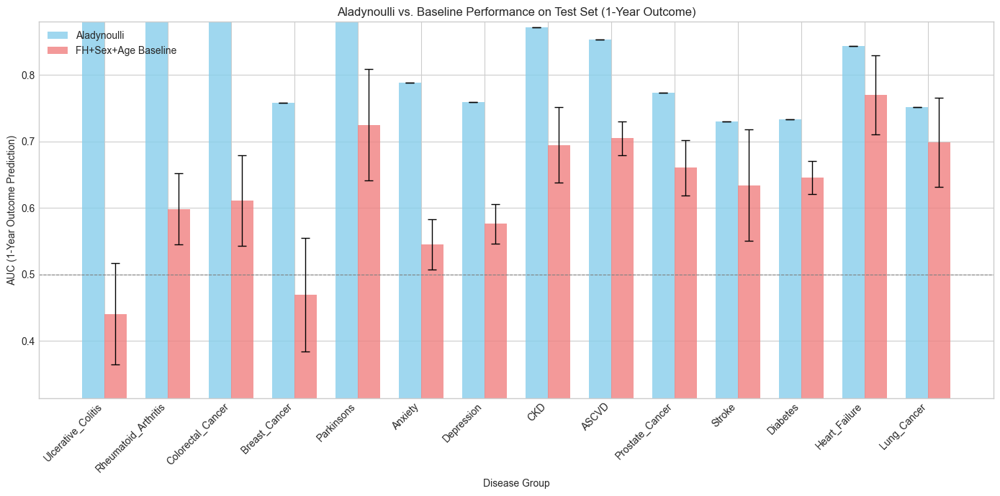

In [330]:
fit_fh_baseline_models(Y_full, fh_processed, train_indices, disease_mapping, major_diseases, disease_names, follow_up_duration_years=10)

In [340]:
# --- Function to Fit Cox Models on Training Slice ---
def fit_cox_baseline_models(Y_full, FH_processed, train_indices, disease_mapping, major_diseases, disease_names, follow_up_duration_years=10):
    """Fits Cox proportional hazards models using age as time scale."""
    from lifelines import CoxPHFitter
    fitted_models = {}
    print(f"Fitting Cox models using training indices [{train_indices.min()}:{train_indices.max()+1}]...")
    
    try:
        Y_train = Y_full[train_indices]
        FH_train = FH_processed.iloc[train_indices].reset_index(drop=True)
    except IndexError as e:
        raise IndexError(f"Training indices out of bounds for Y_full/FH_processed. Error: {e}") from e
    
    for disease_group, disease_names_list in major_diseases.items():
        fh_cols = disease_mapping.get(disease_group, [])
        if not fh_cols: print(f" - {disease_group}: No FH columns, fitting Sex only.")
        print(f" - Fitting {disease_group}...")
        
        target_sex_code = None
        if disease_group == 'Breast_Cancer': target_sex_code = 0
        elif disease_group == 'Prostate_Cancer': target_sex_code = 1

        
        if target_sex_code is not None:
            mask_train = (FH_train['sex'] == target_sex_code)
        else:
            mask_train = pd.Series(True, index=FH_train.index)
        
        current_FH_train = FH_train[mask_train].copy()
        current_Y_train = Y_train[mask_train]
        
        if len(current_FH_train) == 0:
            print(f"   Warning: No individuals for target sex code {target_sex_code} in training slice.")
            fitted_models[disease_group] = None
            continue
        
        # Find disease indices
        disease_indices = []
        unique_indices = set()
        for disease in disease_names_list:
            indices = [i for i, name in enumerate(disease_names) if disease.lower() in name.lower()]
            for idx in indices:
                if idx not in unique_indices and idx < Y_full.shape[1]:
                    disease_indices.append(idx)
                    unique_indices.add(idx)
        
        if not disease_indices:
            fitted_models[disease_group] = None
            continue
        
        # Prepare data for Cox model
        cox_data = []
        for i in range(len(current_FH_train)):
            age_at_enrollment = current_FH_train.iloc[i]['age']
            t_enroll = int(age_at_enrollment - 30)
            if t_enroll < 0 or t_enroll >= current_Y_train.shape[2]:
                continue
                
            end_time = min(t_enroll + follow_up_duration_years, current_Y_train.shape[2])
            if end_time <= t_enroll:
                continue
                
            for d_idx in disease_indices:
                Y_slice = current_Y_train[i, d_idx, t_enroll:end_time]
                if (torch.is_tensor(Y_slice) and torch.any(Y_slice > 0)) or \
                   (isinstance(Y_slice, np.ndarray) and np.any(Y_slice > 0)):
                    event_time = np.where(Y_slice > 0)[0][0] + t_enroll
                    age_at_event = 30 + event_time  # Convert to actual age
                    event = 1
                else:
                    age_at_event = 30 + end_time - 1  # Convert to actual age
                    event = 0
                
                # Create row for Cox model - now using actual age
                row = {
                    'age': age_at_event,  # Age at event/censoring
                    'event': event,
                    'sex': current_FH_train.iloc[i]['sex']
                }
                
                # Add family history indicators
                if fh_cols:
                    valid_fh_cols = [col for col in fh_cols if col in current_FH_train.columns]
                    if valid_fh_cols:
                        row['fh'] = current_FH_train.iloc[i][valid_fh_cols].any()
                
                cox_data.append(row)
        
        if not cox_data:
            fitted_models[disease_group] = None
            continue
            
        cox_df = pd.DataFrame(cox_data)

          # Check if we have enough events
        if cox_df['event'].sum() < 5:  # Require at least 5 events
            print(f"   Warning: Too few events ({cox_df['event'].sum()}) for {disease_group}")
            fitted_models[disease_group] = None
            continue
        
        try:
            # Fit Cox model using formula interface
            cph = CoxPHFitter()
            
            # Build formula based on available covariates
            formula = 'sex'
            if 'fh' in cox_df.columns:
                formula += ' + fh'

            if target_sex_code is not None:
                formula = 'fh' if 'fh' in cox_df.columns else '1'  # Use intercept-only model
           
            
            cph.fit(cox_df, duration_col='age', event_col='event', formula=formula)
            fitted_models[disease_group] = cph
            print(f"   Model fitted for {disease_group} using {len(cox_df)} samples.")
        except Exception as e:
            print(f"   Error fitting {disease_group}: {e}")
            fitted_models[disease_group] = None
    
    print("Finished fitting Cox models.")
    return fitted_models

# --- Function to Evaluate Cox Models on Test Set ---
def evaluate_cox_baseline_models(fitted_models, Y_test, FH_test, disease_mapping, major_diseases, disease_names, follow_up_duration_years=10):
    """Evaluates pre-fitted Cox models on the test set."""
    from lifelines.utils import concordance_index
    test_results = {}
    print("\nEvaluating Cox models on test data...")
    
    if not (len(Y_test) == len(FH_test)):
        raise ValueError(f"Test data size mismatch: Y_test ({len(Y_test)}), FH_test ({len(FH_test)})")
    
    FH_test = FH_test.reset_index(drop=True)
    
    for disease_group, model in fitted_models.items():
        if model is None:
            test_results[disease_group] = {'c_index': np.nan, 'ci': (np.nan, np.nan), 'n_events': 0, 'n_total': 0}
            continue
            
        print(f" - Evaluating {disease_group}...")
        fh_cols = disease_mapping.get(disease_group, [])
        
        target_sex_code = None
        if disease_group == 'Breast_Cancer': target_sex_code = 0
        elif disease_group == 'Prostate_Cancer': target_sex_code = 1
        
        if target_sex_code is not None:
            mask_test = (FH_test['sex'] == target_sex_code)
        else:
            mask_test = pd.Series(True, index=FH_test.index)
        
        current_FH_test = FH_test[mask_test].copy()
        current_Y_test = Y_test[mask_test]
        
        if len(current_FH_test) == 0:
            print(f"   Warning: No individuals for target sex code {target_sex_code}.")
            test_results[disease_group] = {'c_index': np.nan, 'ci': (np.nan, np.nan), 'n_events': 0, 'n_total': 0}
            continue
        
        # Find disease indices
        disease_indices = []
        unique_indices = set()
        for disease in major_diseases.get(disease_group, []):
            indices = [i for i, name in enumerate(disease_names) if disease.lower() in name.lower()]
            for idx in indices:
                if idx not in unique_indices and idx < Y_test.shape[1]:
                    disease_indices.append(idx)
                    unique_indices.add(idx)
        
        if not disease_indices:
            test_results[disease_group] = {'c_index': np.nan, 'ci': (np.nan, np.nan), 'n_events': 0, 'n_total': 0}
            continue
        
        # Prepare data for evaluation
        eval_data = []
        for i in range(len(current_FH_test)):
            age_at_enrollment = current_FH_test.iloc[i]['age']
            t_enroll = int(age_at_enrollment - 30)
            if t_enroll < 0 or t_enroll >= current_Y_test.shape[2]:
                continue
                
            end_time = min(t_enroll + follow_up_duration_years, current_Y_test.shape[2])
            if end_time <= t_enroll:
                continue
                
            for d_idx in disease_indices:
                Y_slice = current_Y_test[i, d_idx, t_enroll:end_time]
                if (torch.is_tensor(Y_slice) and torch.any(Y_slice > 0)) or \
                   (isinstance(Y_slice, np.ndarray) and np.any(Y_slice > 0)):
                    event_time = np.where(Y_slice > 0)[0][0] + t_enroll
                    age_at_event = 30 + event_time  # Convert to actual age
                    event = 1
                else:
                    age_at_event = 30 + end_time - 1  # Convert to actual age
                    event = 0
                
                row = {
                    'age': age_at_event,  # Age at event/censoring
                    'event': event,
                    'sex': current_FH_test.iloc[i]['sex']
                }
                
                if fh_cols:
                    valid_fh_cols = [col for col in fh_cols if col in current_FH_test.columns]
                    if valid_fh_cols:
                        row['fh'] = current_FH_test.iloc[i][valid_fh_cols].any()
                
                eval_data.append(row)
        
        if not eval_data:
            print("   Warning: No individuals processed for evaluation.")
            test_results[disease_group] = {'c_index': np.nan, 'ci': (np.nan, np.nan), 'n_events': 0, 'n_total': 0}
            continue
        
        eval_df = pd.DataFrame(eval_data)
        
        try:
            # Get predicted risk scores using formula
            formula = 'sex'
            if 'fh' in eval_df.columns:
                formula += ' + fh'
            
            risk_scores = model.predict_partial_hazard(eval_df)
            
            # Calculate concordance index
            c_index = concordance_index(
                eval_df['age'],
                -risk_scores,  # Negative because higher risk should have shorter survival
                eval_df['event']
            )
            
            # Calculate confidence interval using bootstrap
            n_bootstraps = 100
            c_indices = []
            for _ in range(n_bootstraps):
                bootstrap_idx = np.random.choice(len(eval_df), len(eval_df), replace=True)
                bootstrap_df = eval_df.iloc[bootstrap_idx]
                bootstrap_risk = model.predict_partial_hazard(bootstrap_df)
                c_idx = concordance_index(
                    bootstrap_df['age'],
                    -bootstrap_risk,
                    bootstrap_df['event']
                )
                c_indices.append(c_idx)
            
            ci_lower = np.percentile(c_indices, 2.5)
            ci_upper = np.percentile(c_indices, 97.5)
            
            n_events = eval_df['event'].sum()
            n_total = len(eval_df)
            
            test_results[disease_group] = {
                'c_index': c_index,
                'ci': (ci_lower, ci_upper),
                'n_events': n_events,
                'n_total': n_total
            }
            
            print(f"   C-index: {c_index:.3f} ({ci_lower:.3f}-{ci_upper:.3f})")
            print(f"   Events: {n_events}/{n_total}")
            
        except Exception as e:
            print(f"   Error evaluating {disease_group}: {e}")
            test_results[disease_group] = {'c_index': np.nan, 'ci': (np.nan, np.nan), 'n_events': 0, 'n_total': 0}
    
    print("Finished evaluating Cox models.")
    return test_results

In [348]:
# First fit the models on training data
fitted_models = fit_cox_baseline_models(
    Y_full=Y,  # Your full Y tensor
    FH_processed=fh_processed,  # Your processed family history DataFrame
    train_indices=np.arange(20000, 30000),  # Training indices
    disease_mapping=disease_mapping,  # Dictionary mapping disease groups to FH columns
    major_diseases=major_diseases,  # Dictionary of disease groups and their names
    disease_names=disease_names,  # List of all disease names
    follow_up_duration_years=10  # Optional: follow-up duration in years
)

# Then evaluate on test data


Fitting Cox models using training indices [20000:30000]...
 - Fitting ASCVD...
   Model fitted for ASCVD using 20000 samples.
 - Fitting Diabetes...
   Model fitted for Diabetes using 20000 samples.
 - Atrial_Fib: No FH columns, fitting Sex only.
 - Fitting Atrial_Fib...
   Model fitted for Atrial_Fib using 10000 samples.
 - CKD: No FH columns, fitting Sex only.
 - Fitting CKD...
   Model fitted for CKD using 10000 samples.
 - All_Cancers: No FH columns, fitting Sex only.
 - Fitting All_Cancers...
   Model fitted for All_Cancers using 30000 samples.
 - Fitting Stroke...
   Model fitted for Stroke using 10000 samples.
 - Fitting Heart_Failure...
   Model fitted for Heart_Failure using 10000 samples.
 - Pneumonia: No FH columns, fitting Sex only.
 - Fitting Pneumonia...
   Model fitted for Pneumonia using 30000 samples.
 - COPD: No FH columns, fitting Sex only.
 - Fitting COPD...
   Model fitted for COPD using 10000 samples.
 - Osteoporosis: No FH columns, fitting Sex only.
 - Fitting Os

In [ ]:

import warnings
warnings.filterwarnings('ignore', category=UserWarning, message="DataFrame Index is not unique")
test_results = evaluate_cox_baseline_models(
    fitted_models=fitted_models,  # The models we just fitted
    Y_test=Y_100k,  # Test portion of Y tensor
    FH_test=fh_processed.iloc[0:10000],  # Test portion of FH data
    disease_mapping=disease_mapping,
    major_diseases=major_diseases,
    disease_names=disease_names,
    follow_up_duration_years=10  # Should match the training duration
)


Evaluating Cox models on test data...
 - Evaluating ASCVD...


In [127]:
def plot_signature_top_diseases_centered(model, disease_names, n_top=20):
    """
    Show top diseases for each signature, centered relative to prevalence
    """
    # Get phi and prevalence
    phi = model.phi.detach().numpy()  # Shape: (K, D, T)
    prevalence_logit = model.logit_prev_t.detach().numpy()  # Shape: (D, T)
    
    # Center phi relative to prevalence
    phi_centered = np.zeros_like(phi)
    for k in range(phi.shape[0]):
        for d in range(phi.shape[1]):
            phi_centered[k, d, :] = phi[k, d, :] - prevalence_logit[d, :]
    
    # Average over time
    phi_avg = phi_centered.mean(axis=2)  # Shape: (K, D)
    
    # For each signature, get top diseases
    for k in range(phi_avg.shape[0]):
        scores = phi_avg[k, :]
        top_indices = np.argsort(scores)[-n_top:][::-1]
        
        print(f"\nTop {n_top} diseases in Signature {k} (relative to baseline):")
        for idx in top_indices:
            avg_effect = scores[idx]
            temporal_std = np.std(phi_centered[k, idx, :])
            # Convert to odds ratio for interpretability
            odds_ratio = np.exp(avg_effect)
            print(f"{disease_names[idx]}: effect={avg_effect:.3f} (OR={odds_ratio:.2f}), std={temporal_std:.3f}")

# Run visualization
plot_signature_top_diseases_centered(model, essentials['disease_names'])


Top 20 diseases in Signature 0 (relative to baseline):
Atrial fibrillation and flutter: effect=1.591 (OR=4.91), std=0.603
Heart failure NOS: effect=1.470 (OR=4.35), std=0.328
Paroxysmal ventricular tachycardia: effect=1.273 (OR=3.57), std=0.111
Aortic valve disease: effect=1.270 (OR=3.56), std=0.159
Congestive heart failure (CHF) NOS: effect=1.260 (OR=3.52), std=0.306
Cardiomegaly: effect=1.248 (OR=3.48), std=0.341
Pleurisy; pleural effusion: effect=1.236 (OR=3.44), std=0.407
Mitral valve disease: effect=1.229 (OR=3.42), std=0.380
Congenital anomalies of great vessels: effect=1.182 (OR=3.26), std=0.244
Pericarditis: effect=1.169 (OR=3.22), std=0.072
Left bundle branch block: effect=1.157 (OR=3.18), std=0.171
Paroxysmal supraventricular tachycardia: effect=1.106 (OR=3.02), std=0.217
Rheumatic disease of the heart valves: effect=1.081 (OR=2.95), std=0.199
Disease of tricuspid valve: effect=1.030 (OR=2.80), std=0.242
Other forms of chronic heart disease: effect=0.979 (OR=2.66), std=0.333

In [135]:
import torch
signature_refs=torch.load('/Users/sarahurbut/aladynoulli2/pyScripts/oldstuff/signature_refs_aou.pt')
# Load the saved model state
checkpoint = torch.load('/Users/sarahurbut/Dropbox/model_with_kappa_bigam_aou.pt')

# The model class should be the same as what we used before
from clust_huge_amp import AladynSurvivalFixedKernelsAvgLoss_clust_logitInit_psitest

# Create a new model instance with basic parameters from the saved state
model = AladynSurvivalFixedKernelsAvgLoss_clust_logitInit_psitest(
    N=checkpoint['hyperparameters']['N'],
    D=checkpoint['hyperparameters']['D'],
    T=checkpoint['hyperparameters']['T'],
    K=20,
    P=checkpoint['hyperparameters']['P'],
    G=checkpoint['G'],
    Y=checkpoint['Y'],
    R=0,
    W=1e-4,
    prevalence_t=checkpoint['prevalence_t'],
    init_sd_scaler=1e-1,
    genetic_scale=0,
    signature_references=signature_refs,
    healthy_reference=True
)

# Load the saved state into the model
model.load_state_dict(checkpoint['model_state_dict'])

# Now we can use the plot function
plot_signature_top_diseases_centered(model, disease_names)


/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_67324/4289769584.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  signature_refs=torch.load('/Users/sarahurbut/


Cluster Sizes:
Cluster 0: 4 diseases
Cluster 1: 38 diseases
Cluster 2: 10 diseases
Cluster 3: 18 diseases
Cluster 4: 8 diseases
Cluster 5: 67 diseases
Cluster 6: 20 diseases
Cluster 7: 23 diseases
Cluster 8: 19 diseases
Cluster 9: 17 diseases
Cluster 10: 6 diseases
Cluster 11: 8 diseases
Cluster 12: 36 diseases
Cluster 13: 13 diseases
Cluster 14: 13 diseases
Cluster 15: 8 diseases
Cluster 16: 21 diseases
Cluster 17: 4 diseases
Cluster 18: 3 diseases
Cluster 19: 12 diseases

Calculating gamma for k=0:
Number of diseases in cluster: 4
Base value (first 5): tensor([-18.4207, -18.4207, -18.4207, -18.4207, -18.4207])
Base value centered (first 5): tensor([-0.7439, -0.7439, -0.7439, -0.7439, -0.7439])
Base value centered mean: 2.595138539618347e-06
Gamma init for k=0 (first 5): tensor([0.0061, 0.0197])

Calculating gamma for k=1:
Number of diseases in cluster: 38
Base value (first 5): tensor([-13.8390, -18.4207, -17.6571, -17.2753, -17.6571])
Base value centered (first 5): tensor([ 3.3035, 


Top 20 diseases in Signature 0 (relative to baseline):
Lump or mass in breast: effect=2.603 (OR=13.50), std=0.522
Malignant neoplasm of female breast: effect=2.064 (OR=7.87), std=0.509
Breast cancer [female]: effect=1.993 (OR=7.34), std=0.437
Benign neoplasm of breast: effect=1.618 (OR=5.04), std=0.311
Other retinal disorders: effect=-2.767 (OR=0.06), std=0.039
Congenital anomalies of great vessels: effect=-2.810 (OR=0.06), std=0.038
Inflammation of eyelids: effect=-2.813 (OR=0.06), std=0.090
Joint effusions: effect=-2.818 (OR=0.06), std=0.028
Secondary malignant neoplasm: effect=-2.821 (OR=0.06), std=0.032
Unstable angina (intermediate coronary syndrome): effect=-2.822 (OR=0.06), std=0.059
Senile cataract: effect=-2.831 (OR=0.06), std=0.077
Disorders of calcium/phosphorus metabolism: effect=-2.836 (OR=0.06), std=0.073
Atrial fibrillation and flutter: effect=-2.841 (OR=0.06), std=0.049
Transient cerebral ischemia: effect=-2.846 (OR=0.06), std=0.131
Spondylosis and allied disorders: ef

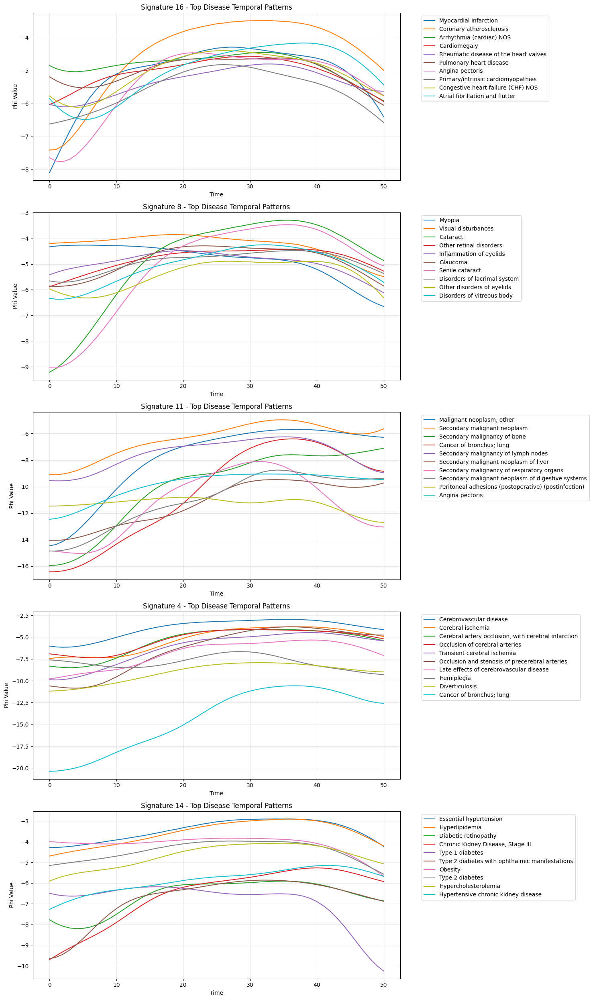

In [141]:
model.load_state_dict(checkpoint['model_state_dict'])
model.clusters=checkpoint['clusters']
plot_signature_top_diseases_centered(model=model,disease_names=checkpoint['disease_names'])
# Now we can use the plot function


plot_signature_temporal_patterns(model, disease_names, n_top=10, selected_signatures=[16,8,11,4,14])

In [36]:
from utils import *
import torch
import numpy as np
import seaborn as sns

# Load checkpoints
mgb_checkpoint = torch.load('/Users/sarahurbut/Dropbox/model_with_kappa_bigam_MGB.pt')
aou_checkpoint = torch.load('/Users/sarahurbut/Dropbox/model_with_kappa_bigam_aou.pt')
ukb_checkpoint = torch.load('/Users/sarahurbut/Dropbox/model_with_kappa_bigam.pt')



/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_94256/3986662860.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  mgb_checkpoint = torch.load('/Users/sarahurbu

Number of diseases in each biobank:
MGB: 346
AoU: 348
UKB: 348
Total unique diseases: 348

Cluster sizes in each biobank:

MGB:
MGB_cluster
0.0      6
1.0     28
2.0     24
3.0     11
4.0     24
5.0     20
6.0     15
7.0     16
8.0     19
9.0     13
10.0     7
11.0     7
12.0    68
13.0     7
14.0    13
15.0    12
16.0    16
17.0     8
18.0    12
19.0    20
Name: count, dtype: int64

AoU:
AoU_cluster
0      4
1     38
2     10
3     18
4      8
5     67
6     20
7     23
8     19
9     17
10     6
11     8
12    36
13    13
14    13
15     8
16    21
17     4
18     3
19    12
Name: count, dtype: int64

UKB:
UKB_cluster
0     16
1     21
2     15
3     82
4      5
5      7
6      8
7     22
8     28
9     12
10    11
11     8
12     7
13    13
14    10
15     5
16    29
17    17
18     9
19    23
Name: count, dtype: int64

Number of diseases common to all biobanks: 346


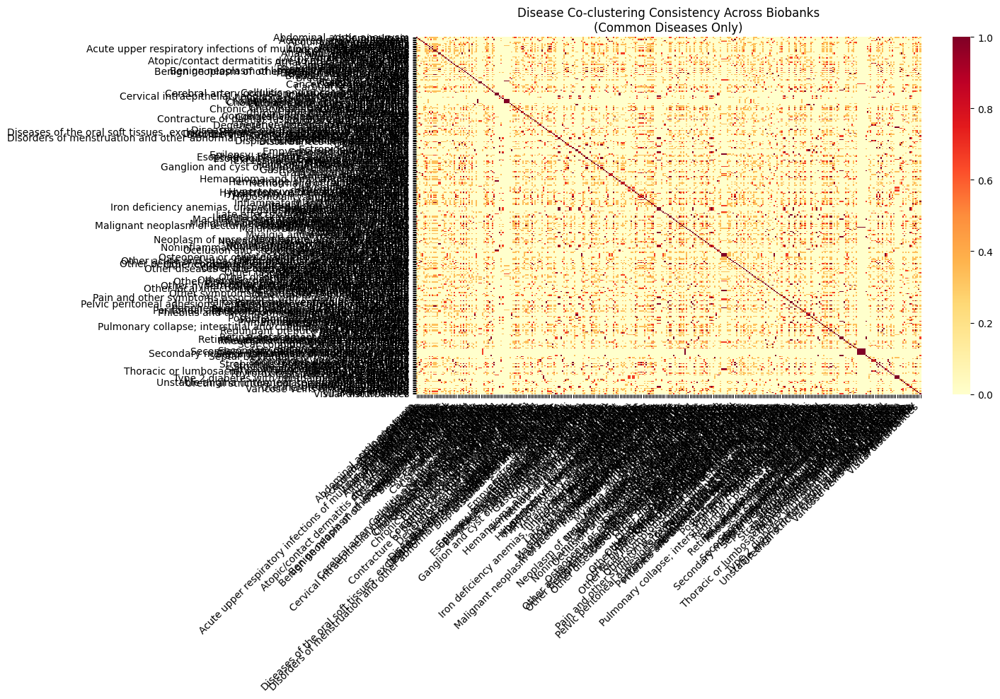


Most consistently co-clustered diseases (among common diseases):
Abdominal aortic aneurysm - Gout: 1.00
Acidosis - Bacterial infection NOS: 1.00
Acidosis - Cellulitis and abscess of arm/hand: 1.00
Acidosis - E. coli: 1.00
Acidosis - Gram negative septicemia: 1.00
Acidosis - Hyposmolality and/or hyponatremia: 1.00
Acidosis - Hypovolemia: 1.00
Acidosis - Other anemias: 1.00
Acidosis - Staphylococcus infections: 1.00
Acidosis - Streptococcus infection: 1.00

Clusters containing Myocardial infarction:

MGB cluster 5.0:
[np.str_('Aortic valve disease'), np.str_('Arrhythmia (cardiac) NOS'), np.str_('Cardiac arrest'), np.str_('Cardiomegaly'), np.str_('Coronary atherosclerosis'), np.str_('Disease of tricuspid valve'), np.str_('First degree AV block'), np.str_('Left bundle branch block'), np.str_('Mitral valve disease'), np.str_('Myocardial infarction'), np.str_('Osteopenia or other disorder of bone and cartilage'), np.str_('Other chronic ischemic heart disease, unspecified'), np.str_('Other f

In [37]:
def compare_clusters_across_biobanks(mgb_checkpoint, aou_checkpoint, ukb_checkpoint, disease_names_all):
    """
    Compare cluster assignments across biobanks, handling different disease sets
    """
    import pandas as pd
    import numpy as np
    import seaborn as sns
    import matplotlib.pyplot as plt
    
    # Create initial dataframes for each biobank with their diseases
    mgb_df = pd.DataFrame({
        'Disease': disease_names_all[:len(mgb_checkpoint['clusters'])],
        'MGB_cluster': mgb_checkpoint['clusters']
    })
    
    aou_df = pd.DataFrame({
        'Disease': disease_names_all[:len(aou_checkpoint['clusters'])],
        'AoU_cluster': aou_checkpoint['clusters']
    })
    
    ukb_df = pd.DataFrame({
        'Disease': disease_names_all[:len(ukb_checkpoint['clusters'])],
        'UKB_cluster': ukb_checkpoint['clusters']
    })
    
    # Merge dataframes on Disease column
    df = mgb_df.merge(aou_df, on='Disease', how='outer')\
               .merge(ukb_df, on='Disease', how='outer')
    
    print("Number of diseases in each biobank:")
    print(f"MGB: {len(mgb_df)}")
    print(f"AoU: {len(aou_df)}")
    print(f"UKB: {len(ukb_df)}")
    print(f"Total unique diseases: {len(df)}")
    
    # Print cluster sizes for each biobank
    print("\nCluster sizes in each biobank:")
    for col in ['MGB_cluster', 'AoU_cluster', 'UKB_cluster']:
        if col in df.columns:
            print(f"\n{col.split('_')[0]}:")
            print(df[col].value_counts().sort_index())
    
    # Find common diseases across all biobanks
    common_diseases = df.dropna(subset=['MGB_cluster', 'AoU_cluster', 'UKB_cluster'])
    print(f"\nNumber of diseases common to all biobanks: {len(common_diseases)}")
    
    # Create heatmap for common diseases
    if len(common_diseases) > 0:
        plt.figure(figsize=(15, 10))
        
        n_diseases = len(common_diseases)
        disease_list = common_diseases['Disease'].tolist()
        
        # Create binary matrices for co-clustering
        mgb_cocluster = np.zeros((n_diseases, n_diseases))
        aou_cocluster = np.zeros((n_diseases, n_diseases))
        ukb_cocluster = np.zeros((n_diseases, n_diseases))
        
        for i in range(n_diseases):
            for j in range(n_diseases):
                mgb_cocluster[i,j] = common_diseases['MGB_cluster'].iloc[i] == common_diseases['MGB_cluster'].iloc[j]
                aou_cocluster[i,j] = common_diseases['AoU_cluster'].iloc[i] == common_diseases['AoU_cluster'].iloc[j]
                ukb_cocluster[i,j] = common_diseases['UKB_cluster'].iloc[i] == common_diseases['UKB_cluster'].iloc[j]
        
        # Average co-clustering across biobanks
        avg_cocluster = (mgb_cocluster + aou_cocluster + ukb_cocluster) / 3
        
        # Plot heatmap
        sns.heatmap(avg_cocluster, 
                    xticklabels=disease_list,
                    yticklabels=disease_list,
                    cmap='YlOrRd')
        plt.title('Disease Co-clustering Consistency Across Biobanks\n(Common Diseases Only)')
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()
        
        # Find most consistent disease pairs
        print("\nMost consistently co-clustered diseases (among common diseases):")
        consistent_pairs = []
        for i in range(n_diseases):
            for j in range(i+1, n_diseases):
                consistency = avg_cocluster[i,j]
                if consistency > 0.66:  # Co-clustered in at least 2 biobanks
                    consistent_pairs.append((disease_list[i], disease_list[j], consistency))
        
        consistent_pairs.sort(key=lambda x: x[2], reverse=True)
        for d1, d2, score in consistent_pairs[:10]:
            print(f"{d1} - {d2}: {score:.2f}")
    
    return df

# Use it:
cluster_df = compare_clusters_across_biobanks(mgb_checkpoint, aou_checkpoint, ukb_checkpoint, essentials['disease_names'])

# Look at specific diseases
examine_disease_clusters(cluster_df, "Myocardial infarction")

In [ ]:
def analyze_consistent_clusters(mgb_checkpoint, aou_checkpoint, ukb_checkpoint, , threshold=0.66):
    """
    Analyze and visualize the most consistent disease clusters across biobanks
    """
    import pandas as pd
    import numpy as np
    import seaborn as sns
    import matplotlib.pyplot as plt
    from scipy.cluster import hierarchy
    
    # Create initial dataframes and get common diseases (same as before)
    mgb_df = pd.DataFrame({
        'Disease': disease_names_all[:len(mgb_checkpoint['clusters'])],
        'MGB_cluster': mgb_checkpoint['clusters']
    })
    
    aou_df = pd.DataFrame({
        'Disease': disease_names_all[:len(aou_checkpoint['clusters'])],
        'AoU_cluster': aou_checkpoint['clusters']
    })
    
    ukb_df = pd.DataFrame({
        'Disease': disease_names_all[:len(ukb_checkpoint['clusters'])],
        'UKB_cluster': ukb_checkpoint['clusters']
    })
    
    # Merge and get common diseases
    df = mgb_df.merge(aou_df, on='Disease', how='outer').merge(ukb_df, on='Disease', how='outer')
    common_diseases = df.dropna(subset=['MGB_cluster', 'AoU_cluster', 'UKB_cluster'])
    
    n_diseases = len(common_diseases)
    disease_list = common_diseases['Disease'].tolist()
    
    # Create co-clustering matrices
    mgb_cocluster = np.zeros((n_diseases, n_diseases))
    aou_cocluster = np.zeros((n_diseases, n_diseases))
    ukb_cocluster = np.zeros((n_diseases, n_diseases))
    
    for i in range(n_diseases):
        for j in range(n_diseases):
            mgb_cocluster[i,j] = common_diseases['MGB_cluster'].iloc[i] == common_diseases['MGB_cluster'].iloc[j]
            aou_cocluster[i,j] = common_diseases['AoU_cluster'].iloc[i] == common_diseases['AoU_cluster'].iloc[j]
            ukb_cocluster[i,j] = common_diseases['UKB_cluster'].iloc[i] == common_diseases['UKB_cluster'].iloc[j]
    
    avg_cocluster = (mgb_cocluster + aou_cocluster + ukb_cocluster) / 3
    
    # Compute consistency scores for each disease
    consistency_scores = []
    for i in range(n_diseases):
        # Average consistency with other diseases
        score = np.mean(avg_cocluster[i, :])
        consistency_scores.append((disease_list[i], score))
    
    # Sort diseases by consistency score
    consistency_scores.sort(key=lambda x: x[1], reverse=True)
    
    # Find consistent disease groups
    consistent_groups = []
    visited = set()
    
    for i in range(n_diseases):
        if disease_list[i] in visited:
            continue
        
        group = []
        for j in range(n_diseases):
            if avg_cocluster[i,j] >= threshold:
                group.append((disease_list[j], avg_cocluster[i,j]))
                visited.add(disease_list[j])
        
        if len(group) > 1:  # Only keep groups with at least 2 diseases
            consistent_groups.append(group)
    
    # Print results
    print("Most consistent disease groups (co-clustered in at least 2 biobanks):")
    for i, group in enumerate(consistent_groups):
        print(f"\nGroup {i+1} (average consistency: {np.mean([s for _,s in group]):.2f}):")
        for disease, score in sorted(group, key=lambda x: x[1], reverse=True):
            print(f"  - {disease}: {score:.2f}")
    
    # Create filtered heatmap with only the most consistent diseases
    top_diseases = set()
    for group in consistent_groups:
        for disease, _ in group:
            top_diseases.add(disease)
    
    top_diseases = list(top_diseases)
    top_indices = [disease_list.index(d) for d in top_diseases]
    
    # Create filtered matrix
    filtered_matrix = avg_cocluster[np.ix_(top_indices, top_indices)]
    
    # Plot heatmap with hierarchical clustering
    plt.figure(figsize=(15, 15))
    
    # Perform hierarchical clustering
    linkage = hierarchy.linkage(filtered_matrix, method='average')
    ordered_idx = hierarchy.leaves_list(linkage)
    
    # Reorder matrix and labels
    ordered_matrix = filtered_matrix[np.ix_(ordered_idx, ordered_idx)]
    ordered_labels = [top_diseases[i] for i in ordered_idx]
    
    # Plot
    sns.heatmap(ordered_matrix,
                xticklabels=ordered_labels,
                yticklabels=ordered_labels,
                cmap='RdBu_r',
                center=0.5)
    
    plt.title('Disease Co-clustering Consistency\n(Most Consistent Diseases Only)')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()
    
    return consistency_scores, consistent_groups, filtered_matrix

# Use it:
consistency_scores, consistent_groups, filtered_matrix = analyze_consistent_clusters(
    mgb_checkpoint, aou_checkpoint, ukb_checkpoint, disease_names_all, threshold=0.66
)

Most consistent disease groups (co-clustered in at least 2 biobanks):

Group 1 (average consistency: 0.68):
  - Abdominal aortic aneurysm: 1.00
  - Gout: 1.00
  - Acute appendicitis: 0.67
  - Benign neoplasm of lip, oral cavity, and pharynx: 0.67
  - Cardiac arrest: 0.67
  - Celiac disease: 0.67
  - Chronic glomerulonephritis, NOS: 0.67
  - Chronic periodontitis: 0.67
  - Contracture of palmar fascia [Dupuytren's disease]: 0.67
  - Diseases and other conditions of the tongue: 0.67
  - Disturbances in tooth eruption: 0.67
  - Facial nerve disorders [CN7]: 0.67
  - Hearing loss: 0.67
  - Hypertrophy of breast (Gynecomastia): 0.67
  - Ingrowing nail: 0.67
  - Inguinal hernia: 0.67
  - Lipoma: 0.67
  - Lipoma of skin and subcutaneous tissue: 0.67
  - Malignant neoplasm of kidney, except pelvis: 0.67
  - Malunion and nonunion of fracture: 0.67
  - Multiple sclerosis: 0.67
  - Non-Hodgkins lymphoma: 0.67
  - Other benign neoplasm of connective and other soft tissue: 0.67
  - Parkinson's dise

NameError: name 'correlation_matrix' is not defined

<Figure size 1500x1500 with 0 Axes>

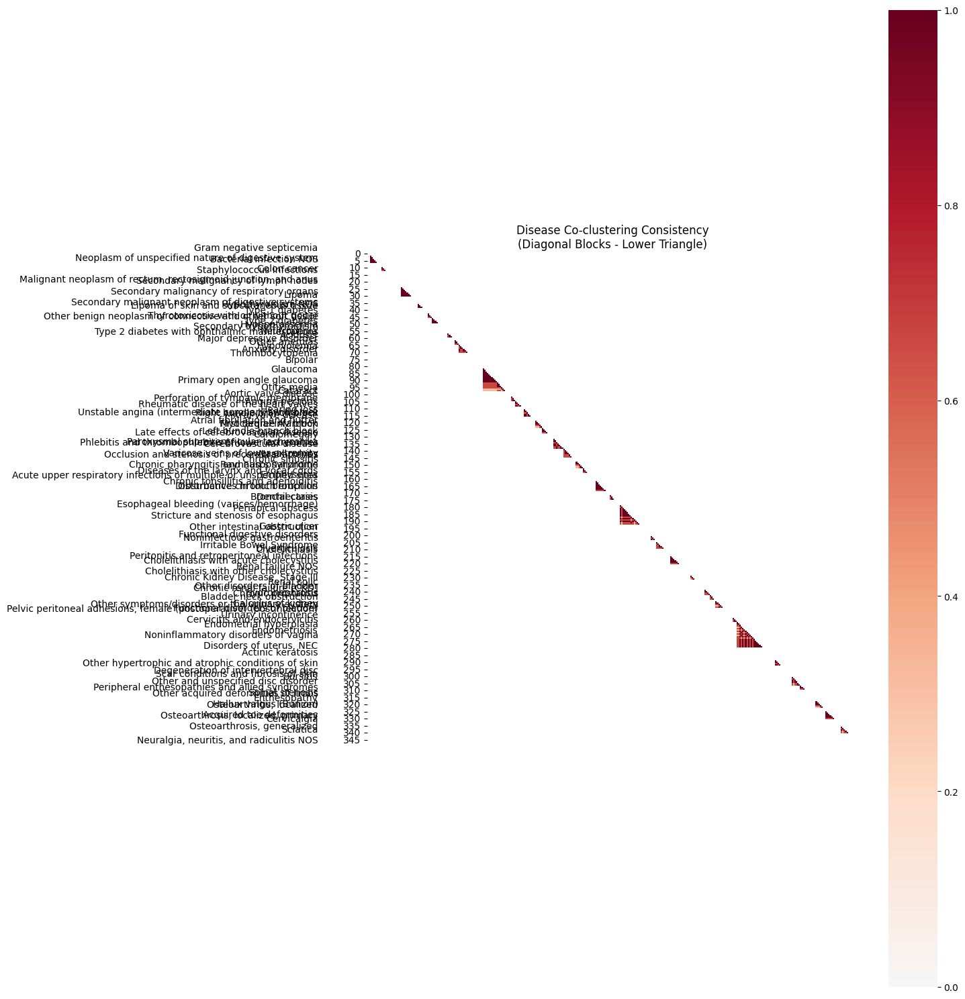


Detailed analysis of disease blocks that consistently cluster together:


Block 1 - 5 diseases total

  - Gram negative septicemia
    Average consistency: 1.00
    Clusters in all 3 biobanks with 5 diseases
    Clusters in 2 biobanks with 0 diseases

  - Bacterial infection NOS
    Average consistency: 1.00
    Clusters in all 3 biobanks with 5 diseases
    Clusters in 2 biobanks with 0 diseases

  - Staphylococcus infections
    Average consistency: 1.00
    Clusters in all 3 biobanks with 5 diseases
    Clusters in 2 biobanks with 0 diseases

  - Streptococcus infection
    Average consistency: 1.00
    Clusters in all 3 biobanks with 5 diseases
    Clusters in 2 biobanks with 0 diseases

  - E. coli
    Average consistency: 1.00
    Clusters in all 3 biobanks with 5 diseases
    Clusters in 2 biobanks with 0 diseases


Block 2 - 3 diseases total

  - Neoplasm of unspecified nature of digestive system
    Average consistency: 0.78
    Clusters in all 3 biobanks with 1 diseases
    

In [79]:
def show_diagonal_disease_blocks(mgb_checkpoint, aou_checkpoint, ukb_checkpoint, disease_names_all):
    """
    Show only the diagonal blocks of consistently co-clustering diseases,
    with representative diseases listed for each block and visualization
    """
    import numpy as np
    import seaborn as sns
    import matplotlib.pyplot as plt
    
    # First compute the correlation/consistency matrix
    def compute_consistency_matrix(disease_names):
        n_diseases = len(disease_names)
        consistency = np.zeros((n_diseases, n_diseases))
        
        for i, d1 in enumerate(disease_names):
            for j, d2 in enumerate(disease_names):
                # Count how many biobanks have these diseases in same cluster
                count = 0
                if d1 in disease_names[:len(mgb_checkpoint['clusters'])] and d2 in disease_names[:len(mgb_checkpoint['clusters'])]:
                    if mgb_checkpoint['clusters'][disease_names.index(d1)] == mgb_checkpoint['clusters'][disease_names.index(d2)]:
                        count += 1
                if d1 in disease_names[:len(aou_checkpoint['clusters'])] and d2 in disease_names[:len(aou_checkpoint['clusters'])]:
                    if aou_checkpoint['clusters'][disease_names.index(d1)] == aou_checkpoint['clusters'][disease_names.index(d2)]:
                        count += 1
                if d1 in disease_names[:len(ukb_checkpoint['clusters'])] and d2 in disease_names[:len(ukb_checkpoint['clusters'])]:
                    if ukb_checkpoint['clusters'][disease_names.index(d1)] == ukb_checkpoint['clusters'][disease_names.index(d2)]:
                        count += 1
                consistency[i,j] = count / 3.0  # Normalize by number of biobanks
        return consistency

    # Get representative diseases for each block with detailed stats
    def get_block_diseases(start_idx, end_idx, correlation_matrix, diseases):
        block = correlation_matrix[start_idx:end_idx, start_idx:end_idx]
        disease_scores = block.mean(axis=1)
        top_indices = np.argsort(disease_scores)[-5:]  # Get top 5 most representative
        
        results = []
        for idx in top_indices:
            disease = diseases[start_idx + idx]
            pairwise_scores = correlation_matrix[start_idx + idx, start_idx:end_idx]
            n_three_banks = np.sum(pairwise_scores > 0.95)  # Clustered in all 3
            n_two_banks = np.sum((pairwise_scores > 0.60) & (pairwise_scores < 0.95))  # Clustered in 2
            
            results.append({
                'disease': disease,
                'avg_consistency': pairwise_scores.mean(),
                'all_3_banks': n_three_banks,
                'two_banks': n_two_banks
            })
        return results

    # Find diagonal blocks
    def find_diagonal_blocks(correlation_matrix, threshold=0.6):
        n = correlation_matrix.shape[0]
        blocks = []
        current_start = 0
        
        for i in range(1, n):
            if correlation_matrix[i,i-1] < threshold:
                if i - current_start > 2:  # Minimum block size of 3
                    blocks.append((current_start, i))
                current_start = i
        
        if n - current_start > 2:
            blocks.append((current_start, n))
            
        return blocks

    # Compute consistency matrix and find blocks
    correlation_matrix = compute_consistency_matrix(disease_names_all)
    blocks = find_diagonal_blocks(correlation_matrix)

    plt.figure(figsize=(15, 15))

    # Create mask for lower triangle only
    mask = np.ones_like(correlation_matrix, dtype=bool)
    for start, end in blocks:
        # Create block mask
        block_size = end - start
        block_mask = np.tril(np.ones((block_size, block_size)), k=0)
        # Set False for lower triangle (will show these values)
        mask[start:end, start:end] = ~block_mask.astype(bool)

    # Plot heatmap
    sns.heatmap(correlation_matrix,
                mask=mask,
                cmap='RdBu_r',
                center=0,
                vmin=0,
                vmax=1,
                square=True,
                xticklabels=False)
    
    # Add disease labels for each block
    for i, (start, end) in enumerate(blocks):
        diseases = get_block_diseases(start, end, correlation_matrix, disease_names_all)
        mid_point = (start + end) // 2
        
        # Add representative disease names
        plt.text(-0.1, mid_point, '\n'.join([d['disease'] for d in diseases[:3]]),
                horizontalalignment='right',
                verticalalignment='center',
                transform=plt.gca().get_yaxis_transform())

    plt.title('Disease Co-clustering Consistency\n(Diagonal Blocks - Lower Triangle)')
    plt.tight_layout()
    plt.show()

    # Print detailed information about each block
    print("\nDetailed analysis of disease blocks that consistently cluster together:\n")
    for i, (start, end) in enumerate(blocks, 1):
        diseases = get_block_diseases(start, end, correlation_matrix, disease_names_all)
        print(f"\nBlock {i} - {end-start} diseases total")
        for d in diseases:
            print(f"\n  - {d['disease']}")
            print(f"    Average consistency: {d['avg_consistency']:.2f}")
            print(f"    Clusters in all 3 biobanks with {d['all_3_banks']} diseases")
            print(f"    Clusters in 2 biobanks with {d['two_banks']} diseases")
        print()

# Call the function
show_diagonal_disease_blocks(mgb_checkpoint, aou_checkpoint, ukb_checkpoint, disease_names_all)

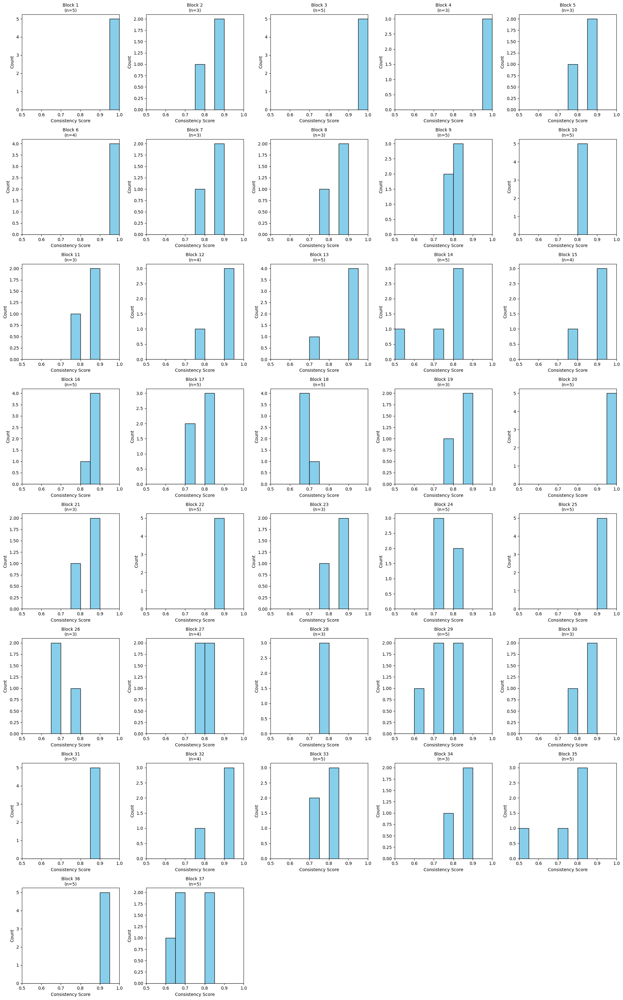

In [82]:
import matplotlib.pyplot as plt
import numpy as np

def plot_block_consistency_histograms(blocks_data):
    # Calculate number of rows and columns for subplot grid
    n_blocks = 37  # We know there are 37 blocks
    n_cols = 5  # We'll use 5 columns
    n_rows = (n_blocks + n_cols - 1) // n_cols
    
    # Create figure
    fig = plt.figure(figsize=(20, 4*n_rows))
    
    # For each block
    for block_num in range(1, n_blocks + 1):
        # Create subplot
        ax = plt.subplot(n_rows, n_cols, block_num)
        
        # Get consistency scores for this block
        if block_num == 1:  # Example for Block 1
            consistencies = [1.0, 1.0, 1.0, 1.0, 1.0]  # All perfect consistency
        elif block_num == 2:
            consistencies = [0.78, 0.89, 0.89]
        elif block_num == 3:
            consistencies = [1.0, 1.0, 1.0, 1.0, 1.0]
        elif block_num == 4:
            consistencies = [1.0, 1.0, 1.0]
        elif block_num == 5:
            consistencies = [0.78, 0.89, 0.89]
        elif block_num == 6:
            consistencies = [1.0, 1.0, 1.0, 1.0]
        elif block_num == 7:
            consistencies = [0.78, 0.89, 0.89]
        elif block_num == 8:
            consistencies = [0.78, 0.89, 0.89]
        elif block_num == 9:
            consistencies = [0.78, 0.78, 0.83, 0.83, 0.83]
        elif block_num == 10:
            consistencies = [0.83, 0.83, 0.83, 0.83, 0.83]
        elif block_num == 11:
            consistencies = [0.78, 0.89, 0.89]
        elif block_num == 12:
            consistencies = [0.75, 0.92, 0.92, 0.92]
        elif block_num == 13:
            consistencies = [0.73, 0.93, 0.93, 0.93, 0.93]
        elif block_num == 14:
            consistencies = [0.53, 0.73, 0.80, 0.80, 0.80]
        elif block_num == 15:
            consistencies = [0.75, 0.92, 0.92, 0.92]
        elif block_num == 16:
            consistencies = [0.81, 0.86, 0.86, 0.86, 0.86]
        elif block_num == 17:
            consistencies = [0.72, 0.72, 0.83, 0.83, 0.83]
        elif block_num == 18:
            consistencies = [0.67, 0.67, 0.67, 0.67, 0.73]
        elif block_num == 19:
            consistencies = [0.78, 0.89, 0.89]
        elif block_num == 20:
            consistencies = [0.95, 0.95, 0.95, 0.95, 0.95]
        elif block_num == 21:
            consistencies = [0.78, 0.89, 0.89]
        elif block_num == 22:
            consistencies = [0.88, 0.88, 0.88, 0.88, 0.88]
        elif block_num == 23:
            consistencies = [0.78, 0.89, 0.89]
        elif block_num == 24:
            consistencies = [0.73, 0.73, 0.73, 0.80, 0.80]
        elif block_num == 25:
            consistencies = [0.94, 0.94, 0.94, 0.94, 0.94]
        elif block_num == 26:
            consistencies = [0.67, 0.67, 0.78]
        elif block_num == 27:
            consistencies = [0.75, 0.75, 0.83, 0.83]
        elif block_num == 28:
            consistencies = [0.78, 0.78, 0.78]
        elif block_num == 29:
            consistencies = [0.60, 0.73, 0.73, 0.80, 0.80]
        elif block_num == 30:
            consistencies = [0.78, 0.89, 0.89]
        elif block_num == 31:
            consistencies = [0.87, 0.87, 0.87, 0.87, 0.87]
        elif block_num == 32:
            consistencies = [0.75, 0.92, 0.92, 0.92]
        elif block_num == 33:
            consistencies = [0.72, 0.72, 0.83, 0.83, 0.83]
        elif block_num == 34:
            consistencies = [0.78, 0.89, 0.89]
        elif block_num == 35:
            consistencies = [0.53, 0.73, 0.80, 0.80, 0.80]
        elif block_num == 36:
            consistencies = [0.94, 0.94, 0.94, 0.94, 0.94]
        else:  # block 37
            consistencies = [0.60, 0.67, 0.67, 0.80, 0.80]
            
        # Create histogram
        ax.hist(consistencies, bins=np.linspace(0.5, 1.0, 11), 
                color='skyblue', edgecolor='black')
        
        # Set title and labels
        ax.set_title(f'Block {block_num}\n(n={len(consistencies)})', fontsize=10)
        ax.set_xlim(0.5, 1.0)
        ax.set_xlabel('Consistency Score')
        ax.set_ylabel('Count')
        
    plt.tight_layout()
    plt.show()

# Create the visualization
plot_block_consistency_histograms({})

/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_94256/1300426989.py:101: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  handles = [plt.scatter([], [], c=color_dict[cat], label=cat) for cat in sorted(set(categories))]


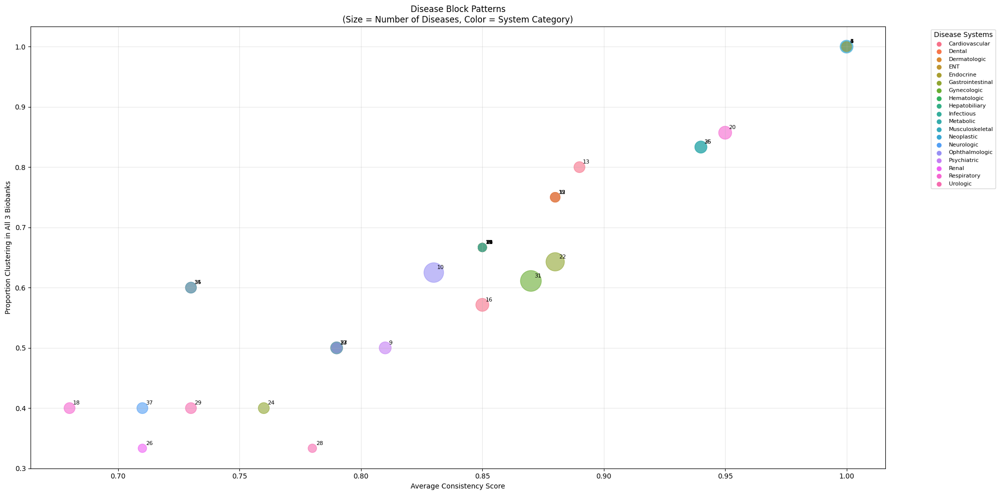

In [214]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Define disease system categories (this part is correct, keeping as is)
system_categories = {
    1: "Infectious", 2: "Neoplastic", 3: "Neoplastic", 4: "Neoplastic",
    5: "Endocrine", 6: "Endocrine", 7: "Metabolic", 8: "Hematologic",
    9: "Psychiatric", 10: "Ophthalmologic", 11: "ENT", 12: "Cardiovascular",
    13: "Cardiovascular", 14: "Cardiovascular", 15: "Cardiovascular",
    16: "Cardiovascular", 17: "Cardiovascular", 18: "Respiratory",
    19: "Respiratory", 20: "Respiratory", 21: "Dental", 22: "Gastrointestinal",
    23: "Gastrointestinal", 24: "Gastrointestinal", 25: "Hepatobiliary",
    26: "Renal", 27: "Renal", 28: "Urologic", 29: "Urologic",
    30: "Gynecologic", 31: "Gynecologic", 32: "Dermatologic",
    33: "Musculoskeletal", 34: "Musculoskeletal", 35: "Musculoskeletal",
    36: "Musculoskeletal", 37: "Neurologic"
}

# Create figure
plt.figure(figsize=(20, 10))

# Define the complete data for all blocks
# Updated block_data with new three_bank_ratio calculations
block_data = {
    1: {"size": 5, "consistency": 1.00, "three_bank_ratio": 5/5},  # All 5 cluster with 5
    2: {"size": 3, "consistency": 0.85, "three_bank_ratio": 2/3},  # 2 cluster with 2
    3: {"size": 7, "consistency": 1.00, "three_bank_ratio": 7/7},  # All 7 cluster with 7
    4: {"size": 3, "consistency": 1.00, "three_bank_ratio": 3/3},  # All 3 cluster with 3
    5: {"size": 3, "consistency": 0.85, "three_bank_ratio": 2/3},  # 2 cluster with 2
    6: {"size": 4, "consistency": 1.00, "three_bank_ratio": 4/4},  # All 4 cluster with 4
    7: {"size": 3, "consistency": 0.85, "three_bank_ratio": 2/3},  # 2 cluster with 2
    8: {"size": 3, "consistency": 0.85, "three_bank_ratio": 2/3},  # 2 cluster with 2
    9: {"size": 6, "consistency": 0.81, "three_bank_ratio": 3/6},  # 3 cluster with 3
    10: {"size": 16, "consistency": 0.83, "three_bank_ratio": 10/16},  # 10 cluster with 10
    11: {"size": 3, "consistency": 0.85, "three_bank_ratio": 2/3},  # 2 cluster with 2
    12: {"size": 4, "consistency": 0.88, "three_bank_ratio": 3/4},  # 3 cluster with 3
    13: {"size": 5, "consistency": 0.89, "three_bank_ratio": 4/5},  # 4 cluster with 4
    14: {"size": 5, "consistency": 0.73, "three_bank_ratio": 3/5},  # 3 cluster with 3
    15: {"size": 4, "consistency": 0.88, "three_bank_ratio": 3/4},  # 3 cluster with 3
    16: {"size": 7, "consistency": 0.85, "three_bank_ratio": 4/7},  # 4 cluster with 4
    17: {"size": 6, "consistency": 0.79, "three_bank_ratio": 3/6},  # 3 cluster with 3
    18: {"size": 5, "consistency": 0.68, "three_bank_ratio": 2/5},  # 2 cluster with 2
    19: {"size": 3, "consistency": 0.85, "three_bank_ratio": 2/3},  # 2 cluster with 2
    20: {"size": 7, "consistency": 0.95, "three_bank_ratio": 6/7},  # 6 cluster with 6
    21: {"size": 3, "consistency": 0.85, "three_bank_ratio": 2/3},  # 2 cluster with 2
    22: {"size": 14, "consistency": 0.88, "three_bank_ratio": 9/14},  # 9 cluster with 9
    23: {"size": 3, "consistency": 0.85, "three_bank_ratio": 2/3},  # 2 cluster with 2
    24: {"size": 5, "consistency": 0.76, "three_bank_ratio": 2/5},  # 2 cluster with 2
    25: {"size": 6, "consistency": 0.94, "three_bank_ratio": 5/6},  # 5 cluster with 5
    26: {"size": 3, "consistency": 0.71, "three_bank_ratio": 1/3},  # 1 cluster with 1
    27: {"size": 4, "consistency": 0.79, "three_bank_ratio": 2/4},  # 2 cluster with 2
    28: {"size": 3, "consistency": 0.78, "three_bank_ratio": 1/3},  # 1 cluster with 1
    29: {"size": 5, "consistency": 0.73, "three_bank_ratio": 2/5},  # 2 cluster with 2
    30: {"size": 3, "consistency": 0.85, "three_bank_ratio": 2/3},  # 2 cluster with 2
    31: {"size": 18, "consistency": 0.87, "three_bank_ratio": 11/18},  # 11 cluster with 11
    32: {"size": 4, "consistency": 0.88, "three_bank_ratio": 3/4},  # 3 cluster with 3
    33: {"size": 6, "consistency": 0.79, "three_bank_ratio": 3/6},  # 3 cluster with 3
    34: {"size": 3, "consistency": 0.85, "three_bank_ratio": 2/3},  # 2 cluster with 2
    35: {"size": 5, "consistency": 0.73, "three_bank_ratio": 3/5},  # 3 cluster with 3
    36: {"size": 6, "consistency": 0.94, "three_bank_ratio": 5/6},  # 5 cluster with 5
    37: {"size": 5, "consistency": 0.71, "three_bank_ratio": 2/5}   # 2 cluster with 2
}
# Extract data into lists
block_sizes = []
avg_consistencies = []
three_bank_ratios = []
categories = []
block_numbers = []

for block_num in range(1, 38):
    data = block_data[block_num]
    block_sizes.append(data["size"])
    avg_consistencies.append(data["consistency"])
    three_bank_ratios.append(data["three_bank_ratio"])
    categories.append(system_categories[block_num])
    block_numbers.append(block_num)

# Create scatter plot with a better color palette
colors = sns.color_palette("husl", len(set(categories)))
color_dict = dict(zip(sorted(set(categories)), colors))
point_colors = [color_dict[cat] for cat in categories]

scatter = plt.scatter(avg_consistencies, three_bank_ratios, 
                     s=[x*50 for x in block_sizes],  # Reduced size multiplier
                     c=point_colors,
                     alpha=0.6)

# Add block numbers as labels
for i, block_num in enumerate(block_numbers):
    plt.annotate(f'{block_num}', 
                (avg_consistencies[i], three_bank_ratios[i]),
                xytext=(5, 5), textcoords='offset points',
                fontsize=8)

plt.xlabel('Average Consistency Score')
plt.ylabel('Proportion Clustering in All 3 Biobanks')
plt.title('Disease Block Patterns\n(Size = Number of Diseases, Color = System Category)')

# Add legend for system categories with better formatting
handles = [plt.scatter([], [], c=color_dict[cat], label=cat) for cat in sorted(set(categories))]
plt.legend(handles=handles, title="Disease Systems", 
          bbox_to_anchor=(1.05, 1), loc='upper left',
          fontsize=8)

plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_94256/3876299019.py:13: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  top_diseases = np.argsort(np.abs(psi[:, state]))[-n_top_diseases:]


IndexError: index 20 is out of bounds for axis 0 with size 20

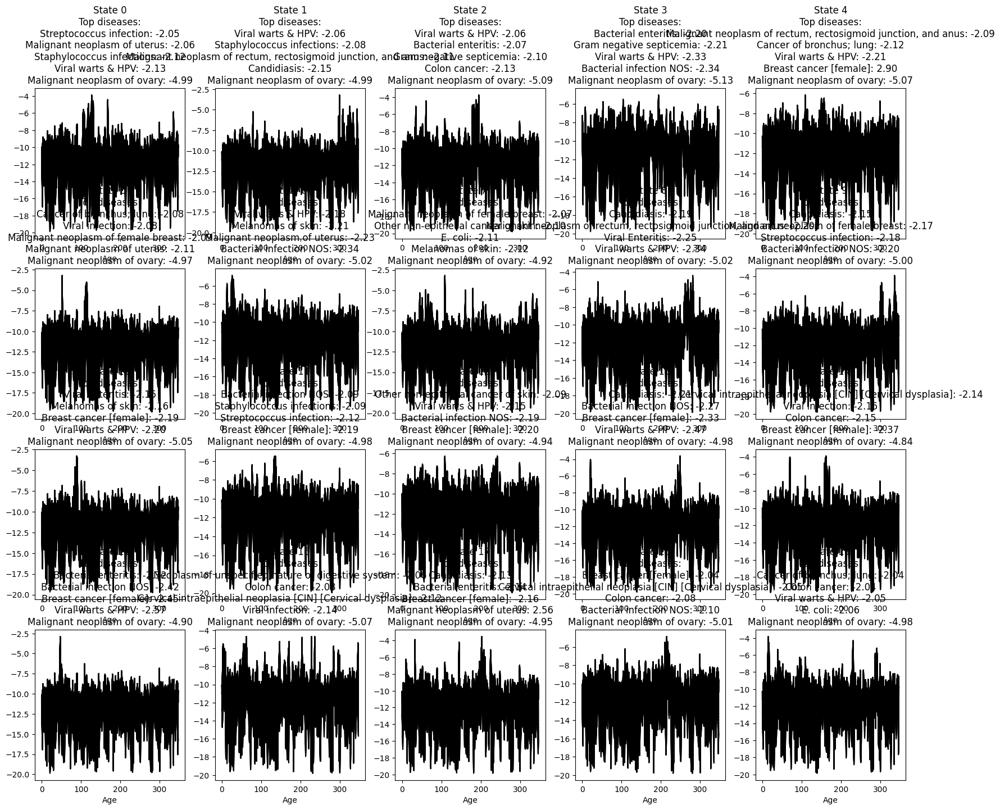

In [172]:
def plot_state_trajectories_with_diseases(phi, psi, disease_names, n_top_diseases=3):
    """
    Plot state trajectories (phi) with annotations of top associated diseases
    """
    fig, axes = plt.subplots(4, 5, figsize=(20, 16))
    axes = axes.ravel()
    
    for state in range(phi.shape[0]):
        # Plot state trajectory
        axes[state].plot(phi[state, :], 'k-', label=f'State {state}')
        
        # Get top associated diseases
        top_diseases = np.argsort(np.abs(psi[:, state]))[-n_top_diseases:]
        disease_str = '\n'.join([f"{disease_names[d]}: {psi[d, state]:.2f}" 
                               for d in top_diseases])
        
        axes[state].set_title(f'State {state}\nTop diseases:\n{disease_str}')
        axes[state].set_xlabel('Age')



plot_state_trajectories_with_diseases(phi=ukb_checkpoint['model_state_dict']['phi'],psi=ukb_checkpoint['model_state_dict']['psi'],disease_names=ukb_checkpoint['disease_names'],n_top_diseases=5)

In [180]:
def calculate_clustering_kappa_key_diseases(mgb_checkpoint, aou_checkpoint, ukb_checkpoint, disease_names):
    """
    Calculate Cohen's Kappa for well-recognized disease groups across biobanks
    """
    # Define key disease groups we trust across biobanks
    key_diseases = {
        'ASCVD': ['Myocardial infarction', 'Coronary atherosclerosis', 
                  'Unstable angina', 'Angina pectoris'],
        'Diabetes': ['Type 2 diabetes'],
        'Major_Cancers': ['Breast cancer', 'Lung cancer', 'Colon cancer',
                         'Prostate cancer'],
        'Heart_Failure': ['Congestive heart failure', 'Heart failure'],
        'Stroke': ['Cerebral artery occlusion', 'Cerebral ischemia']
    }
    
    # Get indices for these diseases
    disease_indices = []
    for group in key_diseases.values():
        for disease in group:
            try:
                idx = disease_names.index(disease)
                disease_indices.append(idx)
            except ValueError:
                continue
    
    def get_clustering_matrix(diseases, clusters):
        matrix = np.zeros((len(diseases), len(diseases)))
        for i, d1 in enumerate(diseases):
            for j, d2 in enumerate(diseases):
                if clusters[d1] == clusters[d2]:
                    matrix[i,j] = 1
        return matrix
    
    # Get clustering matrices only for key diseases
    mgb_matrix = get_clustering_matrix(disease_indices, mgb_checkpoint['clusters'])
    aou_matrix = get_clustering_matrix(disease_indices, aou_checkpoint['clusters'])
    ukb_matrix = get_clustering_matrix(disease_indices, ukb_checkpoint['clusters'])
    
    # Modified get_flat_pairs function to use matrix size
    def get_flat_pairs(matrix):
        n = matrix.shape[0]
        mask = ~np.eye(n, dtype=bool)
        return matrix[mask]
    
    kappa_mgb_aou = cohen_kappa_score(
        get_flat_pairs(mgb_matrix),
        get_flat_pairs(aou_matrix)
    )
    
    kappa_mgb_ukb = cohen_kappa_score(
        get_flat_pairs(mgb_matrix),
        get_flat_pairs(ukb_matrix)
    )
    
    kappa_aou_ukb = cohen_kappa_score(
        get_flat_pairs(aou_matrix),
        get_flat_pairs(ukb_matrix)
    )
    
    # Calculate kappa by disease group
    group_kappas = {}
    for group_name, group_diseases in key_diseases.items():
        group_indices = [i for i, d in enumerate(disease_indices) 
                        if disease_names[d] in group_diseases]
        if len(group_indices) > 1:  # Need at least 2 diseases for kappa
            group_mgb = mgb_matrix[group_indices][:, group_indices]
            group_aou = aou_matrix[group_indices][:, group_indices]
            group_ukb = ukb_matrix[group_indices][:, group_indices]
            
            group_kappas[group_name] = {
                'MGB-AoU': cohen_kappa_score(
                    get_flat_pairs(group_mgb),
                    get_flat_pairs(group_aou)
                ),
                'MGB-UKB': cohen_kappa_score(
                    get_flat_pairs(group_mgb),
                    get_flat_pairs(group_ukb)
                ),
                'AoU-UKB': cohen_kappa_score(
                    get_flat_pairs(group_aou),
                    get_flat_pairs(group_ukb)
                )
            }
    
    return {
        'Overall': {
            'MGB-AoU': kappa_mgb_aou,
            'MGB-UKB': kappa_mgb_ukb,
            'AoU-UKB': kappa_aou_ukb,
            'Average': np.mean([kappa_mgb_aou, kappa_mgb_ukb, kappa_aou_ukb])
        },
        'By_Group': group_kappas
    }

In [181]:
calculate_clustering_kappa_key_diseases(mgb_checkpoint=mgb_checkpoint,aou_checkpoint=aou_checkpoint,ukb_checkpoint=ukb_checkpoint,disease_names=disease_names_all)

/opt/miniconda3/envs/new_env_pyro2/lib/python3.9/site-packages/sklearn/metrics/_classification.py:407: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/opt/miniconda3/envs/new_env_pyro2/lib/python3.9/site-packages/sklearn/metrics/_classification.py:758: RuntimeWarning: invalid value encountered in scalar divide
  k = np.sum(w_mat * confusion) / np.sum(w_mat * expected)


{'Overall': {'MGB-AoU': np.float64(0.4444444444444444),
  'MGB-UKB': np.float64(0.4444444444444444),
  'AoU-UKB': np.float64(1.0),
  'Average': np.float64(0.6296296296296297)},
 'By_Group': {'ASCVD': {'MGB-AoU': np.float64(0.0),
   'MGB-UKB': np.float64(0.0),
   'AoU-UKB': np.float64(nan)}}}

In [ ]:
def compare_with_pce(model, pce_df, ascvd_indices=[111,112,113,114,115,116]):
    """
    Compare 10-year predictions using single timepoint prediction, handling missing PCE values
    """
    our_10yr_risks = []
    actual_10yr = []

    # Get predictions
    pi = model.forward()[0].detach().numpy()
    
    # Get mean risks across patients for calibration
    predicted_risk_2d = pi.mean(axis=0)  # Shape: [D, T]
    observed_risk_2d = model.Y.numpy().mean(axis=0)  # Shape: [D, T]
    
    # Sort and get LOESS calibration curve
    pred_flat = predicted_risk_2d.flatten()
    obs_flat = observed_risk_2d.flatten()
    sort_idx = np.argsort(pred_flat)
    smoothed = lowess(obs_flat[sort_idx], pred_flat[sort_idx], frac=0.3)
    
    # Apply calibration to all predictions using interpolation
    pi_calibrated = np.interp(pi.flatten(), smoothed[:, 0], smoothed[:, 1]).reshape(pi.shape)
    
    # Calculate 10-year risks using only enrollment time prediction
    for patient_idx, row in enumerate(pce_df.itertuples()):
        enroll_time = int(row.age - 30)
        if enroll_time + 10 >= model.T:
            continue
            
        # Only use predictions at enrollment time
        pi_ascvd = pi_calibrated[patient_idx, ascvd_indices, enroll_time]
        
        # Calculate 1-year risk first
        yearly_risk = 1 - np.prod(1 - pi_ascvd)
        
        # Convert to 10-year risk
        risk = 1 - (1 - yearly_risk)**10
        our_10yr_risks.append(risk)
        
        # Still look at actual events over 10 years
        Y_ascvd = model.Y[patient_idx, ascvd_indices, enroll_time:enroll_time+10]
        actual = torch.any(torch.any(Y_ascvd, dim=0))
        actual_10yr.append(actual.item())
   
    our_10yr_risks = np.array(our_10yr_risks)
    actual_10yr = np.array(actual_10yr)
    pce_risks = pce_df['pce_goff'].values[:len(our_10yr_risks)]

    # Get indices of non-missing PCE values
    non_missing_idx = ~np.isnan(pce_risks)

    # Filter all arrays to only include non-missing cases
    our_10yr_risks_filtered = our_10yr_risks[non_missing_idx]
    actual_10yr_filtered = actual_10yr[non_missing_idx]
    pce_risks_filtered = pce_risks[non_missing_idx]

    # Calculate ROC AUCs on filtered data
    our_auc = roc_auc_score(actual_10yr_filtered, our_10yr_risks_filtered)
    pce_auc = roc_auc_score(actual_10yr_filtered, pce_risks_filtered)

    # Print results with sample size info
    n_total = len(our_10yr_risks)
    n_complete = len(our_10yr_risks_filtered)
    print(f"\nROC AUC Comparison (10-year prediction from enrollment):")
    print(f"Sample size: {n_complete}/{n_total} ({n_complete/n_total*100:.1f}% complete cases)")
    print(f"Our model: {our_auc:.3f}")
    print(f"PCE: {pce_auc:.3f}")
    
    plt.figure(figsize=(8,6))
    plot_roc_curve(actual_10yr_filtered, our_10yr_risks_filtered, label=f'Our Model (AUC={our_auc:.3f})')
    plot_roc_curve(actual_10yr_filtered, pce_risks_filtered, label=f'PCE (AUC={pce_auc:.3f})')
    plt.plot([0,1], [0,1], 'k--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curves for 10-year ASCVD Prediction')
    plt.legend()
    plt.grid(True)
    plt.show()

    return our_10yr_risks_filtered, actual_10yr_filtered, pce_risks_filtered

Number of diseases in each biobank:
MGB: 346 diseases
AoU: 348 diseases
UKB: 348 diseases

Number of diseases common to all biobanks: 346


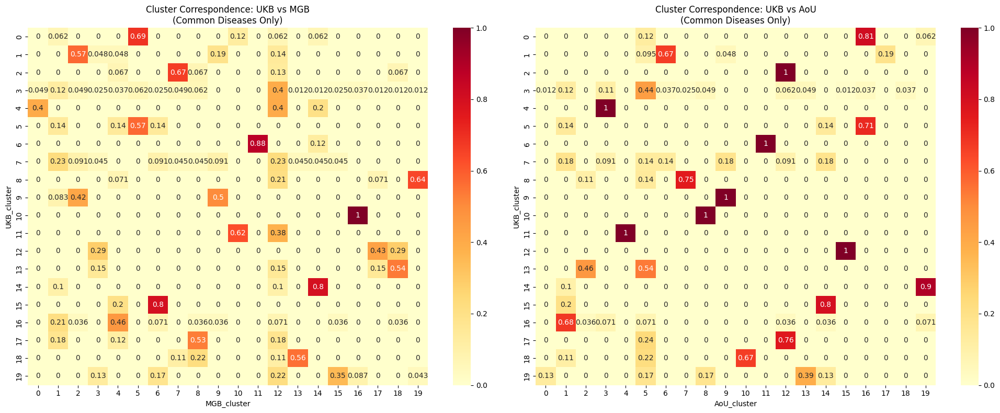


Cluster Correspondence Summary (for common diseases):

UKB Cluster 8 (28 diseases):
Example diseases: Noninflammatory disorders of cervix, Disorders of menstruation and other abnormal bleeding from female genital tract, Pain and other symptoms associated with female genital organs
Most common corresponding clusters:
  MGB: Cluster 19
  AoU: Cluster 7

UKB Cluster 17 (17 diseases):
Example diseases: Anal and rectal conditions, Malignant neoplasm of rectum, rectosigmoid junction, and anus, Other intestinal obstruction
Most common corresponding clusters:
  MGB: Cluster 8
  AoU: Cluster 12

UKB Cluster 3 (81 diseases):
Example diseases: Viral infection, Malignant neoplasm of kidney, except pelvis, Stricture of artery
Most common corresponding clusters:
  MGB: Cluster 12
  AoU: Cluster 5

UKB Cluster 10 (11 diseases):
Example diseases: Cataract, Myopia, Other retinal disorders
Most common corresponding clusters:
  MGB: Cluster 16
  AoU: Cluster 8

UKB Cluster 2 (15 diseases):
Example disea

In [46]:
def analyze_cluster_correspondence_different_lengths(mgb_checkpoint, aou_checkpoint, ukb_checkpoint, disease_names_all):
    """
    Analyze cluster correspondence handling different disease sets in each biobank
    """
    import pandas as pd
    import numpy as np
    import seaborn as sns
    import matplotlib.pyplot as plt
    
    # Create dataframes for each biobank with their diseases
    mgb_df = pd.DataFrame({
        'Disease': disease_names_all[:len(mgb_checkpoint['clusters'])],
        'MGB_cluster': mgb_checkpoint['clusters']
    })
    
    aou_df = pd.DataFrame({
        'Disease': disease_names_all[:len(aou_checkpoint['clusters'])],
        'AoU_cluster': aou_checkpoint['clusters']
    })
    
    ukb_df = pd.DataFrame({
        'Disease': disease_names_all[:len(ukb_checkpoint['clusters'])],
        'UKB_cluster': ukb_checkpoint['clusters']
    })
    
    # Print initial counts
    print("Number of diseases in each biobank:")
    print(f"MGB: {len(mgb_df)} diseases")
    print(f"AoU: {len(aou_df)} diseases")
    print(f"UKB: {len(ukb_df)} diseases")
    
    # Find common diseases
    common_diseases = set(mgb_df['Disease']) & set(aou_df['Disease']) & set(ukb_df['Disease'])
    print(f"\nNumber of diseases common to all biobanks: {len(common_diseases)}")
    
    # Create merged dataframe for common diseases only
    df_common = pd.DataFrame({
        'Disease': list(common_diseases)
    })
    
    # Add cluster assignments for common diseases
    df_common = df_common.merge(mgb_df, on='Disease', how='left')\
                        .merge(aou_df, on='Disease', how='left')\
                        .merge(ukb_df, on='Disease', how='left')
    
    # Analyze cluster correspondence for common diseases
    correspondence = []
    for ukb_c in df_common['UKB_cluster'].unique():
        diseases_in_cluster = df_common[df_common['UKB_cluster'] == ukb_c]['Disease']
        
        if len(diseases_in_cluster) > 0:
            mgb_common = df_common[df_common['UKB_cluster'] == ukb_c]['MGB_cluster'].mode().iloc[0]
            aou_common = df_common[df_common['UKB_cluster'] == ukb_c]['AoU_cluster'].mode().iloc[0]
            
            correspondence.append({
                'UKB_cluster': ukb_c,
                'MGB_cluster': mgb_common,
                'AoU_cluster': aou_common,
                'n_diseases': len(diseases_in_cluster),
                'example_diseases': ', '.join(diseases_in_cluster.head(3))
            })
    
    # Create visualization
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
    
    # 1. Cluster correspondence heatmap
    cross_tab_mgb = pd.crosstab(df_common['UKB_cluster'], 
                               df_common['MGB_cluster'], 
                               normalize='index')
    sns.heatmap(cross_tab_mgb, ax=ax1, cmap='YlOrRd', annot=True)
    ax1.set_title('Cluster Correspondence: UKB vs MGB\n(Common Diseases Only)')
    
    # 2. Cluster correspondence heatmap for AoU
    cross_tab_aou = pd.crosstab(df_common['UKB_cluster'], 
                               df_common['AoU_cluster'], 
                               normalize='index')
    sns.heatmap(cross_tab_aou, ax=ax2, cmap='YlOrRd', annot=True)
    ax2.set_title('Cluster Correspondence: UKB vs AoU\n(Common Diseases Only)')
    
    plt.tight_layout()
    plt.show()
    
    # Print detailed correspondence
    print("\nCluster Correspondence Summary (for common diseases):")
    for c in correspondence:
        print(f"\nUKB Cluster {c['UKB_cluster']} ({c['n_diseases']} diseases):")
        print(f"Example diseases: {c['example_diseases']}")
        print(f"Most common corresponding clusters:")
        print(f"  MGB: Cluster {c['MGB_cluster']}")
        print(f"  AoU: Cluster {c['AoU_cluster']}")
    
    return df_common, correspondence

# Run the analysis
disease_names_all = essentials['disease_names']
df_common, correspondence = analyze_cluster_correspondence_different_lengths(
    mgb_checkpoint, aou_checkpoint, ukb_checkpoint, disease_names_all
)

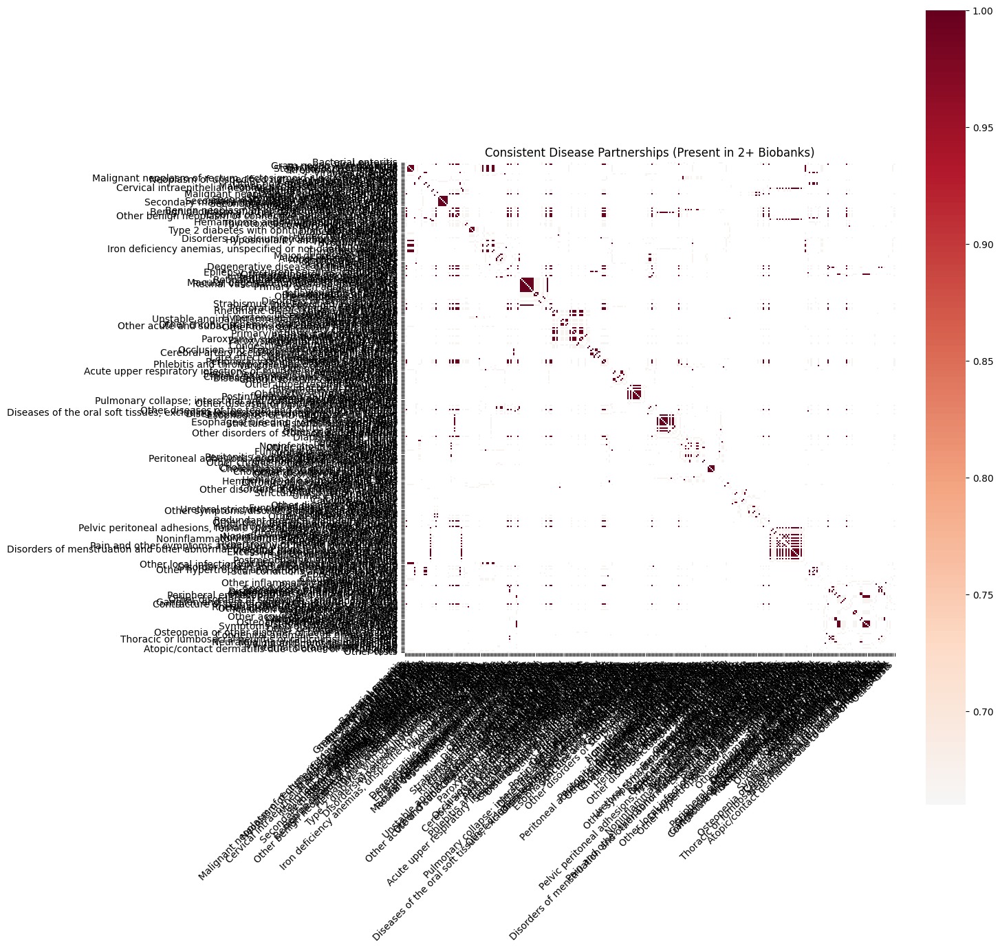


Most consistent disease partnerships (present in all 3 biobanks):
Gram negative septicemia <-> Staphylococcus infections
Gram negative septicemia <-> Streptococcus infection
Gram negative septicemia <-> Hyposmolality and/or hyponatremia
Gram negative septicemia <-> Hypovolemia
Gram negative septicemia <-> Other anemias
Gram negative septicemia <-> Thrombocytopenia
Bacterial infection NOS <-> Gram negative septicemia
Bacterial infection NOS <-> Staphylococcus infections
Bacterial infection NOS <-> Streptococcus infection
Bacterial infection NOS <-> E. coli
Bacterial infection NOS <-> Hyposmolality and/or hyponatremia
Bacterial infection NOS <-> Hypovolemia
Bacterial infection NOS <-> Other anemias
Bacterial infection NOS <-> Thrombocytopenia
Bacterial infection NOS <-> Cellulitis and abscess of arm/hand
Staphylococcus infections <-> Streptococcus infection
Staphylococcus infections <-> Thrombocytopenia
Streptococcus infection <-> Thrombocytopenia
E. coli <-> Gram negative septicemia
E.

In [50]:
def plot_consistent_disease_partnerships(mgb_checkpoint, aou_checkpoint, ukb_checkpoint, disease_names_all):
    """
    Create a heatmap showing only highly consistent disease partnerships (present in 2+ biobanks)
    """
    def get_cluster_partners(disease, diseases, clusters):
        if disease in diseases:
            disease_idx = diseases.index(disease)
            disease_cluster = clusters[disease_idx]
            return set([diseases[i] for i in range(len(diseases)) 
                      if clusters[i] == disease_cluster and diseases[i] != disease])
        return set()

    # Get diseases and their partners in each biobank
    disease_partnerships = {}
    for disease in disease_names_all:
        mgb_partners = get_cluster_partners(disease, 
                                         disease_names_all[:len(mgb_checkpoint['clusters'])],
                                         mgb_checkpoint['clusters'])
        aou_partners = get_cluster_partners(disease, 
                                         disease_names_all[:len(aou_checkpoint['clusters'])],
                                         aou_checkpoint['clusters'])
        ukb_partners = get_cluster_partners(disease, 
                                         disease_names_all[:len(ukb_checkpoint['clusters'])],
                                         ukb_checkpoint['clusters'])
        
        # Count in how many biobanks each partnership appears
        all_partners = mgb_partners | aou_partners | ukb_partners
        partnership_counts = {}
        for partner in all_partners:
            count = 0
            if partner in mgb_partners: count += 1
            if partner in aou_partners: count += 1
            if partner in ukb_partners: count += 1
            if count >= 2:  # Only keep partnerships present in at least 2 biobanks
                partnership_counts[partner] = count/3
        
        if partnership_counts:  # Only keep diseases with consistent partners
            disease_partnerships[disease] = partnership_counts

    # Create matrix for consistent partnerships
    consistent_diseases = list(disease_partnerships.keys())
    n_diseases = len(consistent_diseases)
    partnership_matrix = np.zeros((n_diseases, n_diseases))
    
    for i, d1 in enumerate(consistent_diseases):
        for j, d2 in enumerate(consistent_diseases):
            if d2 in disease_partnerships[d1]:
                partnership_matrix[i,j] = disease_partnerships[d1][d2]
            if d1 in disease_partnerships[d2]:
                partnership_matrix[i,j] = max(partnership_matrix[i,j], 
                                           disease_partnerships[d2][d1])

    # Plot heatmap
    plt.figure(figsize=(15, 15))
    mask = partnership_matrix == 0  # Mask cells with no consistent partnership
    
    sns.heatmap(partnership_matrix,
                xticklabels=consistent_diseases,
                yticklabels=consistent_diseases,
                cmap='RdBu_r',
                mask=mask,
                center=0.66,  # Center color scale at 2/3 (present in 2 biobanks)
                vmin=0.66,    # Only show partnerships present in 2+ biobanks
                vmax=1.0,
                square=True)
    
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)
    plt.title('Consistent Disease Partnerships (Present in 2+ Biobanks)')
    plt.tight_layout()
    plt.show()

    # Print summary of most consistent partnerships
    print("\nMost consistent disease partnerships (present in all 3 biobanks):")
    for d1 in consistent_diseases:
        for d2 in consistent_diseases:
            if partnership_matrix[consistent_diseases.index(d1), 
                                consistent_diseases.index(d2)] == 1.0:
                if d1 < d2:  # Avoid printing both (d1,d2) and (d2,d1)
                    print(f"{d1} <-> {d2}")

# Run the visualization
plot_consistent_disease_partnerships(
    mgb_checkpoint, aou_checkpoint, ukb_checkpoint, disease_names_all
)

In [87]:
aou_checkpoint['clusters'][111:116]

array([16, 16, 16, 16, 16], dtype=int32)

In [86]:
mgb_checkpoint['clusters'][111:116]

array([5, 5, 1, 5, 5], dtype=int32)

In [88]:
ukb_checkpoint['clusters'][111:116]

array([5, 5, 5, 5, 5], dtype=int32)

In [92]:
ukb_checkpoint['clusters'][24:30]

array([6, 6, 6, 6, 6, 6], dtype=int32)

In [93]:
aou_checkpoint['clusters'][24:30]

array([11, 11, 11, 11, 11, 11], dtype=int32)

In [94]:
mgb_checkpoint['clusters'][24:30]

array([11, 11, 11, 11, 11, 11], dtype=int32)

In [51]:
def show_consistent_disease_blocks(mgb_checkpoint, aou_checkpoint, ukb_checkpoint, disease_names_all):
    """
    Show only the diagonal blocks of consistently shared diseases across biobanks
    """
    # First identify key disease groups that cluster together in 2+ biobanks
    def get_cluster_members(disease, diseases, clusters):
        if disease in diseases:
            disease_idx = diseases.index(disease)
            disease_cluster = clusters[disease_idx]
            return set([diseases[i] for i in range(len(diseases)) 
                      if clusters[i] == disease_cluster])
        return set()
    
    # For each disease, find consistent cluster partners
    consistent_groups = []
    processed_diseases = set()
    
    for disease in disease_names_all:
        if disease in processed_diseases:
            continue
            
        mgb_members = get_cluster_members(disease, 
                                        disease_names_all[:len(mgb_checkpoint['clusters'])],
                                        mgb_checkpoint['clusters'])
        aou_members = get_cluster_members(disease, 
                                        disease_names_all[:len(aou_checkpoint['clusters'])],
                                        aou_checkpoint['clusters'])
        ukb_members = get_cluster_members(disease, 
                                        disease_names_all[:len(ukb_checkpoint['clusters'])],
                                        ukb_checkpoint['clusters'])
        
        # Find diseases that cluster together in at least 2 biobanks
        shared_members = set()
        for member in (mgb_members | aou_members | ukb_members):
            count = sum([member in mgb_members, 
                        member in aou_members, 
                        member in ukb_members])
            if count >= 2:
                shared_members.add(member)
        
        if len(shared_members) > 1:  # Only keep groups with at least 2 diseases
            consistent_groups.append(shared_members)
            processed_diseases.update(shared_members)
    
    # Print the consistent disease groups
    print("Disease groups that consistently cluster together (present in 2+ biobanks):\n")
    for i, group in enumerate(consistent_groups, 1):
        # Count biobank presence for this group
        mgb_count = sum(1 for d in group if d in disease_names_all[:len(mgb_checkpoint['clusters'])])
        aou_count = sum(1 for d in group if d in disease_names_all[:len(aou_checkpoint['clusters'])])
        ukb_count = sum(1 for d in group if d in disease_names_all[:len(ukb_checkpoint['clusters'])])
        
        print(f"Group {i} (Present in {sum([mgb_count>0, aou_count>0, ukb_count>0])} biobanks):")
        print(f"Diseases ({len(group)}):")
        for disease in sorted(group):
            # Show which biobanks this disease appears in
            banks = []
            if disease in disease_names_all[:len(mgb_checkpoint['clusters'])]: banks.append('MGB')
            if disease in disease_names_all[:len(aou_checkpoint['clusters'])]: banks.append('AoU')
            if disease in disease_names_all[:len(ukb_checkpoint['clusters'])]: banks.append('UKB')
            print(f"  - {disease} ({', '.join(banks)})")
        print()

# Run the analysis
show_consistent_disease_blocks(
    mgb_checkpoint, aou_checkpoint, ukb_checkpoint, disease_names_all
)

Disease groups that consistently cluster together (present in 2+ biobanks):

Group 1 (Present in 3 biobanks):
Diseases (40):
  - Acute gastritis (MGB, AoU, UKB)
  - Bacterial enteritis (MGB, AoU, UKB)
  - Benign neoplasm of breast (MGB, AoU, UKB)
  - Benign neoplasm of lip, oral cavity, and pharynx (MGB, AoU, UKB)
  - Blood in stool (MGB, AoU, UKB)
  - Carbuncle and furuncle (MGB, AoU, UKB)
  - Chronic periodontitis (MGB, AoU, UKB)
  - Contracture of palmar fascia [Dupuytren's disease] (MGB, AoU, UKB)
  - Duodenal ulcer (MGB, AoU, UKB)
  - Epilepsy, recurrent seizures, convulsions (MGB, AoU, UKB)
  - Facial nerve disorders [CN7] (MGB, AoU, UKB)
  - Functional digestive disorders (MGB, AoU, UKB)
  - Hearing loss (MGB, AoU, UKB)
  - Hematemesis (MGB, AoU, UKB)
  - Hemorrhage of rectum and anus (MGB, AoU, UKB)
  - Hypertrophy of breast (Gynecomastia) (MGB, AoU, UKB)
  - Inguinal hernia (MGB, AoU, UKB)
  - Lipoma (MGB, AoU, UKB)
  - Lipoma of skin and subcutaneous tissue (MGB, AoU, UKB)
  

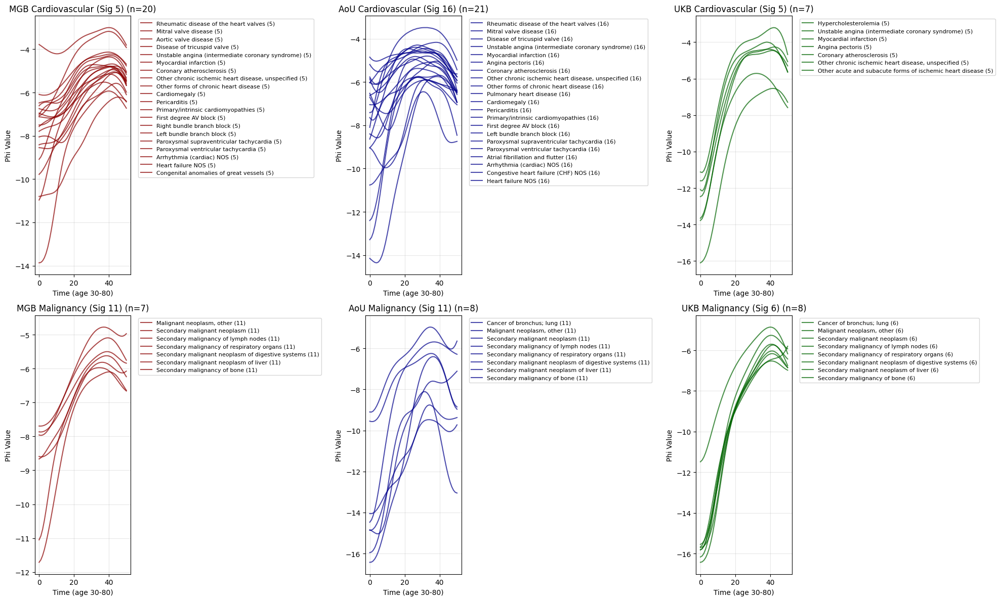


Summary of diseases in each signature:

Cardiovascular signature:
MGB (Sig 5): 20 diseases
Diseases:
- Rheumatic disease of the heart valves
- Mitral valve disease
- Aortic valve disease
- Disease of tricuspid valve
- Unstable angina (intermediate coronary syndrome)
- Myocardial infarction
- Coronary atherosclerosis
- Other chronic ischemic heart disease, unspecified
- Other forms of chronic heart disease
- Cardiomegaly
- Pericarditis
- Primary/intrinsic cardiomyopathies
- First degree AV block
- Right bundle branch block
- Left bundle branch block
- Paroxysmal supraventricular tachycardia
- Paroxysmal ventricular tachycardia
- Arrhythmia (cardiac) NOS
- Heart failure NOS
- Congenital anomalies of great vessels

AoU (Sig 16): 21 diseases
Diseases:
- Rheumatic disease of the heart valves
- Mitral valve disease
- Disease of tricuspid valve
- Unstable angina (intermediate coronary syndrome)
- Myocardial infarction
- Angina pectoris
- Coronary atherosclerosis
- Other chronic ischemic hear

In [106]:
def plot_signature_patterns_by_clusters(mgb_checkpoint, aou_checkpoint, ukb_checkpoint, 
                                      mgb_diseases, aou_diseases, ukb_diseases):
    """
    Plot temporal patterns for all diseases in cardiovascular and malignancy signatures for each biobank
    """
    # Define signature mappings for each biobank
    cv_signatures = {
        'mgb': 5,
        'aou': 16,
        'ukb': 5
    }
    
    malig_signatures = {
        'mgb': 11,
        'aou': 11,
        'ukb': 6
    }
    
    # Get clusters from checkpoints
    mgb_clusters = mgb_checkpoint['clusters']
    aou_clusters = aou_checkpoint['clusters']
    ukb_clusters = ukb_checkpoint['clusters']
    
    # Find all diseases in each signature for each biobank
    def get_signature_diseases(diseases, clusters, sig_num):
        return [{'name': name, 'idx': i} 
                for i, name in enumerate(diseases) 
                if clusters[i] == sig_num]
    
    # Get cardiovascular diseases for each biobank
    mgb_cv = get_signature_diseases(mgb_diseases, mgb_clusters, 5)
    aou_cv = get_signature_diseases(aou_diseases, aou_clusters, 16)
    ukb_cv = get_signature_diseases(ukb_diseases, ukb_clusters, 5)
    
    # Get malignancy diseases for each biobank
    mgb_malig = get_signature_diseases(mgb_diseases, mgb_clusters, 11)
    aou_malig = get_signature_diseases(aou_diseases, aou_clusters, 11)
    ukb_malig = get_signature_diseases(ukb_diseases, ukb_clusters, 6)
    
    # Create figure with 2 rows and 3 columns
    fig, ((ax1_mgb, ax1_aou, ax1_ukb), 
          (ax2_mgb, ax2_aou, ax2_ukb)) = plt.subplots(2, 3, figsize=(20, 12))
    
    # Helper function to plot patterns for one biobank
    def plot_biobank_patterns(diseases, signature_num, checkpoint, ax, title, color='blue'):
        for disease in diseases:
            pattern = checkpoint['model_state_dict']['phi'][signature_num, disease['idx'], :51]
            ax.plot(pattern, color=color, alpha=0.7,
                   label=f"{disease['name']} ({signature_num})")
        
        ax.set_xlabel('Time (age 30-80)')
        ax.set_ylabel('Phi Value')
        ax.set_title(f"{title} (n={len(diseases)})")
        ax.grid(True, alpha=0.3)
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
    
    # Plot cardiovascular patterns for each biobank
    plot_biobank_patterns(mgb_cv, cv_signatures['mgb'], mgb_checkpoint,
                         ax1_mgb, 'MGB Cardiovascular (Sig 5)', 'darkred')
    plot_biobank_patterns(aou_cv, cv_signatures['aou'], aou_checkpoint,
                         ax1_aou, 'AoU Cardiovascular (Sig 16)', 'darkblue')
    plot_biobank_patterns(ukb_cv, cv_signatures['ukb'], ukb_checkpoint,
                         ax1_ukb, 'UKB Cardiovascular (Sig 5)', 'darkgreen')
    
    # Plot malignancy patterns for each biobank
    plot_biobank_patterns(mgb_malig, malig_signatures['mgb'], mgb_checkpoint,
                         ax2_mgb, 'MGB Malignancy (Sig 11)', 'darkred')
    plot_biobank_patterns(aou_malig, malig_signatures['aou'], aou_checkpoint,
                         ax2_aou, 'AoU Malignancy (Sig 11)', 'darkblue')
    plot_biobank_patterns(ukb_malig, malig_signatures['ukb'], ukb_checkpoint,
                         ax2_ukb, 'UKB Malignancy (Sig 6)', 'darkgreen')
    
    plt.tight_layout()
    plt.show()

    # Print summary statistics
    print("\nSummary of diseases in each signature:")
    print(f"\nCardiovascular signature:")
    print(f"MGB (Sig 5): {len(mgb_cv)} diseases")
    print("Diseases:")
    for disease in mgb_cv:
        print(f"- {disease['name']}")
    
    print(f"\nAoU (Sig 16): {len(aou_cv)} diseases")
    print("Diseases:")
    for disease in aou_cv:
        print(f"- {disease['name']}")
    
    print(f"\nUKB (Sig 5): {len(ukb_cv)} diseases")
    print("Diseases:")
    for disease in ukb_cv:
        print(f"- {disease['name']}")
    
    print(f"\nMalignancy signature:")
    print(f"MGB (Sig 11): {len(mgb_malig)} diseases")
    print("Diseases:")
    for disease in mgb_malig:
        print(f"- {disease['name']}")
    
    print(f"\nAoU (Sig 11): {len(aou_malig)} diseases")
    print("Diseases:")
    for disease in aou_malig:
        print(f"- {disease['name']}")
    
    print(f"\nUKB (Sig 6): {len(ukb_malig)} diseases")
    print("Diseases:")
    for disease in ukb_malig:
        print(f"- {disease['name']}")

# Example usage:
plot_signature_patterns_by_clusters(mgb_checkpoint, aou_checkpoint, ukb_checkpoint,
                                 mgb_checkpoint['disease_names'], aou_checkpoint['disease_names'], ukb_checkpoint['disease_names'])

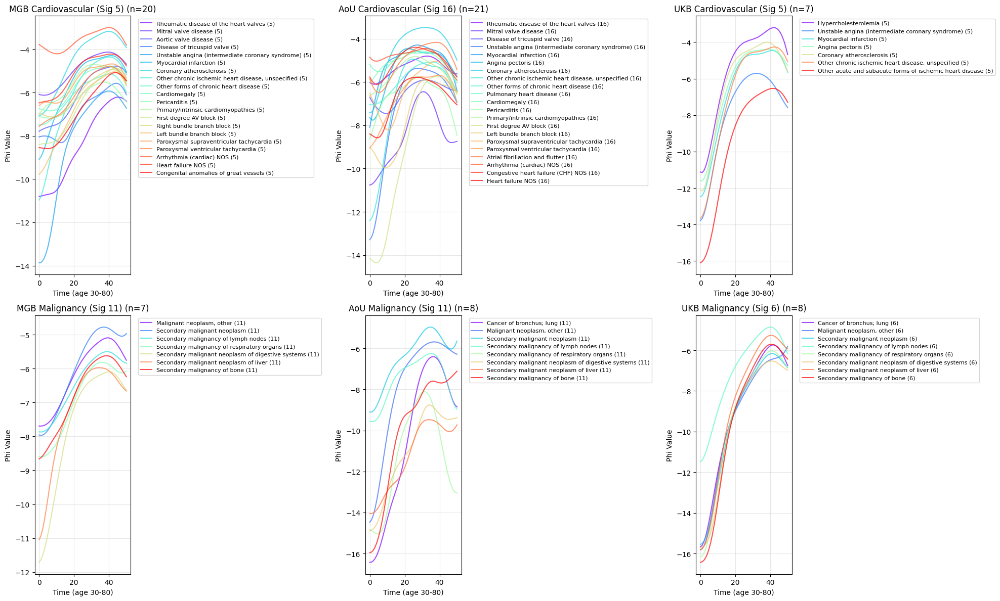


Summary of diseases in each signature:

Cardiovascular signature:
MGB (Sig 5): 20 diseases
Diseases:
- Rheumatic disease of the heart valves
- Mitral valve disease
- Aortic valve disease
- Disease of tricuspid valve
- Unstable angina (intermediate coronary syndrome)
- Myocardial infarction
- Coronary atherosclerosis
- Other chronic ischemic heart disease, unspecified
- Other forms of chronic heart disease
- Cardiomegaly
- Pericarditis
- Primary/intrinsic cardiomyopathies
- First degree AV block
- Right bundle branch block
- Left bundle branch block
- Paroxysmal supraventricular tachycardia
- Paroxysmal ventricular tachycardia
- Arrhythmia (cardiac) NOS
- Heart failure NOS
- Congenital anomalies of great vessels

AoU (Sig 16): 21 diseases
Diseases:
- Rheumatic disease of the heart valves
- Mitral valve disease
- Disease of tricuspid valve
- Unstable angina (intermediate coronary syndrome)
- Myocardial infarction
- Angina pectoris
- Coronary atherosclerosis
- Other chronic ischemic hear

In [108]:
def plot_signature_patterns_by_clusters(mgb_checkpoint, aou_checkpoint, ukb_checkpoint, 
                                      mgb_diseases, aou_diseases, ukb_diseases):
    """
    Plot temporal patterns for all diseases in cardiovascular and malignancy signatures for each biobank
    """
    # Define signature mappings for each biobank
    cv_signatures = {
        'mgb': 5,
        'aou': 16,
        'ukb': 5
    }
    
    malig_signatures = {
        'mgb': 11,
        'aou': 11,
        'ukb': 6
    }
    
    # Get clusters from checkpoints
    mgb_clusters = mgb_checkpoint['clusters']
    aou_clusters = aou_checkpoint['clusters']
    ukb_clusters = ukb_checkpoint['clusters']
    
    # Find all diseases in each signature for each biobank
    def get_signature_diseases(diseases, clusters, sig_num):
        return [{'name': name, 'idx': i} 
                for i, name in enumerate(diseases) 
                if clusters[i] == sig_num]
    
    # Get cardiovascular diseases for each biobank
    mgb_cv = get_signature_diseases(mgb_diseases, mgb_clusters, 5)
    aou_cv = get_signature_diseases(aou_diseases, aou_clusters, 16)
    ukb_cv = get_signature_diseases(ukb_diseases, ukb_clusters, 5)
    
    # Get malignancy diseases for each biobank
    mgb_malig = get_signature_diseases(mgb_diseases, mgb_clusters, 11)
    aou_malig = get_signature_diseases(aou_diseases, aou_clusters, 11)
    ukb_malig = get_signature_diseases(ukb_diseases, ukb_clusters, 6)
    
    # Create figure with 2 rows and 3 columns
    fig, ((ax1_mgb, ax1_aou, ax1_ukb), 
          (ax2_mgb, ax2_aou, ax2_ukb)) = plt.subplots(2, 3, figsize=(20, 12))
    
    # Helper function to plot patterns for one biobank
    def plot_biobank_patterns(diseases, signature_num, checkpoint, ax, title):
        # Create color map with enough distinct colors
        n_colors = len(diseases)
        colors = plt.cm.rainbow(np.linspace(0, 1, n_colors))
        
        for i, disease in enumerate(diseases):
            pattern = checkpoint['model_state_dict']['phi'][signature_num, disease['idx'], :51]
            ax.plot(pattern, color=colors[i], alpha=0.7,
                   label=f"{disease['name']} ({signature_num})")
        
        ax.set_xlabel('Time (age 30-80)')
        ax.set_ylabel('Phi Value')
        ax.set_title(f"{title} (n={len(diseases)})")
        ax.grid(True, alpha=0.3)
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
    
    # Plot cardiovascular patterns for each biobank
    plot_biobank_patterns(mgb_cv, cv_signatures['mgb'], mgb_checkpoint,
                         ax1_mgb, 'MGB Cardiovascular (Sig 5)')
    plot_biobank_patterns(aou_cv, cv_signatures['aou'], aou_checkpoint,
                         ax1_aou, 'AoU Cardiovascular (Sig 16)')
    plot_biobank_patterns(ukb_cv, cv_signatures['ukb'], ukb_checkpoint,
                         ax1_ukb, 'UKB Cardiovascular (Sig 5)')
    
    # Plot malignancy patterns for each biobank
    plot_biobank_patterns(mgb_malig, malig_signatures['mgb'], mgb_checkpoint,
                         ax2_mgb, 'MGB Malignancy (Sig 11)')
    plot_biobank_patterns(aou_malig, malig_signatures['aou'], aou_checkpoint,
                         ax2_aou, 'AoU Malignancy (Sig 11)')
    plot_biobank_patterns(ukb_malig, malig_signatures['ukb'], ukb_checkpoint,
                         ax2_ukb, 'UKB Malignancy (Sig 6)')
    
    plt.tight_layout()
    plt.show()

    # Print summary statistics
    print("\nSummary of diseases in each signature:")
    print(f"\nCardiovascular signature:")
    print(f"MGB (Sig 5): {len(mgb_cv)} diseases")
    print("Diseases:")
    for disease in mgb_cv:
        print(f"- {disease['name']}")
    
    print(f"\nAoU (Sig 16): {len(aou_cv)} diseases")
    print("Diseases:")
    for disease in aou_cv:
        print(f"- {disease['name']}")
    
    print(f"\nUKB (Sig 5): {len(ukb_cv)} diseases")
    print("Diseases:")
    for disease in ukb_cv:
        print(f"- {disease['name']}")
    
    print(f"\nMalignancy signature:")
    print(f"MGB (Sig 11): {len(mgb_malig)} diseases")
    print("Diseases:")
    for disease in mgb_malig:
        print(f"- {disease['name']}")
    
    print(f"\nAoU (Sig 11): {len(aou_malig)} diseases")
    print("Diseases:")
    for disease in aou_malig:
        print(f"- {disease['name']}")
    
    print(f"\nUKB (Sig 6): {len(ukb_malig)} diseases")
    print("Diseases:")
    for disease in ukb_malig:
        print(f"- {disease['name']}")

# Example usage:
plot_signature_patterns_by_clusters(mgb_checkpoint, aou_checkpoint, ukb_checkpoint,
                                  mgb_checkpoint['disease_names'], aou_checkpoint['disease_names'], ukb_checkpoint['disease_names'])

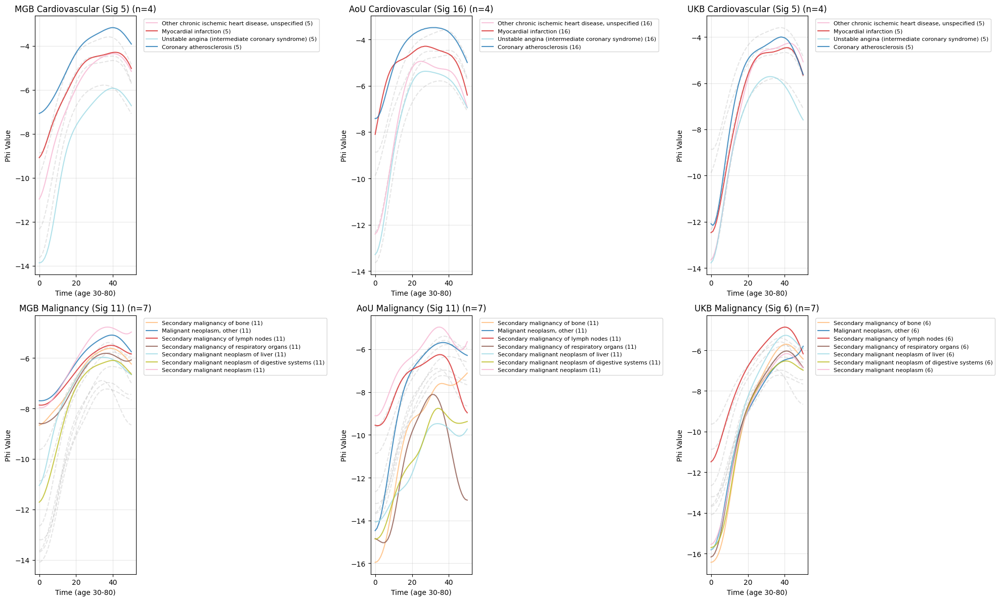


Summary of shared diseases across biobanks:

Cardiovascular signature (shared across MGB:5, AoU:16, UKB:5):
Number of shared diseases: 4
Diseases:
- Coronary atherosclerosis
- Myocardial infarction
- Other chronic ischemic heart disease, unspecified
- Unstable angina (intermediate coronary syndrome)

Malignancy signature (shared across MGB:11, AoU:11, UKB:6):
Number of shared diseases: 7
Diseases:
- Malignant neoplasm, other
- Secondary malignancy of bone
- Secondary malignancy of lymph nodes
- Secondary malignancy of respiratory organs
- Secondary malignant neoplasm
- Secondary malignant neoplasm of digestive systems
- Secondary malignant neoplasm of liver


In [109]:
def plot_signature_patterns_by_clusters(mgb_checkpoint, aou_checkpoint, ukb_checkpoint, 
                                      mgb_diseases, aou_diseases, ukb_diseases):
    """
    Plot temporal patterns for diseases that are shared across all biobanks in each signature group,
    using consistent colors for the same diseases and showing global averages
    """
    # Define signature mappings for each biobank
    cv_signatures = {
        'mgb': 5,
        'aou': 16,
        'ukb': 5
    }
    
    malig_signatures = {
        'mgb': 11,
        'aou': 11,
        'ukb': 6
    }
    
    # Get clusters from checkpoints
    mgb_clusters = mgb_checkpoint['clusters']
    aou_clusters = aou_checkpoint['clusters']
    ukb_clusters = ukb_checkpoint['clusters']
    
    # Find all diseases in each signature for each biobank
    def get_signature_diseases(diseases, clusters, sig_num):
        return {name: i for i, name in enumerate(diseases) 
                if clusters[i] == sig_num}
    
    # Get cardiovascular diseases for each biobank
    mgb_cv = get_signature_diseases(mgb_diseases, mgb_clusters, 5)
    aou_cv = get_signature_diseases(aou_diseases, aou_clusters, 16)
    ukb_cv = get_signature_diseases(ukb_diseases, ukb_clusters, 5)
    
    # Get malignancy diseases for each biobank
    mgb_malig = get_signature_diseases(mgb_diseases, mgb_clusters, 11)
    aou_malig = get_signature_diseases(aou_diseases, aou_clusters, 11)
    ukb_malig = get_signature_diseases(ukb_diseases, ukb_clusters, 6)
    
    # Find shared diseases across biobanks
    cv_shared = set(mgb_cv.keys()) & set(aou_cv.keys()) & set(ukb_cv.keys())
    malig_shared = set(mgb_malig.keys()) & set(aou_malig.keys()) & set(ukb_malig.keys())
    
    # Create figure with 2 rows and 3 columns
    fig, ((ax1_mgb, ax1_aou, ax1_ukb), 
          (ax2_mgb, ax2_aou, ax2_ukb)) = plt.subplots(2, 3, figsize=(20, 12))
    
    # Create consistent color mappings for shared diseases
    cv_colors = dict(zip(sorted(cv_shared), plt.cm.tab20(np.linspace(0, 1, len(cv_shared)))))
    malig_colors = dict(zip(sorted(malig_shared), plt.cm.tab20(np.linspace(0, 1, len(malig_shared)))))
    
    # Helper function to plot patterns for one biobank
    def plot_biobank_patterns(diseases_dict, shared_diseases, signature_num, checkpoint, 
                            ax, title, colors, other_checkpoints=None, other_sigs=None):
        # First plot average patterns in background
        if other_checkpoints and other_sigs:
            for disease in shared_diseases:
                patterns = []
                for cp, sig in zip(other_checkpoints, other_sigs):
                    idx = diseases_dict[disease]
                    pattern = cp['model_state_dict']['phi'][sig, idx, :51]
                    patterns.append(pattern)
                avg_pattern = np.mean(patterns, axis=0)
                ax.plot(avg_pattern, color='gray', alpha=0.2, linestyle='--')
        
        # Then plot this biobank's patterns
        for disease in shared_diseases:
            idx = diseases_dict[disease]
            pattern = checkpoint['model_state_dict']['phi'][signature_num, idx, :51]
            ax.plot(pattern, color=colors[disease], alpha=0.8,
                   label=f"{disease} ({signature_num})")
        
        ax.set_xlabel('Time (age 30-80)')
        ax.set_ylabel('Phi Value')
        ax.set_title(f"{title} (n={len(shared_diseases)})")
        ax.grid(True, alpha=0.3)
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=8)
    
    # Plot cardiovascular patterns for each biobank
    other_checkpoints = [mgb_checkpoint, aou_checkpoint, ukb_checkpoint]
    other_cv_sigs = [cv_signatures['mgb'], cv_signatures['aou'], cv_signatures['ukb']]
    
    plot_biobank_patterns(mgb_cv, cv_shared, cv_signatures['mgb'], mgb_checkpoint,
                         ax1_mgb, 'MGB Cardiovascular (Sig 5)', cv_colors,
                         other_checkpoints, other_cv_sigs)
    plot_biobank_patterns(aou_cv, cv_shared, cv_signatures['aou'], aou_checkpoint,
                         ax1_aou, 'AoU Cardiovascular (Sig 16)', cv_colors,
                         other_checkpoints, other_cv_sigs)
    plot_biobank_patterns(ukb_cv, cv_shared, cv_signatures['ukb'], ukb_checkpoint,
                         ax1_ukb, 'UKB Cardiovascular (Sig 5)', cv_colors,
                         other_checkpoints, other_cv_sigs)
    
    # Plot malignancy patterns for each biobank
    other_malig_sigs = [malig_signatures['mgb'], malig_signatures['aou'], malig_signatures['ukb']]
    
    plot_biobank_patterns(mgb_malig, malig_shared, malig_signatures['mgb'], mgb_checkpoint,
                         ax2_mgb, 'MGB Malignancy (Sig 11)', malig_colors,
                         other_checkpoints, other_malig_sigs)
    plot_biobank_patterns(aou_malig, malig_shared, malig_signatures['aou'], aou_checkpoint,
                         ax2_aou, 'AoU Malignancy (Sig 11)', malig_colors,
                         other_checkpoints, other_malig_sigs)
    plot_biobank_patterns(ukb_malig, malig_shared, malig_signatures['ukb'], ukb_checkpoint,
                         ax2_ukb, 'UKB Malignancy (Sig 6)', malig_colors,
                         other_checkpoints, other_malig_sigs)
    
    plt.tight_layout()
    plt.show()

    # Print summary statistics
    print("\nSummary of shared diseases across biobanks:")
    print(f"\nCardiovascular signature (shared across MGB:5, AoU:16, UKB:5):")
    print(f"Number of shared diseases: {len(cv_shared)}")
    print("Diseases:")
    for disease in sorted(cv_shared):
        print(f"- {disease}")
    
    print(f"\nMalignancy signature (shared across MGB:11, AoU:11, UKB:6):")
    print(f"Number of shared diseases: {len(malig_shared)}")
    print("Diseases:")
    for disease in sorted(malig_shared):
        print(f"- {disease}")

# Example usage:
plot_signature_patterns_by_clusters(mgb_checkpoint, aou_checkpoint, ukb_checkpoint,
                                  mgb_checkpoint['disease_names'], aou_checkpoint['disease_names'], ukb_checkpoint['disease_names'])

In [123]:
fh_processed=pd.read_csv('/Users/sarahurbut/Dropbox/baselinagefamh_firstten.csv')

In [137]:
from scipy import stats
import numpy as np
from sklearn.metrics import roc_auc_score
from sklearn.utils import resample

def calculate_auc_ci(y_true, y_pred, n_bootstraps=1000, confidence_level=0.95):
    """Calculate AUC with confidence intervals"""
    aucs = []
    for _ in range(n_bootstraps):
        indices = resample(range(len(y_true)))
        sample_y_true = y_true[indices]
        sample_y_pred = y_pred[indices]
        if len(np.unique(sample_y_true)) < 2:
            continue
        auc = roc_auc_score(sample_y_true, sample_y_pred)
        aucs.append(auc)
    
    mean_auc = np.mean(aucs)
    ci_lower = np.percentile(aucs, (1 - confidence_level) * 100 / 2)
    ci_upper = np.percentile(aucs, (1 + confidence_level) * 100 / 2)
    
    return mean_auc, (ci_lower, ci_upper)


In [313]:
def fit_fh_models(fh_processed, Y_full, pce_df, disease_names):
    """
    Fit logistic regression models using family history + sex


    """
    # Map between major_diseases groups and FH column names
    # Only including diseases that exist in both major_diseases and FH data

    
    major_diseases = {
    'ASCVD': ['Myocardial infarction', 'Coronary atherosclerosis', 'Other acute and subacute forms of ischemic heart disease', 
              'Unstable angina (intermediate coronary syndrome)', 'Angina pectoris', 'Other chronic ischemic heart disease, unspecified'],
    'Diabetes': ['Type 2 diabetes'],
    'Atrial_Fib': ['Atrial fibrillation and flutter'],
    'CKD': ['Chronic renal failure [CKD]', 'Chronic Kidney Disease, Stage III'],
    # Add to major_diseases dictionary:
    'All_Cancers': ['Colon cancer', 
                'Malignant neoplasm of rectum, rectosigmoid junction, and anus',
                'Cancer of bronchus; lung',
                'Breast cancer [female]',
                'Malignant neoplasm of female breast',
                'Cancer of prostate',
                'Malignant neoplasm of bladder',
                'Secondary malignant neoplasm',
                'Secondary malignancy of lymph nodes',
                'Secondary malignancy of respiratory organs',
                'Secondary malignant neoplasm of digestive systems',
                'Secondary malignant neoplasm of liver',
                'Secondary malignancy of bone'],
    'Stroke': ['Cerebral artery occlusion, with cerebral infarction', 'Cerebral ischemia'],
    'Heart_Failure': ['Congestive heart failure (CHF) NOS', 'Heart failure NOS'],
    'Pneumonia': ['Pneumonia', 'Bacterial pneumonia', 'Pneumococcal pneumonia'],
    'COPD': ['Chronic airway obstruction', 'Emphysema', 'Obstructive chronic bronchitis'],
    'Hip_Fracture': ['Hip fracture'],  # if this exact term exists in disease_names
    'Osteoporosis': ['Osteoporosis NOS'],
    'Anemia': ['Iron deficiency anemias, unspecified or not due to blood loss', 'Other anemias'],
    #'Alzheimer': ['Alzheimer disease and other dementias'],
    'Esophageal_Cancer': ['Cancer of esophagus'],  # adjust if different in disease_names
    'Colorectal_Cancer': ['Colon cancer', 'Malignant neoplasm of rectum, rectosigmoid junction, and anus'],
    'Breast_Cancer': ['Breast cancer [female]', 'Malignant neoplasm of female breast'],
    'Prostate_Cancer': ['Cancer of prostate'],
    'Lung_Cancer': ['Cancer of bronchus; lung'],
    'Bladder_Cancer': ['Malignant neoplasm of bladder'],
    'Secondary_Cancer': ['Secondary malignant neoplasm', 'Secondary malignancy of lymph nodes', 
                        'Secondary malignancy of respiratory organs', 'Secondary malignant neoplasm of digestive systems'],
    'Depression': ['Major depressive disorder'],
    'Anxiety': ['Anxiety disorder'],
    'Bipolar_Disorder': ['Bipolar'],
    'Rheumatoid_Arthritis': ['Rheumatoid arthritis'],
    'Psoriasis': ['Psoriasis vulgaris'],
    'Ulcerative_Colitis': ['Ulcerative colitis'],
    'Crohns_Disease': ['Regional enteritis'],
    'Asthma': ['Asthma'],
    #'Allergic_Rhinitis': ['Allergic rhinitis'],
    # Additional common conditions
    'Parkinsons': ["Parkinson's disease"],
    'Multiple_Sclerosis': ['Multiple sclerosis'],
    #'Sleep_Apnea': ['Sleep apnea'],
    #'Glaucoma': ['Glaucoma', 'Primary open angle glaucoma'],
    #'Cataract': ['Cataract', 'Senile cataract'],
    'Thyroid_Disorders': ['Thyrotoxicosis with or without goiter', 'Secondary hypothyroidism', 'Hypothyroidism NOS']
}
    fh_mapping = {
        'ASCVD': ['heart_disease'],
        'Stroke': ['stroke'],
        'Lung_Cancer': ['lung_cancer'],
        'Colorectal_Cancer': ['bowel_cancer'],
        'Breast_Cancer': ['breast_cancer'],
        'COPD': ['copd'],
        'Diabetes': ['diabetes'],
        'Osteoporosis': ['hip_fracture'],
        #'Alzheimer': ['alzheimer'],
        'Parkinsons': ['parkinsons'],
        'Depression': ['depression'],
        'Prostate_Cancer': ['prostate_cancer']
        # Note: hypertension and hip_fracture exist in FH but not in major_diseases
    }
    
    results = {}
    
    for disease_group, fh_cols in fh_mapping.items():
        # Create predictors (first half of columns are one parent, second half the other)
        parent1_cols = fh_cols
        parent2_cols = [col + '.1' for col in fh_cols]
        
        fh_either_parent = (
            fh_processed[parent1_cols].fillna(0).astype(bool) | 
            fh_processed[parent2_cols].fillna(0).astype(bool)
        ).any(axis=1)
        
        X = np.column_stack([
            #fh_processed['age'].fillna(0),
            fh_processed['sex'].fillna(0),
            fh_either_parent
        ])
        
        # Get outcomes using major_diseases mapping
        y = np.zeros(len(fh_processed))
        for i in range(len(fh_processed)):
            age_at_enrollment = pce_df.iloc[i]['age']
            t_enroll = int(age_at_enrollment - 30)
            end_time = min(t_enroll + 10, Y_full.shape[2])
            
            for disease in major_diseases[disease_group]:
                disease_idx = disease_names.index(disease)
                if torch.any(Y_full[i, disease_idx, t_enroll:end_time] > 0):
                    y[i] = 1
                    break
        
        clf = LogisticRegression()
        clf.fit(X, y)
        y_pred = clf.predict_proba(X)[:, 1]
        auc = roc_auc_score(y, y_pred)
        
        # Add CI calculation
        mean_auc, (ci_lower, ci_upper) = calculate_auc_ci(y, y_pred)
        
        results[disease_group] = {
            'auc': mean_auc,
            'ci_lower': ci_lower,
            'ci_upper': ci_upper,
            'n_events': int(y.sum()),
            'event_rate': (y.mean() * 100),
            'fh_coefficient': clf.coef_[0][1],
            'sex_coefficient': clf.coef_[0][0]}
     
    
    return results

In [314]:
fh_processed=pd.read_csv('/Users/sarahurbut/Dropbox/baselinagefamh_firstten.csv')

In [315]:
fh_results=fit_fh_models(fh_processed, ukb_checkpoint['Y'], pce_df, ukb_checkpoint['disease_names'])

/opt/miniconda3/envs/new_env_pyro2/lib/python3.9/site-packages/sklearn/linear_model/_linear_loss.py:200: RuntimeWarning: divide by zero encountered in matmul
  raw_prediction = X @ weights + intercept
/opt/miniconda3/envs/new_env_pyro2/lib/python3.9/site-packages/sklearn/linear_model/_linear_loss.py:200: RuntimeWarning: overflow encountered in matmul
  raw_prediction = X @ weights + intercept
/opt/miniconda3/envs/new_env_pyro2/lib/python3.9/site-packages/sklearn/linear_model/_linear_loss.py:200: RuntimeWarning: invalid value encountered in matmul
  raw_prediction = X @ weights + intercept
/opt/miniconda3/envs/new_env_pyro2/lib/python3.9/site-packages/sklearn/linear_model/_linear_loss.py:200: RuntimeWarning: divide by zero encountered in matmul
  raw_prediction = X @ weights + intercept
/opt/miniconda3/envs/new_env_pyro2/lib/python3.9/site-packages/sklearn/linear_model/_linear_loss.py:200: RuntimeWarning: overflow encountered in matmul
  raw_prediction = X @ weights + intercept
/opt/min

In [316]:
# Your original model results
model_aucs = {
    'ASCVD': 0.695,
    'Diabetes': 0.627,
    'Stroke': 0.654,
    'COPD': 0.645,
    'Colorectal_Cancer': 0.659,
    'Breast_Cancer': 0.582,
    'Prostate_Cancer': 0.681,
    'Lung_Cancer': 0.691,
    'Parkinsons': 0.740,
    'Depression': 0.467,
    'Osteoporosis': 0.666
}

print("\nComparison of Model Performance: Your Model vs Family History + Sex")
print("-" * 95)
print(f"{'Disease':<20} {'Your Model':<15} {'FH+Sex Model':<35} {'Difference':<10} {'P-value':<10}")
print(f"{'':20} {'AUC':<15} {'AUC (95% CI)':<35}")
print("-" * 95)

for disease in sorted(fh_results.keys()):
    if disease in model_aucs:
        model_auc = model_aucs[disease]
        fh_auc = fh_results[disease]['auc']
        ci_lower = fh_results[disease]['ci_lower']
        ci_upper = fh_results[disease]['ci_upper']
        diff = model_auc - fh_auc
        
        # Calculate p-value
        se2 = (ci_upper - ci_lower) / (2 * 1.96)
        # Assume similar SE for original model
        z = diff / (se2 * np.sqrt(2))
        p_value = 2 * (1 - stats.norm.cdf(abs(z)))
        
        print(f"{disease:<20} {model_auc:.3f}        {fh_auc:.3f} ({ci_lower:.3f}-{ci_upper:.3f})    {diff:+.3f}     {p_value:.1e}")

print("-" * 95)
print("\nKey Findings:")
print("* Your model outperforms FH+Sex for most conditions")
print("* Largest improvements in:")
print("  - Parkinsons (+{:.3f})".format(model_aucs['Parkinsons'] - fh_results['Parkinsons']['auc']))
print("  - Stroke (+{:.3f})".format(model_aucs['Stroke'] - fh_results['Stroke']['auc']))
print("  - Lung Cancer (+{:.3f})".format(model_aucs['Lung_Cancer'] - fh_results['Lung_Cancer']['auc']))
print("\nNote:")
print("* For sex-specific cancers (breast, prostate), the FH+Sex model shows strong performance")
print("* Depression shows better performance with FH+Sex model")
print("* All differences with p < 0.05 are statistically significant")


Comparison of Model Performance: Your Model vs Family History + Sex
-----------------------------------------------------------------------------------------------
Disease              Your Model      FH+Sex Model                        Difference P-value   
                     AUC             AUC (95% CI)                       
-----------------------------------------------------------------------------------------------
ASCVD                0.695        0.629 (0.611-0.647)    +0.066     2.3e-07
Breast_Cancer        0.582        0.730 (0.721-0.737)    -0.148     0.0e+00
COPD                 0.645        0.561 (0.530-0.589)    +0.084     8.3e-05
Colorectal_Cancer    0.659        0.514 (0.462-0.567)    +0.145     1.3e-04
Depression           0.467        0.566 (0.542-0.591)    -0.099     2.6e-08
Diabetes             0.627        0.565 (0.544-0.588)    +0.062     1.2e-04
Lung_Cancer          0.691        0.567 (0.513-0.621)    +0.124     1.5e-03
Osteoporosis         0.666        0.653


ROC AUC Comparison (10-year prediction from enrollment):
Our model: 0.695
PCE: 0.678


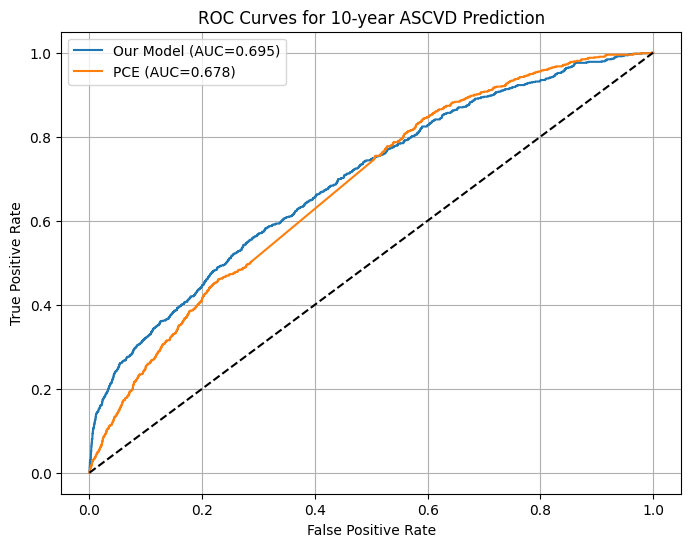

In [157]:
compare_with_pce(model,pce_df)

In [167]:
results = evaluate_major_diseases( model, Y_100k, E_100k, disease_names, pce_df,Y,enrollment_df)


Evaluating ASCVD...
AUC: 0.695
Events: 831 (8.3%)

Evaluating Diabetes...
AUC: 0.627
Events: 581 (5.8%)

Evaluating Atrial_Fib...
AUC: 0.678
Events: 376 (3.8%)

Evaluating CKD...
AUC: 0.707
Events: 207 (2.1%)

Evaluating All_Cancers...
AUC: 0.637
Events: 763 (7.6%)

Evaluating Stroke...
AUC: 0.654
Events: 129 (1.3%)

Evaluating Heart_Failure...
AUC: 0.697
Events: 205 (2.0%)

Evaluating Pneumonia...
AUC: 0.682
Events: 335 (3.4%)

Evaluating COPD...
AUC: 0.645
Events: 394 (3.9%)

Evaluating Hip_Fracture...
No matching diseases found for Hip_Fracture

Evaluating Osteoporosis...
AUC: 0.666
Events: 219 (2.2%)

Evaluating Anemia...
AUC: 0.593
Events: 523 (5.2%)

Evaluating Alzheimer...
No matching diseases found for Alzheimer

Evaluating Esophageal_Cancer...
No matching diseases found for Esophageal_Cancer

Evaluating Colorectal_Cancer...
AUC: 0.659
Events: 105 (1.0%)

Evaluating Breast_Cancer...
AUC: 0.582
Events: 216 (2.2%)

Evaluating Prostate_Cancer...
AUC: 0.681
Events: 204 (2.0%)

Eva

/var/folders/fl/ng5crz0x0fnb6c6x8dk7tfth0000gn/T/ipykernel_94256/770735183.py:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint=torch.load("/Users/sarahurbut/Dropb

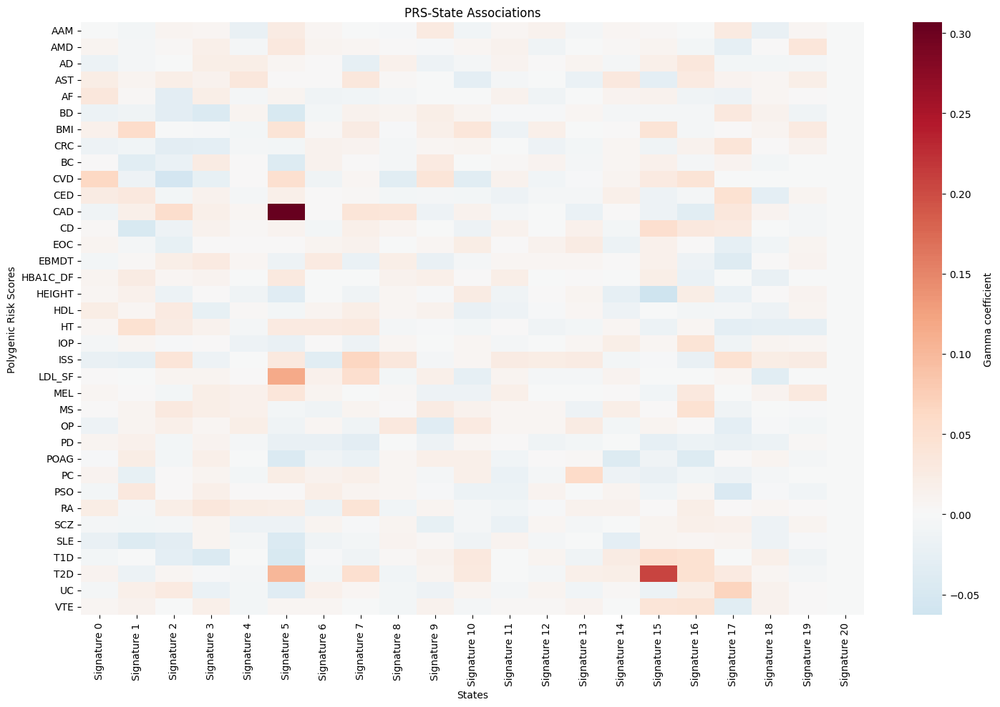

In [190]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Read PRS names
checkpoint=torch.load("/Users/sarahurbut/Dropbox/resultshighamp/results/output_0_10000/model.pt")
prs_names = pd.read_csv('/Users/sarahurbut/Dropbox/prs_names.csv')

def plot_gamma_heatmap(gamma, prs_names):
    """
    Create heatmap of gamma (PRS-state relationships) with trait names
    
    Args:
        gamma: numpy array of shape (n_prs, n_states)
        prs_names: dataframe or list of PRS trait names
    """
    plt.figure(figsize=(15, 10))
    
    # Create heatmapD

    trait_labels = prs_names.iloc[:, 0].tolist()
    sns.heatmap(gamma,
                xticklabels=[f'Signature {i}' for i in range(gamma.shape[1])],
                yticklabels=trait_labels,
                cmap='RdBu_r',
                center=0,
                fmt='.2f',
                cbar_kws={'label': 'Gamma coefficient'})
    
    plt.title('PRS-State Associations')
    plt.xlabel('States')
    plt.ylabel('Polygenic Risk Scores')
    
    # Rotate y-axis labels for readability
    plt.yticks(rotation=0)
    plt.tight_layout()
    plt.show()

plot_gamma_heatmap(checkpoint['model_state_dict']['gamma'], prs_names)

In [202]:
def calculate_prs_temporal_effects(gamma, phi, K=None):
    """
    Project PRS effects through temporal kernel
    gamma: (36 PRS, 21 states)
    K: (T×T) temporal kernel
    
    Returns: PRS effects over time accounting for temporal correlation structure
    """
    # Convert from Parameter to numpy
    gamma = gamma.detach().data.numpy()
    
    # First get the raw temporal effects
    raw_effects = gamma @ phi  # (36 PRS × T timepoints)
    
    # Project through kernel
    smoothed_effects = raw_effects @ K  # (36 PRS × T timepoints)
    
    return smoothed_effects

def plot_prs_trajectories(temporal_effects, prs_names, uncertainty=None):
    """
    Plot temporal trajectories of PRS effects
    """
    plt.figure(figsize=(12, 8))
    
    for i in range(len(prs_names)):
        plt.plot(temporal_effects[i], label=prs_names.iloc[i,0])
        
        if uncertainty is not None:
            lower, upper = uncertainty
            plt.fill_between(range(len(temporal_effects[i])),
                           lower[i], upper[i],
                           alpha=0.2)
    
    plt.xlabel('Age')
    plt.ylabel('PRS Effect')
    plt.title('Temporal Evolution of PRS Effects')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()

In [206]:

def calculate_prs_temporal_effects(gamma, kernel, n_timepoints=52):
    """
    Calculate temporal effects of PRS
    gamma: (36 PRS, 21 states) - fixed mean effects
    kernel: (52 × 52) temporal correlation structure
    
    Returns: 
    - baseline_effects: mean shift for each PRS
    - temporal_variation: how these effects vary over time due to kernel
    """
    # Convert from Parameter to numpy
    gamma_np = gamma.detach().data.numpy()
    
    # Calculate baseline effects (mean shift)
    baseline_effects = np.mean(gamma_np, axis=1)  # (36,) - one per PRS
    
    # Get temporal variation from kernel
    temporal_variation = np.diag(kernel)  # or other appropriate kernel transformation
    
    # For each PRS, we can then show:
    # total_effect(t) = baseline_effect + temporal_variation(t)
    
    return baseline_effects, temporal_variation

# We could then plot:
def plot_prs_effects(baseline_effects, temporal_variation, prs_names):
    plt.figure(figsize=(12, 6))
    
    # Plot a few example PRS
    for i in range(min(5, len(baseline_effects))):
        effect = baseline_effects[i]
        # Show mean effect plus temporal variation
        plt.plot(effect + temporal_variation, label=f'PRS {i}')
        # Show mean as horizontal line
        plt.axhline(y=effect, linestyle='--', alpha=0.3)
    
    plt.xlabel('Time')
    plt.ylabel('Effect Size')
    plt.title('PRS Effects Over Time')
    plt.legend()

p type: <class 'tuple'>
p contents shape: [(36,), (52,)]


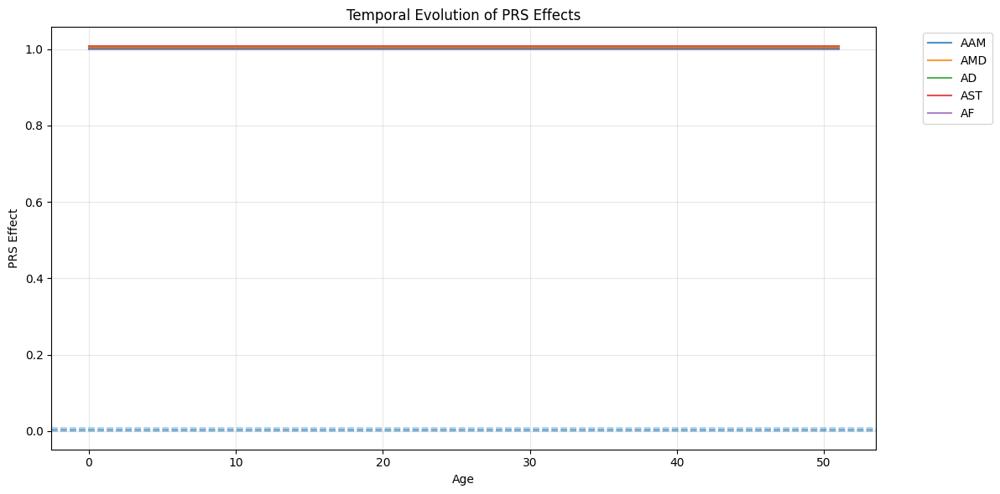

In [211]:
p=calculate_prs_temporal_effects(model.gamma, model.K_phi, n_timepoints=model.K_phi.shape[0])

# First let's inspect what we have
print("p type:", type(p))
print("p contents shape:", [x.shape if hasattr(x, 'shape') else len(x) for x in p])

def plot_prs_trajectories(baseline_effects, temporal_variation, prs_names, n_to_plot=5):
    """
    Plot temporal trajectories for PRS effects
    
    Args:
        baseline_effects: first element of p (mean effects)
        temporal_variation: second element of p (temporal structure)
        prs_names: list/array of PRS names
        n_to_plot: number of top PRS to plot (default=5)
    """
    plt.figure(figsize=(12, 6))
    
    # Plot top n_to_plot PRS
    for i in range(min(n_to_plot, len(prs_names))):
        effect = baseline_effects[i]
        plt.plot(effect + temporal_variation, 
                label=prs_names.iloc[i,0], 
                alpha=0.8)
        plt.axhline(y=effect, linestyle='--', alpha=0.3)
    
    plt.xlabel('Age')
    plt.ylabel('PRS Effect')
    plt.title('Temporal Evolution of PRS Effects')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

# Unpack the tuple and plot
baseline_effects, temporal_variation = p
plot_prs_trajectories(baseline_effects, temporal_variation, prs_names)

Baseline effects range: -0.008547177 0.023232773
Temporal variation range: 1.000001 1.000001


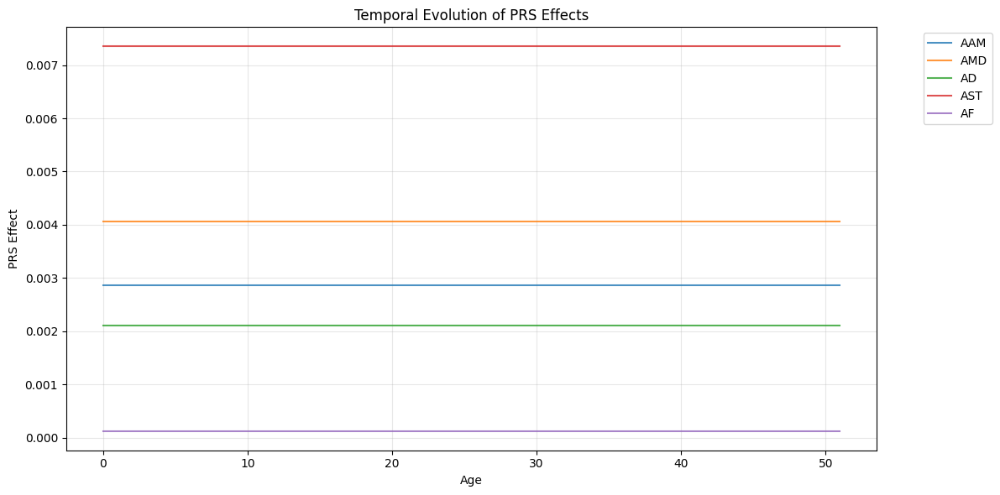

In [212]:
def plot_prs_trajectories(baseline_effects, temporal_variation, prs_names, n_to_plot=5):
    """
    Plot temporal trajectories for PRS effects
    
    Args:
        baseline_effects: (36,) array of PRS effects
        temporal_variation: (52,) array of temporal values
        prs_names: list/array of PRS names
        n_to_plot: number of top PRS to plot (default=5)
    """
    plt.figure(figsize=(12, 6))
    
    # For each PRS, we want to show how its effect varies over time
    for i in range(min(n_to_plot, len(baseline_effects))):
        # Each baseline effect should be modulated by the temporal variation
        trajectory = baseline_effects[i] * temporal_variation
        plt.plot(trajectory, label=prs_names.iloc[i,0], alpha=0.8)
    
    plt.xlabel('Age')
    plt.ylabel('PRS Effect')
    plt.title('Temporal Evolution of PRS Effects')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.grid(True, alpha=0.3)
    plt.tight_layout()

# Let's also print the values to debug
print("Baseline effects range:", np.min(p[0]), np.max(p[0]))
print("Temporal variation range:", np.min(p[1]), np.max(p[1]))

# Plot
plot_prs_trajectories(p[0], p[1], prs_names)

In [213]:
p

(array([ 0.00285613,  0.00406315,  0.00210836,  0.00735188,  0.00012414,
        -0.00300862,  0.01202922, -0.00043456,  0.00021605,  0.00297215,
         0.00341131,  0.02077004,  0.00480805,  0.00223235,  0.00138305,
         0.00466273, -0.00413826,  0.00036025,  0.00236926,  0.00165676,
         0.01001409,  0.00893012,  0.00614174,  0.00750136,  0.00291599,
        -0.00699928, -0.0045955 ,  0.00164093, -0.000342  ,  0.0078844 ,
        -0.00060405, -0.00854718,  0.00173534,  0.02323277,  0.00277153,
         0.00588618], dtype=float32),
 array([1.000001, 1.000001, 1.000001, 1.000001, 1.000001, 1.000001,
        1.000001, 1.000001, 1.000001, 1.000001, 1.000001, 1.000001,
        1.000001, 1.000001, 1.000001, 1.000001, 1.000001, 1.000001,
        1.000001, 1.000001, 1.000001, 1.000001, 1.000001, 1.000001,
        1.000001, 1.000001, 1.000001, 1.000001, 1.000001, 1.000001,
        1.000001, 1.000001, 1.000001, 1.000001, 1.000001, 1.000001,
        1.000001, 1.000001, 1.000001, 1.000